<a href="https://colab.research.google.com/github/bhuvaneswarignanasekar/Experiment-on-CNN-/blob/main/deep_learning_project_Y_network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#                             DEEP LEARNING PROJECT  
#                               Y-NETWORK CNN

In [ ]:
# check for GPU
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if not device_name:
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


#3 Layers

In [ ]:
import numpy as np
import tensorflow as tf

from tensorflow.keras.layers import Dense, Dropout ,  Flatten,  Conv2D, MaxPooling2D
from tensorflow.keras.layers import Input , concatenate 
from tensorflow.keras.models import Model
from tensorflow.keras.datasets import mnist

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from matplotlib import pyplot
from numpy import expand_dims
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import warnings
warnings.filterwarnings('ignore')

seed=1234
tf.random.set_seed(seed)

In [ ]:
def dataset(data):
  if data==1:
    (x_train, y_train), (x_test, y_test) =tf.keras.datasets.cifar10.load_data() 
    y_train = y_train.flatten()
    y_test = y_test.flatten()
    y_train=tf.one_hot(y_train,10, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    y_test=tf.one_hot(
        y_test,10, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
      
    # normalize image pixel values by dividing 
    # by 255
    gray_scale = 255
    x_train /= gray_scale
    x_test /= gray_scale
  else:
    (x_train, y_train), (x_test, y_test)=tf.keras.datasets.cifar100.load_data(label_mode="fine")
    y_train = y_train.flatten()
    y_test = y_test.flatten()
    y_train=tf.one_hot( y_train,100, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    y_test=tf.one_hot(
        y_test,100, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
      
    # normalize image pixel values by dividing 
    # by 255
    gray_scale = 255
    x_train /= gray_scale
    x_test /= gray_scale
  return x_train,y_train,x_test, y_test
def right_left_branch(start_filters):
  #parameters
  #input_shape = (image_size, image_size, 1)
  input_shape=(32, 32, 3)
  batch_size = 32
  kernel_size =(3,3)
  dropout = 0.4
  #left branch of Y network
  left_inputs = Input(shape=input_shape )
  x = left_inputs
  filters = start_filters

  """
  Create 3 layers of Conv2D , Dropout,and Maxpooling2D  
  and after every loop double the filters
  """
  for i in range(3):
      x = Conv2D(filters = filters,kernel_size = kernel_size,padding = 'same', activation = 'relu')(x)
      x = Dropout(dropout)(x)
      x = MaxPooling2D()(x)
      filters *= 2
  right_inputs = Input(shape = input_shape)
  y = right_inputs
  filters = start_filters
  """
  Create 3 layers of Conv2D , Dropout,and Maxpooling2D  
  and after every loop double the filters
  """
  for i in range(3):
      y = Conv2D(filters = filters,kernel_size = kernel_size,padding = 'same', 
                activation = 'relu',dilation_rate =2)(y)
      y = Dropout(dropout)(y)
      y = MaxPooling2D()(y)
      filters *= 2
  return x,y,left_inputs,right_inputs
def conc_network(x,y,dropout,size):
  #now lets merge the 2 networsk
  y = concatenate([x,y])

  #now lets start with thr dense layers
  y = Flatten()(y)
  y = Dropout(dropout)(y)
  outputs = Dense(size , activation = 'softmax')(y)


  #now lets build the model
  model = Model(inputs = [left_inputs, right_inputs], outputs = outputs)

  #plot_model(model, to_file='cnn-Y-network.png', show_shapes=True)
  # verify the model using layer text description
  model.summary()
  return model
def train(model,optim,epoch):
  model.compile(loss='categorical_crossentropy',
                optimizer=optim,
                metrics=['accuracy'])


  model.fit([x_train,x_train],
              y_train,
              validation_data=([x_test,x_test], y_test),
              epochs=epoch,
              batch_size=500)

  score = model.evaluate([x_test,x_test],
                            y_test,
                            batch_size=500,
                            verbose=2)

  print("\nTest accuracy: %.1f%%" % (100.0 * score[1]))
  return model


In [ ]:
def displaylayer(model):
  for i in range(len(model.layers)):
      layer = model.layers[i]
      if 'conv' not in layer.name:
          continue    
      print(i , layer.name , layer.output.shape)
def featuremap(fig,features,grid):
  for i in range(1,features.shape[3]+1):
      
      pyplot.subplot(grid,grid,i)
      
      pyplot.imshow(features[0,:,:,i-1] , cmap='gray')
      
  pyplot.show()

# Optimizer Adam and Filter(32,64,128)

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 32, 32, 32)   896         ['input_3[0][0]']                
                                                                                                  
 conv2d_9 (Conv2D)              (None, 32, 32, 32)   896         ['input_4[0][0]']                
                                                                                            

In [ ]:
displaylayer(model)

2 conv2d_6 (None, 32, 32, 32)
3 conv2d_9 (None, 32, 32, 32)
8 conv2d_7 (None, 16, 16, 64)
9 conv2d_10 (None, 16, 16, 64)
14 conv2d_8 (None, 8, 8, 128)
15 conv2d_11 (None, 8, 8, 128)


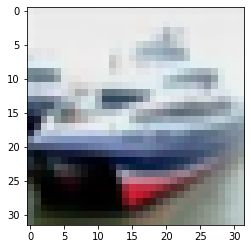

layer::::: 1


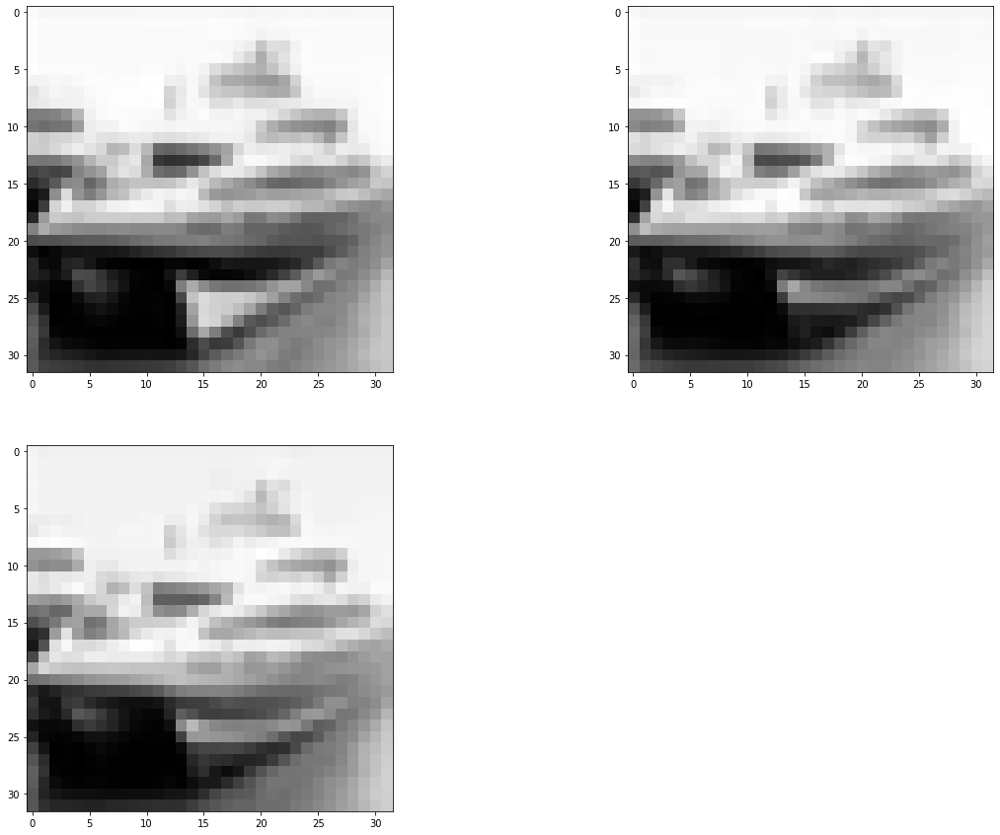

layer::::: 2


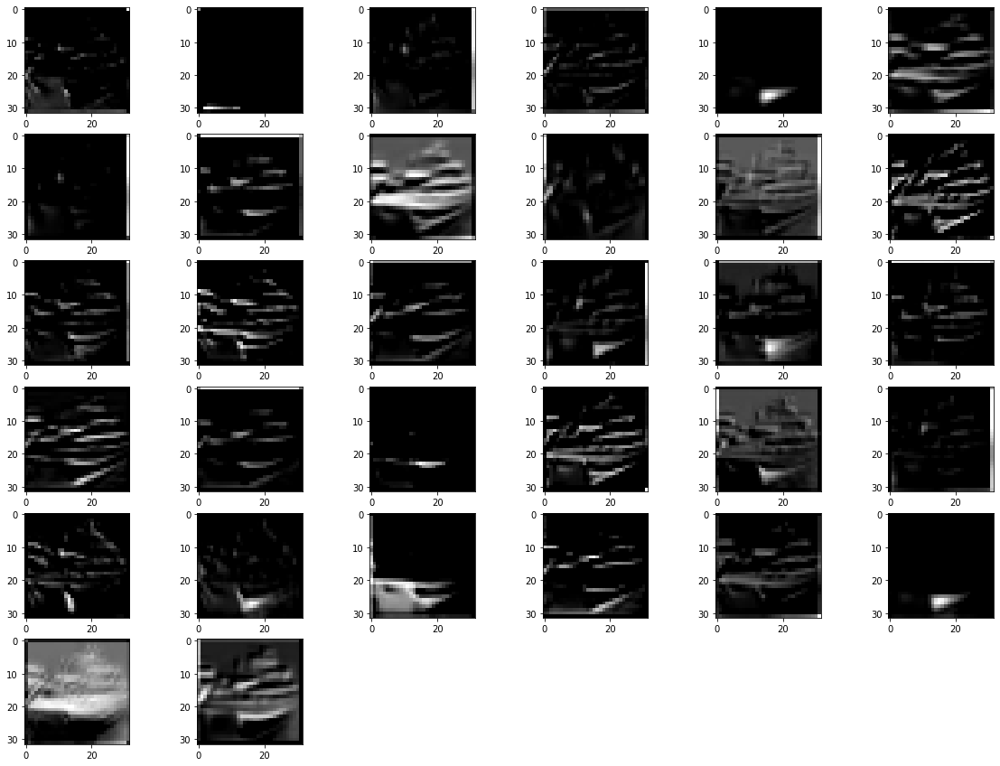

layer::::: 3


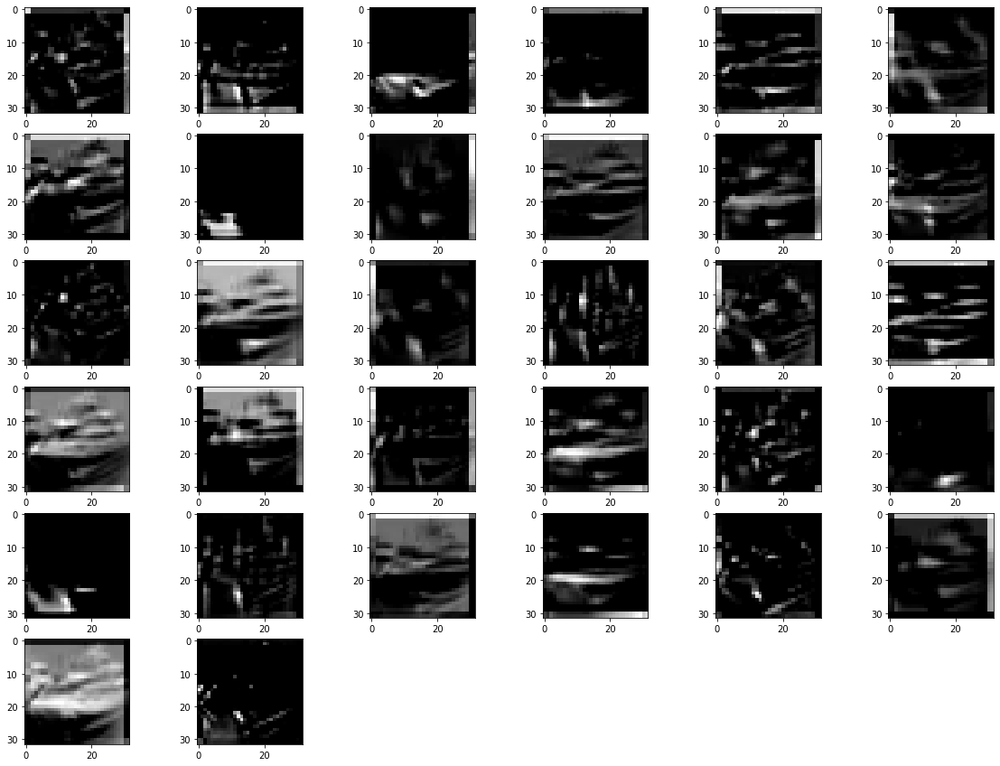

layer::::: 8


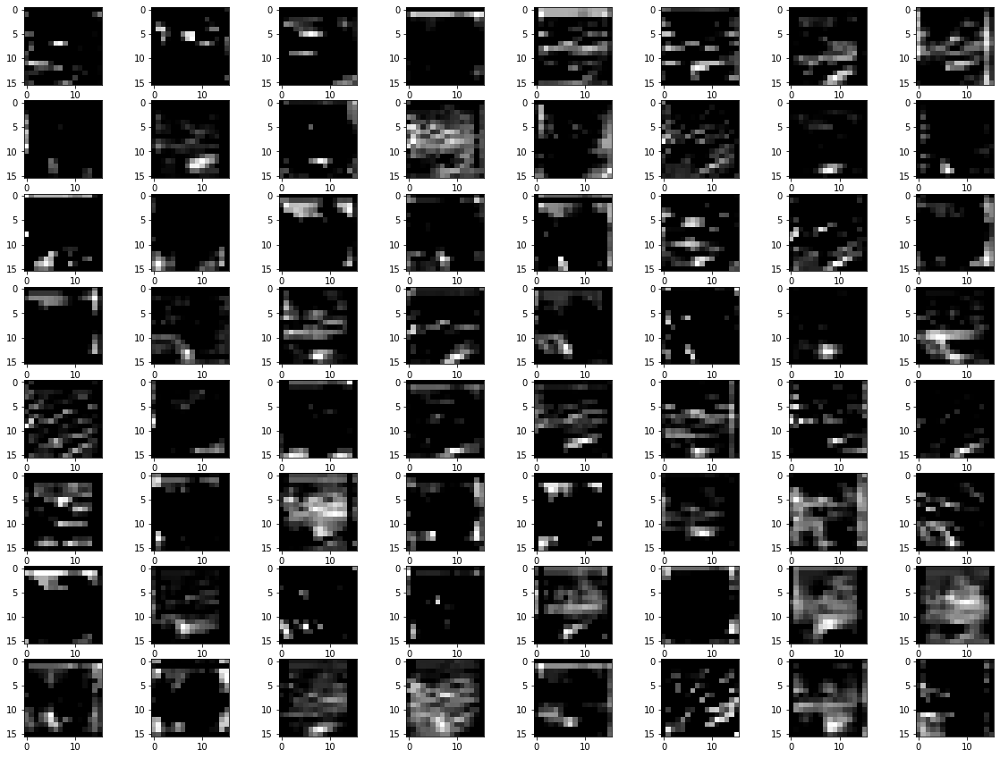

layer::::: 9


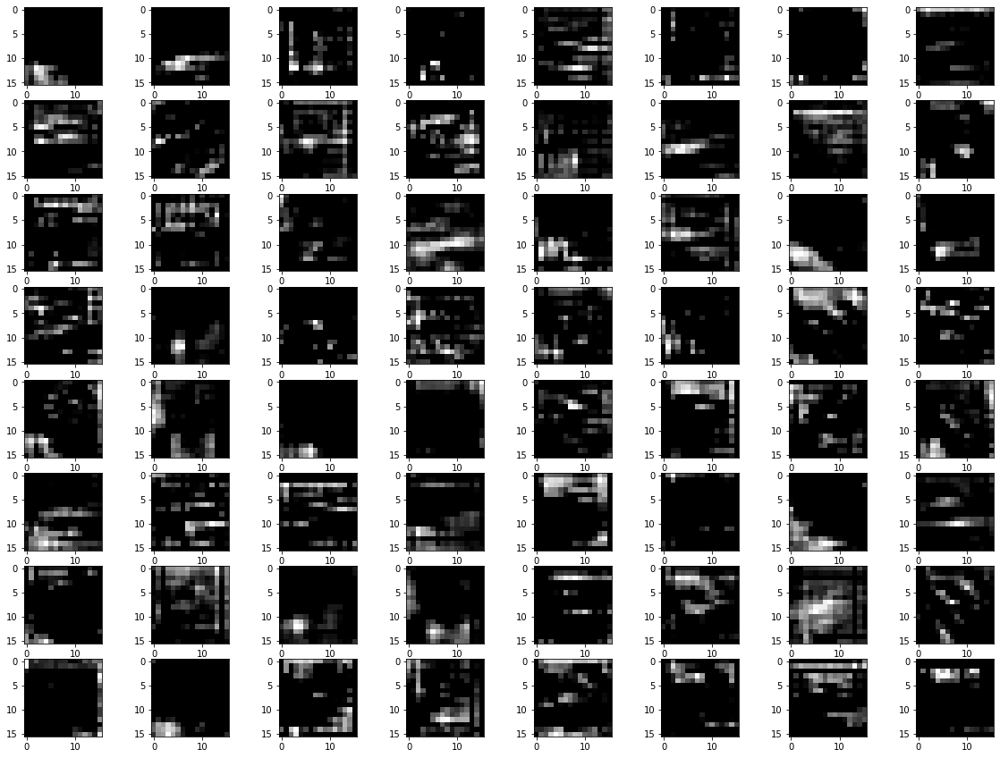

layer::::: 14


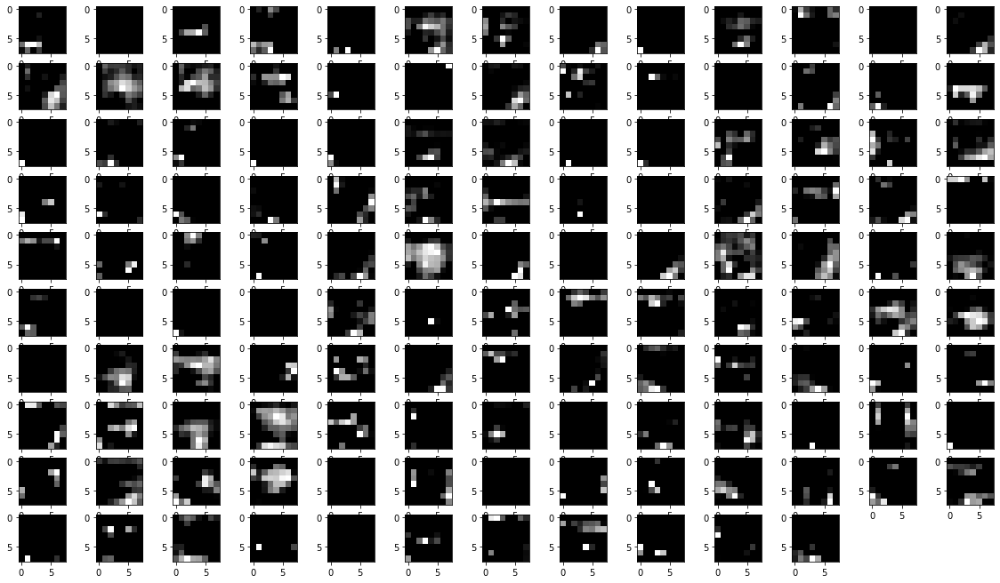

layer::::: 15


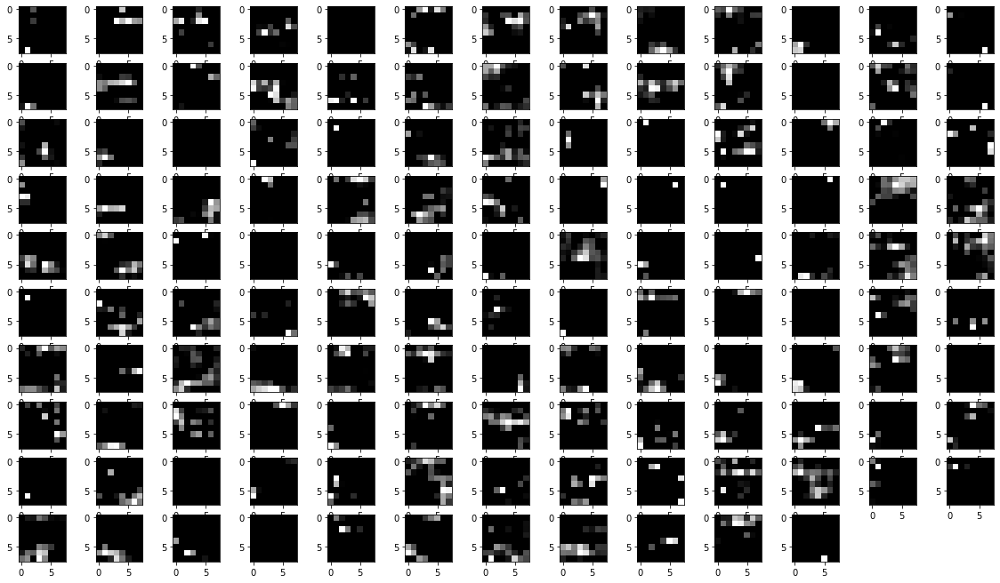

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_18 (Conv2D)             (None, 32, 32, 32)   896         ['input_7[0][0]']                
                                                                                                  
 conv2d_21 (Conv2D)             (None, 32, 32, 32)   896         ['input_8[0][0]']                
                                                                                           

2 conv2d_18 (None, 32, 32, 32)
3 conv2d_21 (None, 32, 32, 32)
8 conv2d_19 (None, 16, 16, 64)
9 conv2d_22 (None, 16, 16, 64)
14 conv2d_20 (None, 8, 8, 128)
15 conv2d_23 (None, 8, 8, 128)


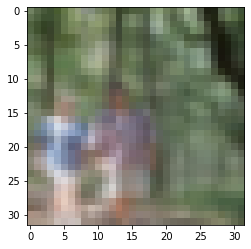

layer::::: 1


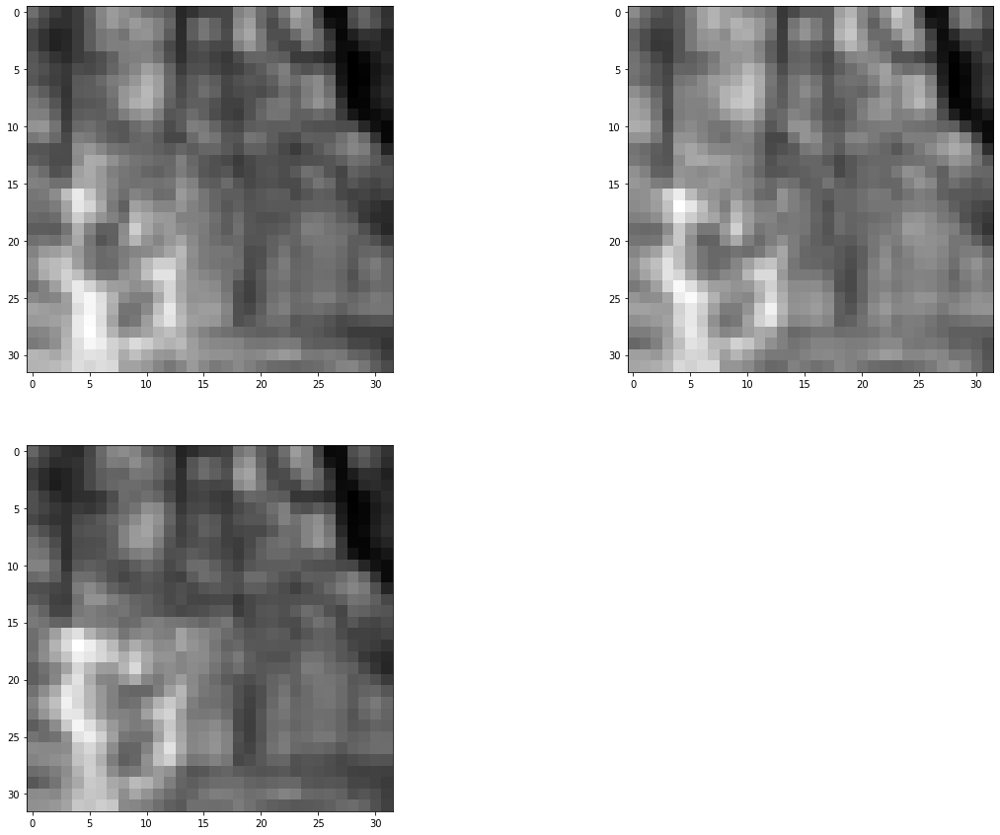

layer::::: 2


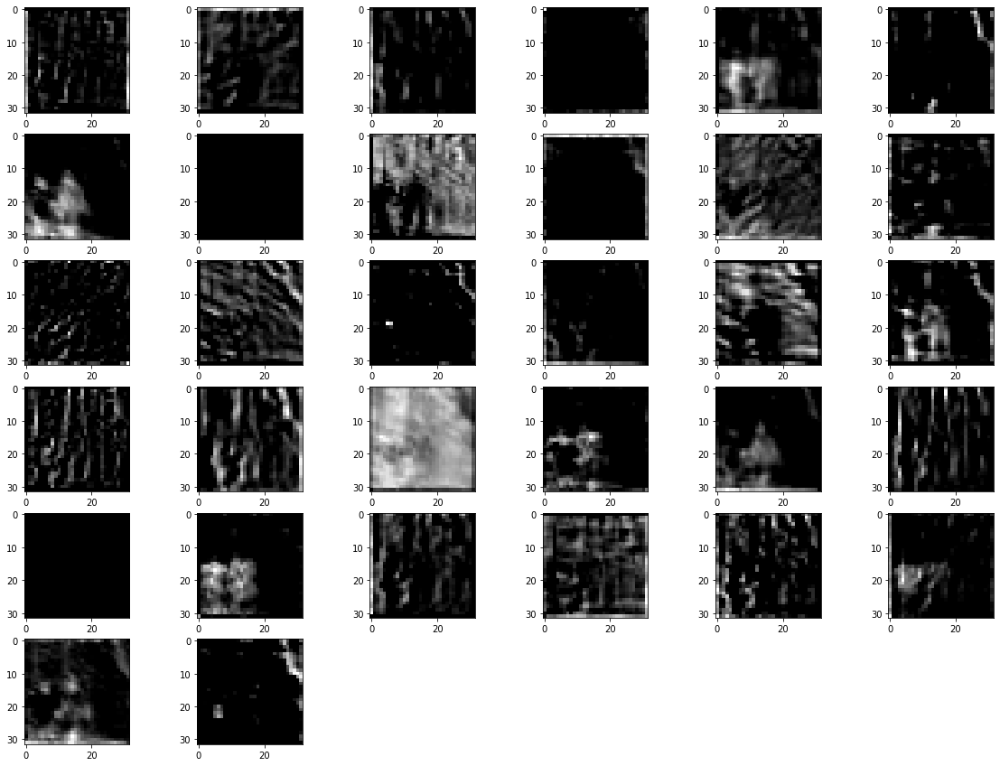

layer::::: 3


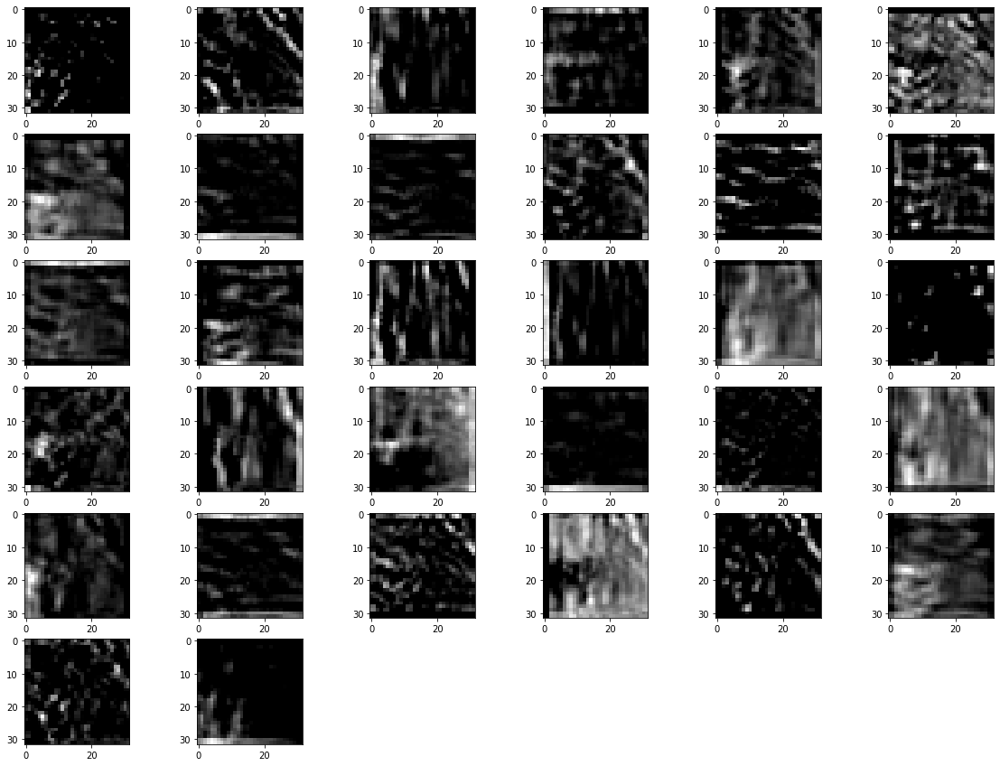

layer::::: 8


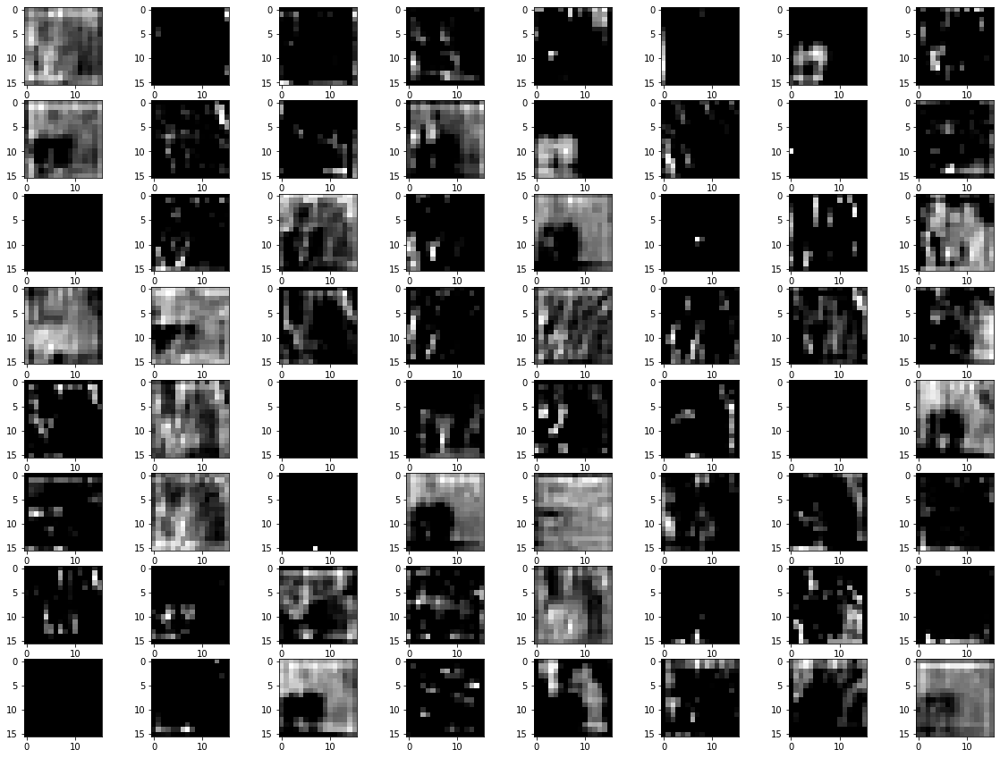

layer::::: 9


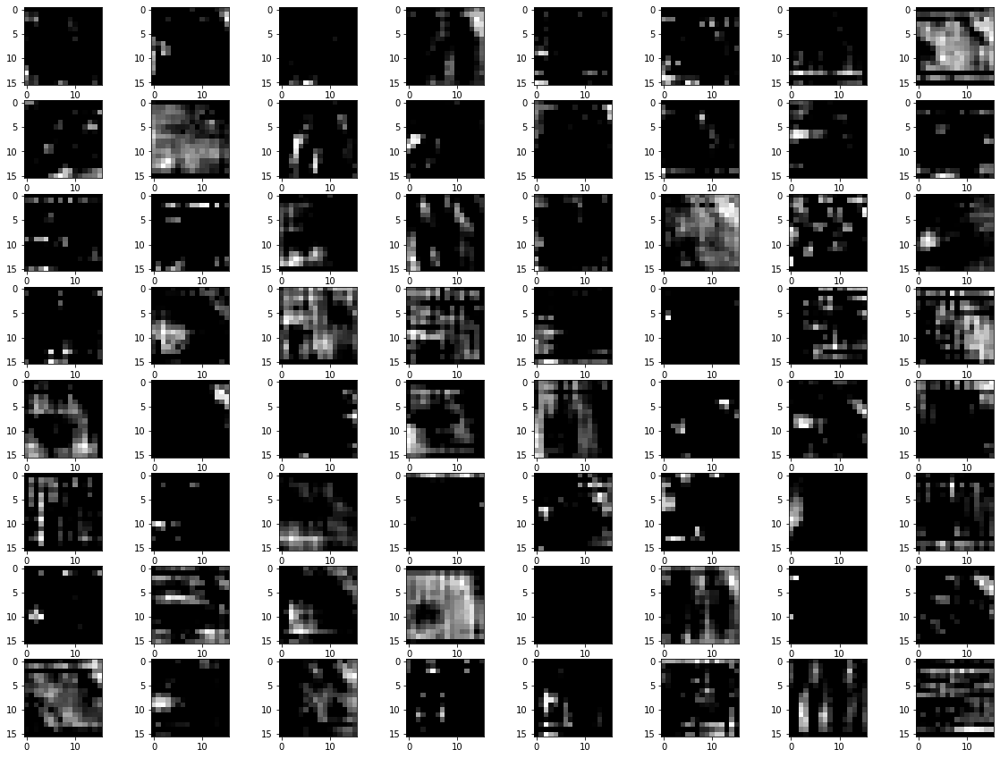

layer::::: 14


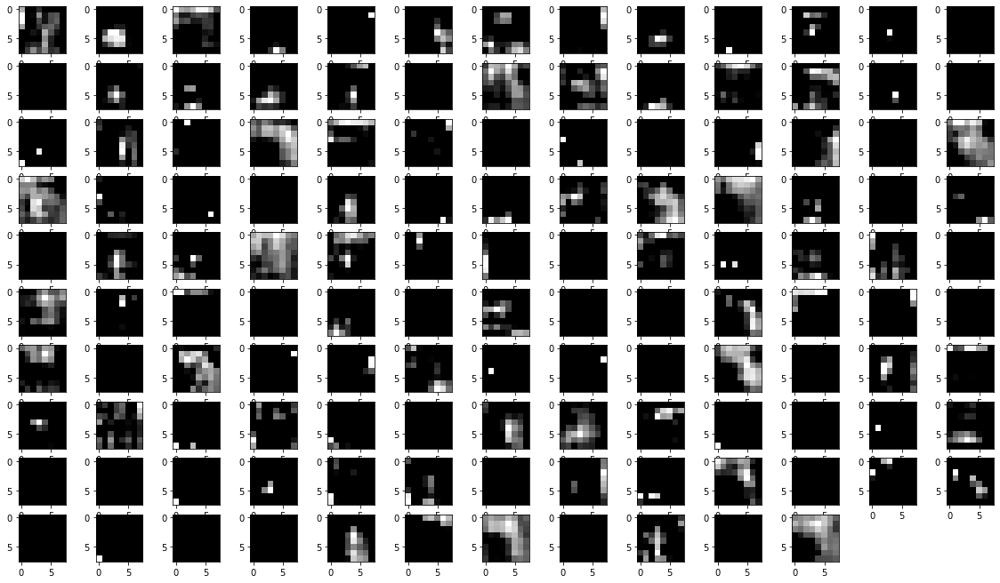

layer::::: 15


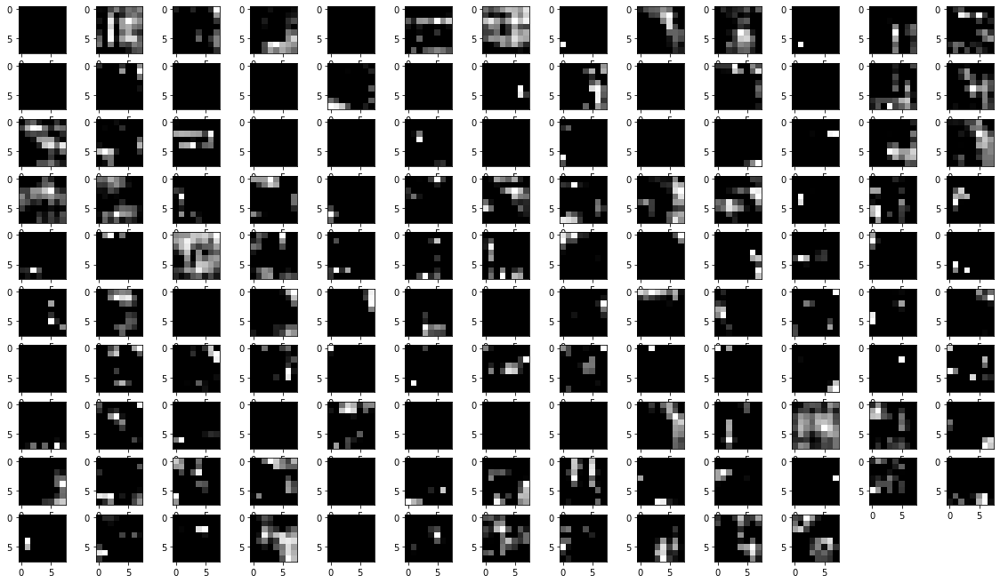

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

#Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model_18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_10 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_24 (Conv2D)             (None, 32, 32, 32)   896         ['input_9[0][0]']                
                                                                                                  
 conv2d_27 (Conv2D)             (None, 32, 32, 32)   896         ['input_10[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_24 (None, 32, 32, 32)
3 conv2d_27 (None, 32, 32, 32)
8 conv2d_25 (None, 16, 16, 64)
9 conv2d_28 (None, 16, 16, 64)
14 conv2d_26 (None, 8, 8, 128)
15 conv2d_29 (None, 8, 8, 128)


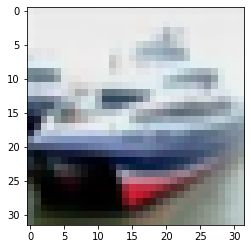

layer::::: 1


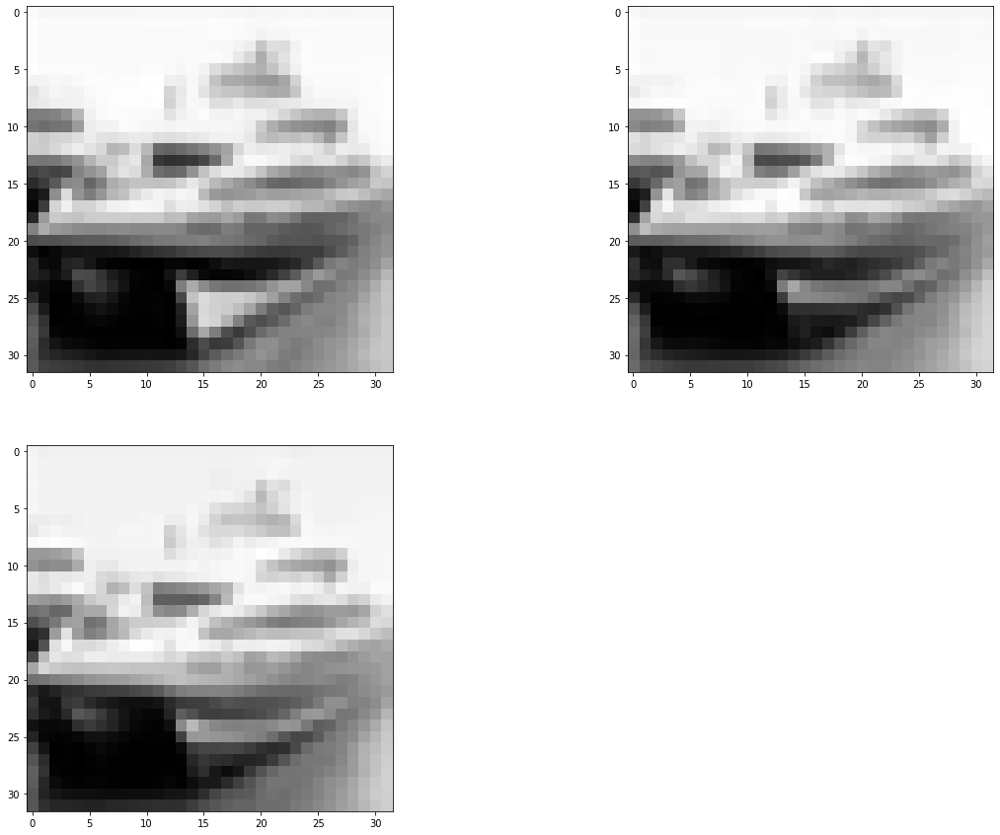

layer::::: 2


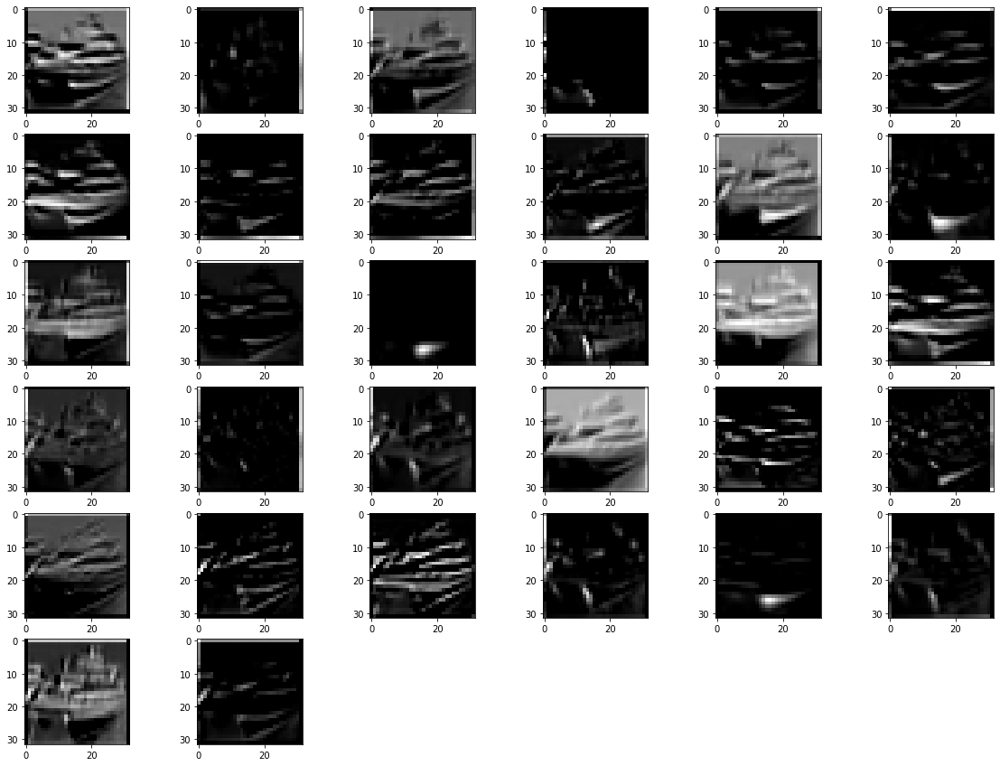

layer::::: 3


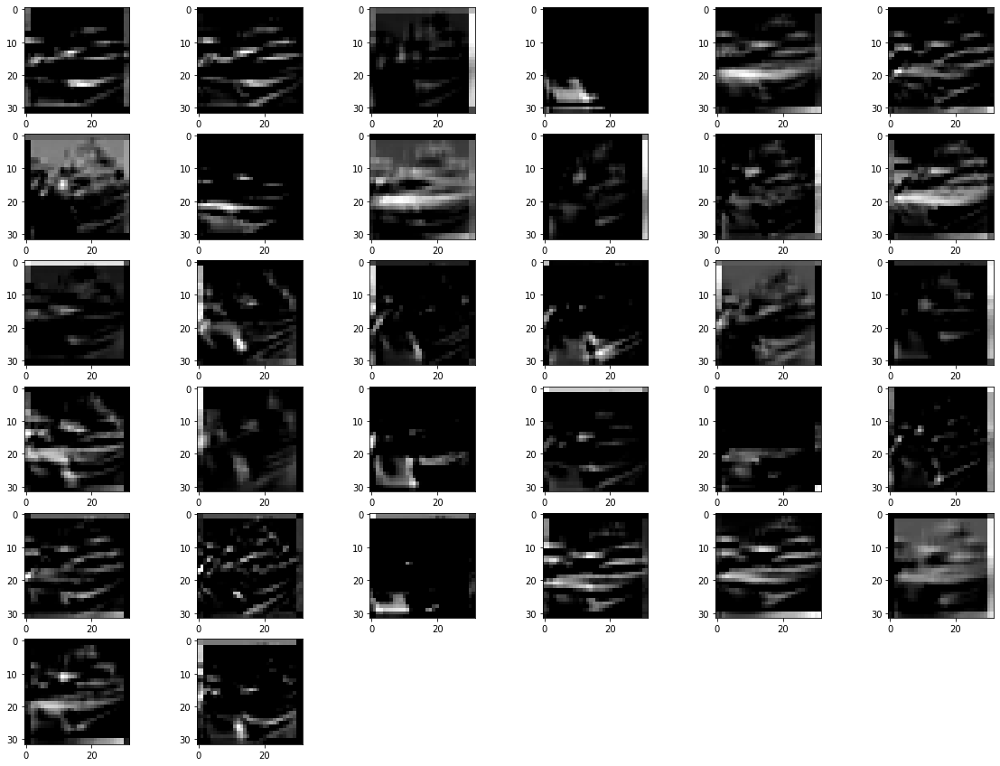

layer::::: 8


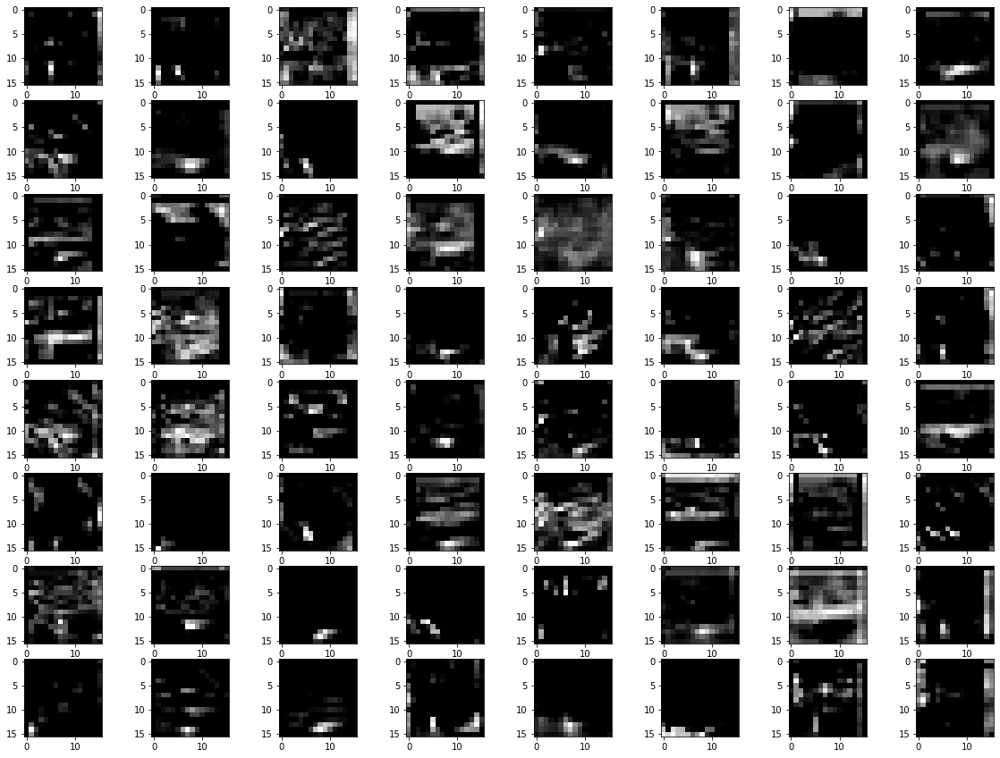

layer::::: 9


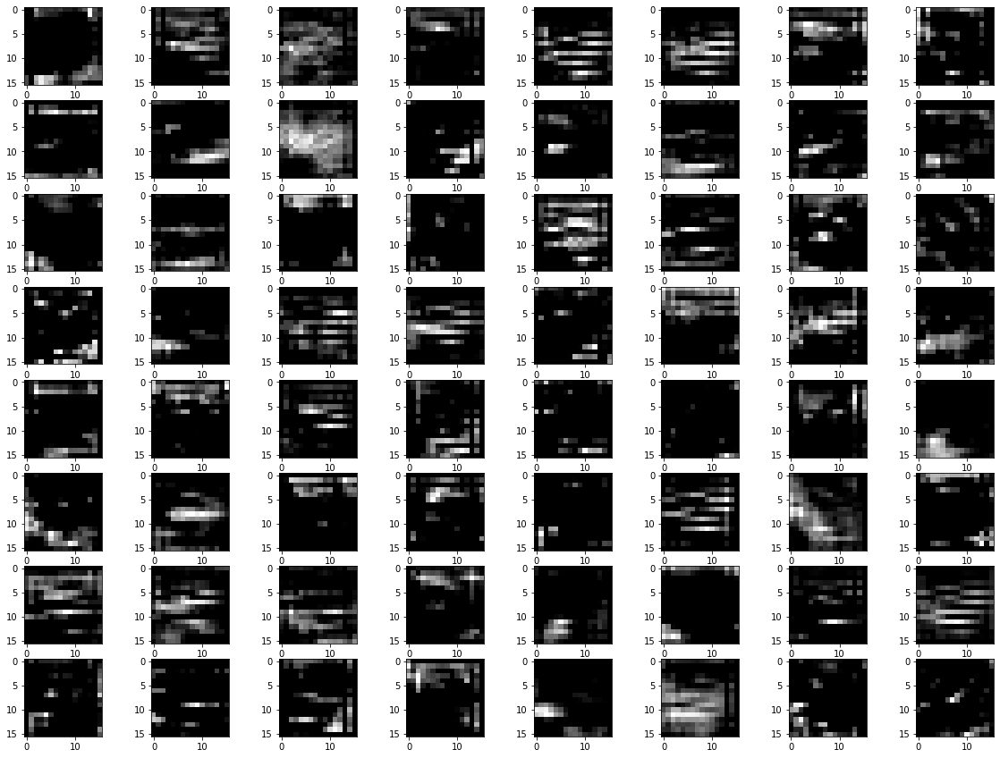

layer::::: 14


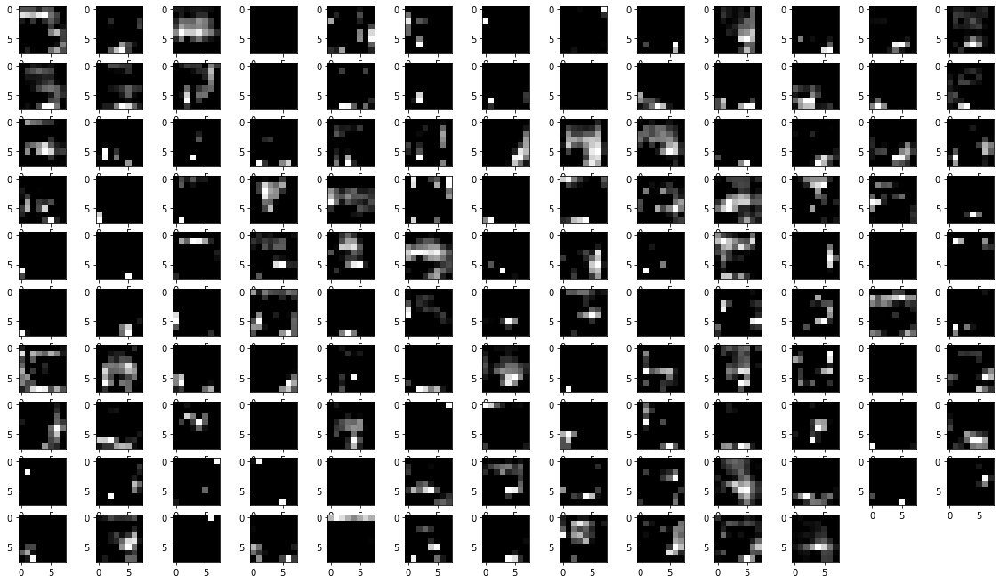

layer::::: 15


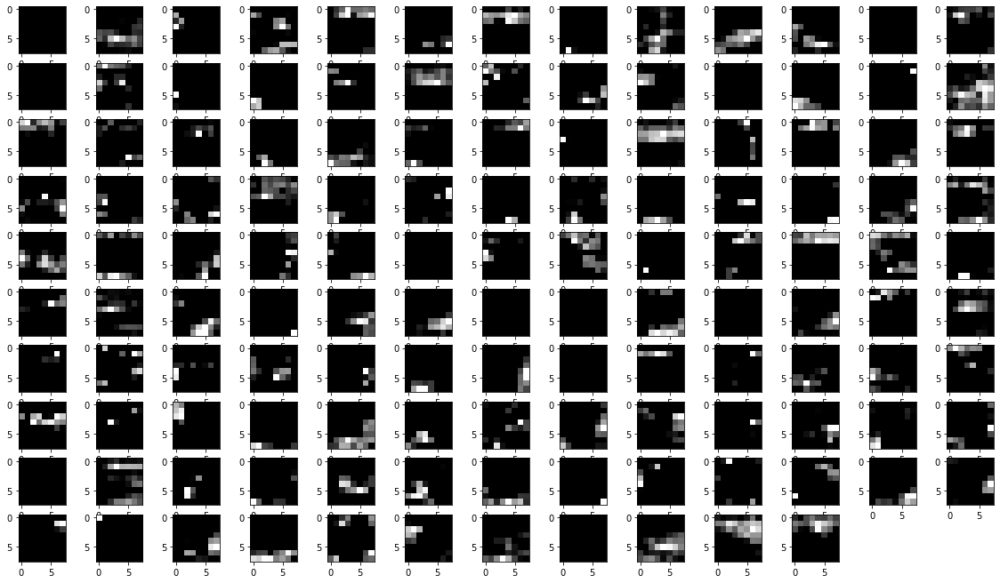

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_12 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_30 (Conv2D)             (None, 32, 32, 32)   896         ['input_11[0][0]']               
                                                                                                  
 conv2d_33 (Conv2D)             (None, 32, 32, 32)   896         ['input_12[0][0]']               
                                                                                           

2 conv2d_30 (None, 32, 32, 32)
3 conv2d_33 (None, 32, 32, 32)
8 conv2d_31 (None, 16, 16, 64)
9 conv2d_34 (None, 16, 16, 64)
14 conv2d_32 (None, 8, 8, 128)
15 conv2d_35 (None, 8, 8, 128)


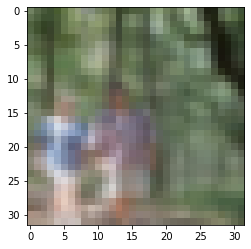

layer::::: 1


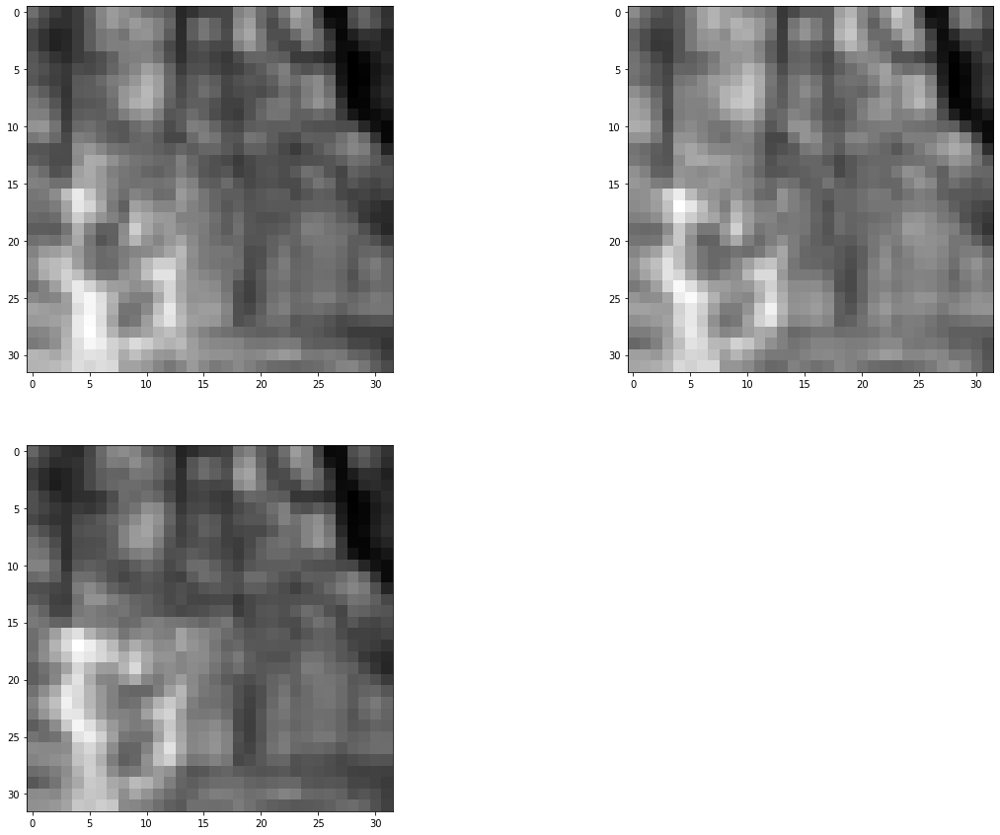

layer::::: 2


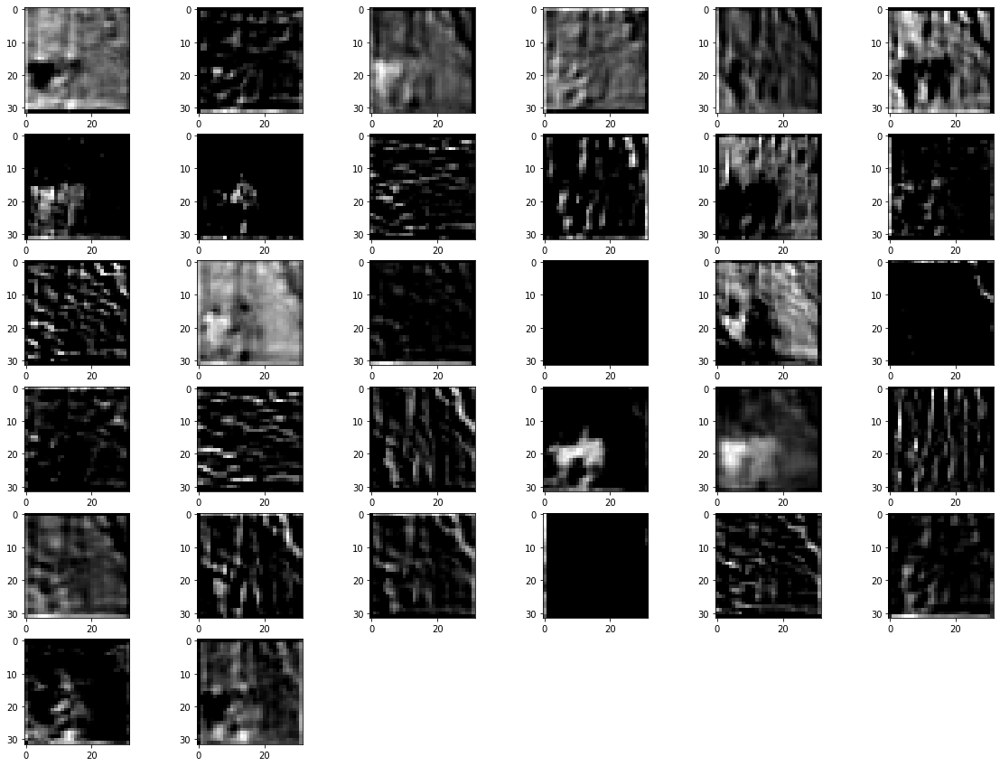

layer::::: 3


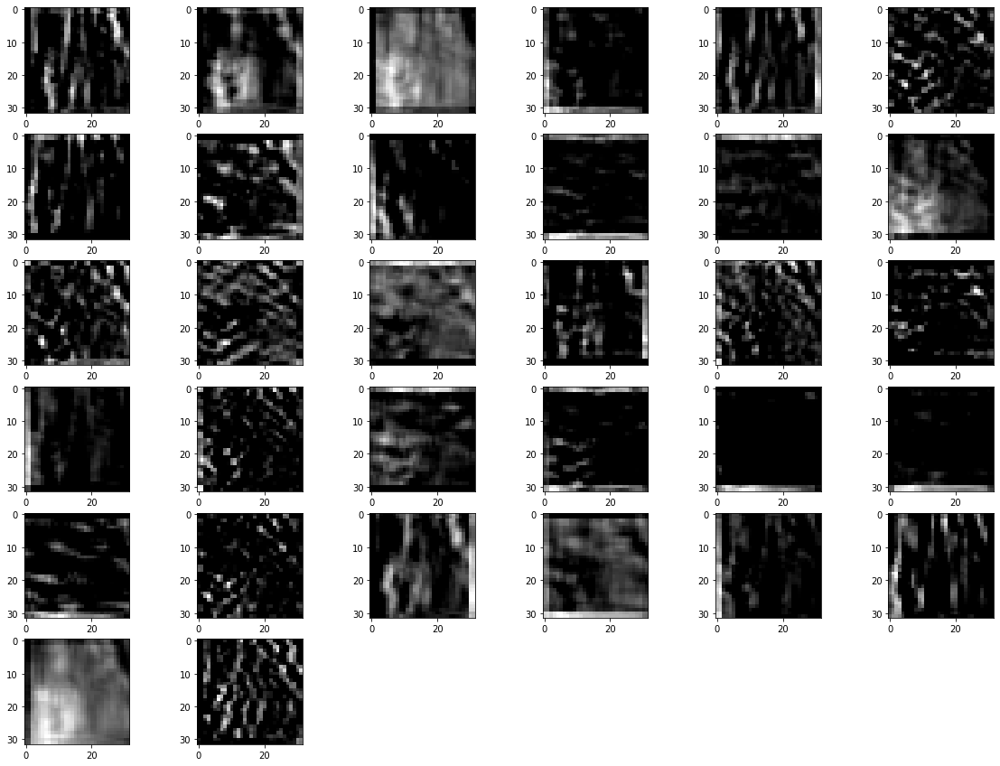

layer::::: 8


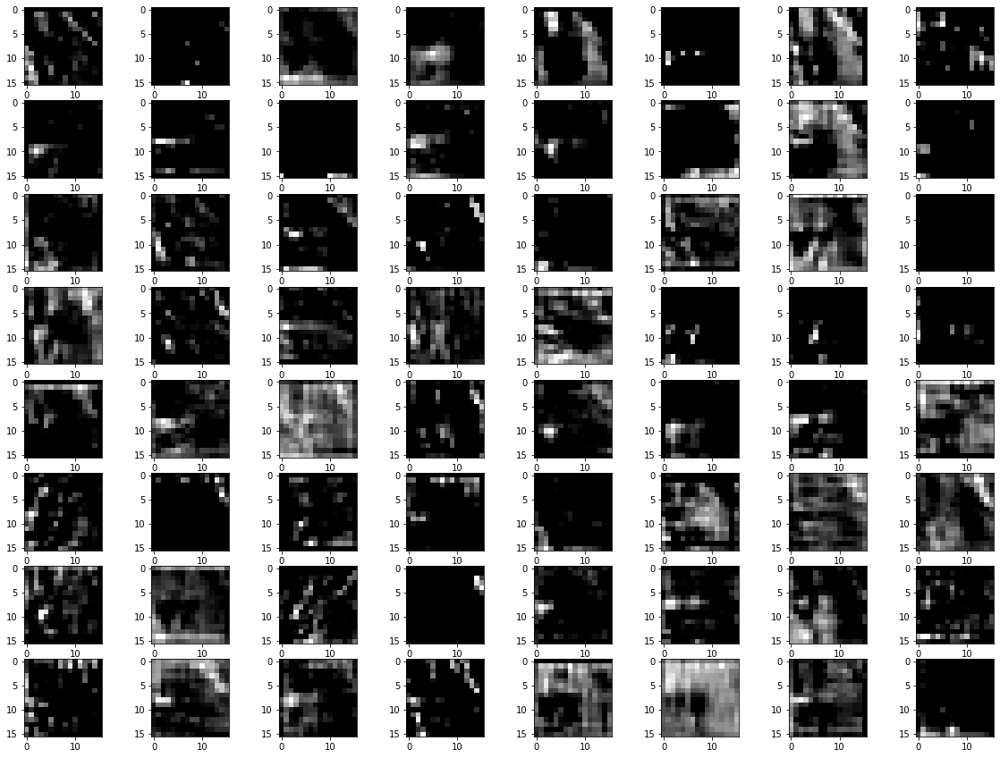

layer::::: 9


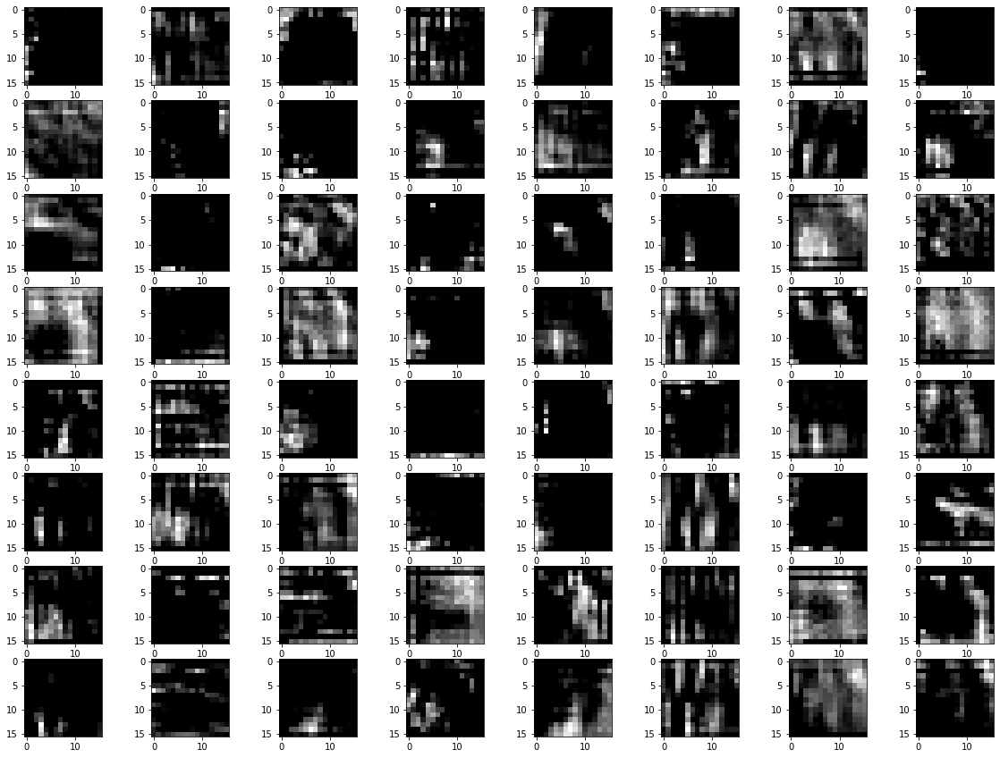

layer::::: 14


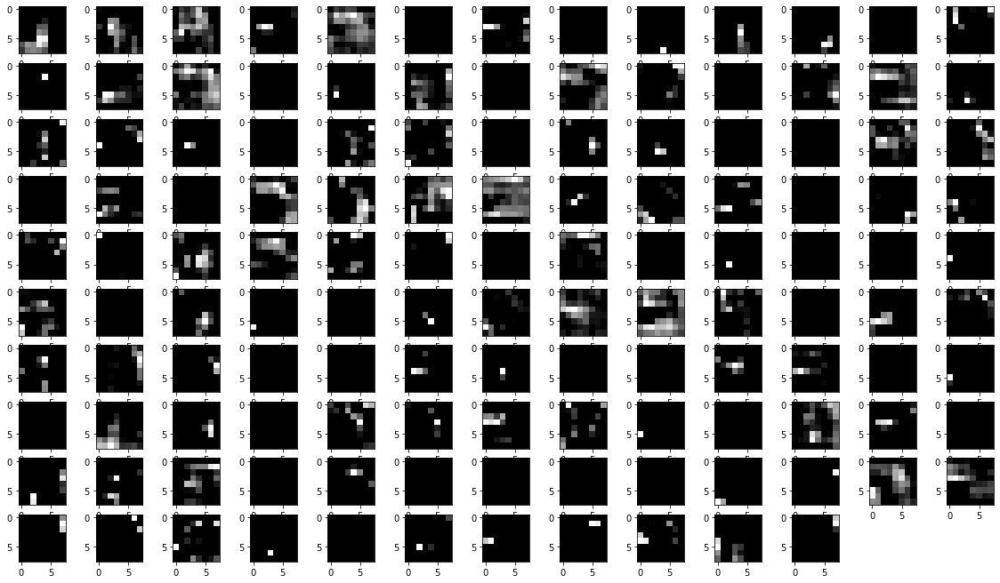

layer::::: 15


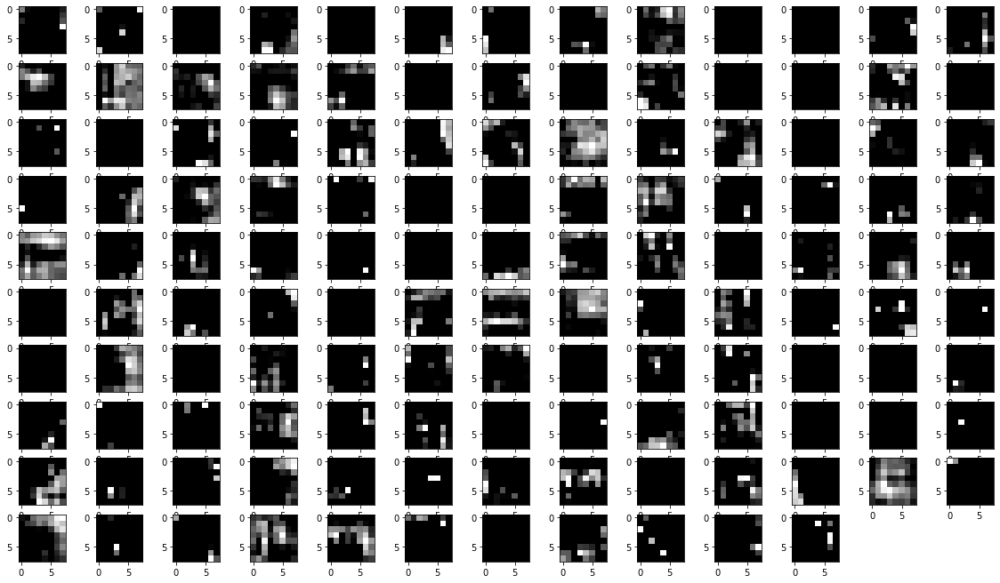

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.2

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.2

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model_34"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_14 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_36 (Conv2D)             (None, 32, 32, 32)   896         ['input_13[0][0]']               
                                                                                                  
 conv2d_39 (Conv2D)             (None, 32, 32, 32)   896         ['input_14[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.2
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

Model: "model_42"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_16 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_42 (Conv2D)             (None, 32, 32, 32)   896         ['input_15[0][0]']               
                                                                                                  
 conv2d_45 (Conv2D)             (None, 32, 32, 32)   896         ['input_16[0][0]']               
                                                                                           

2 conv2d_42 (None, 32, 32, 32)
3 conv2d_45 (None, 32, 32, 32)
8 conv2d_43 (None, 16, 16, 64)
9 conv2d_46 (None, 16, 16, 64)
14 conv2d_44 (None, 8, 8, 128)
15 conv2d_47 (None, 8, 8, 128)


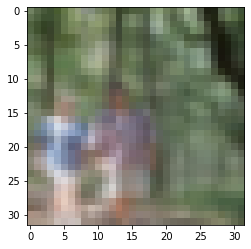

layer::::: 1


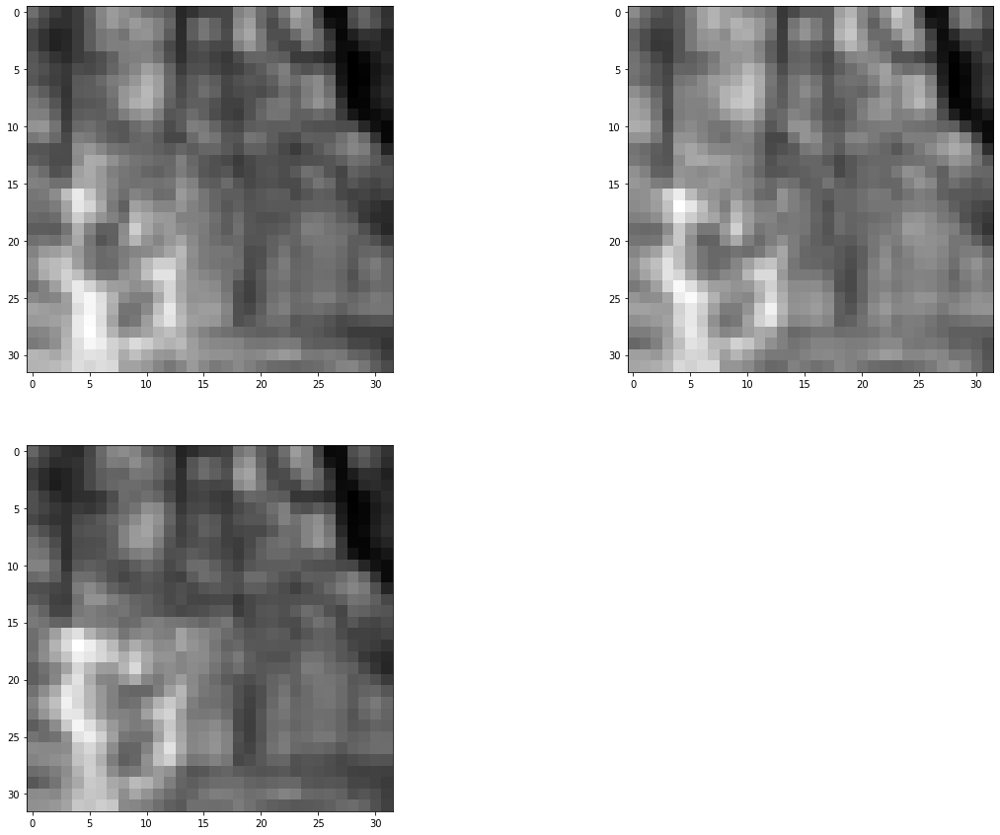

layer::::: 2


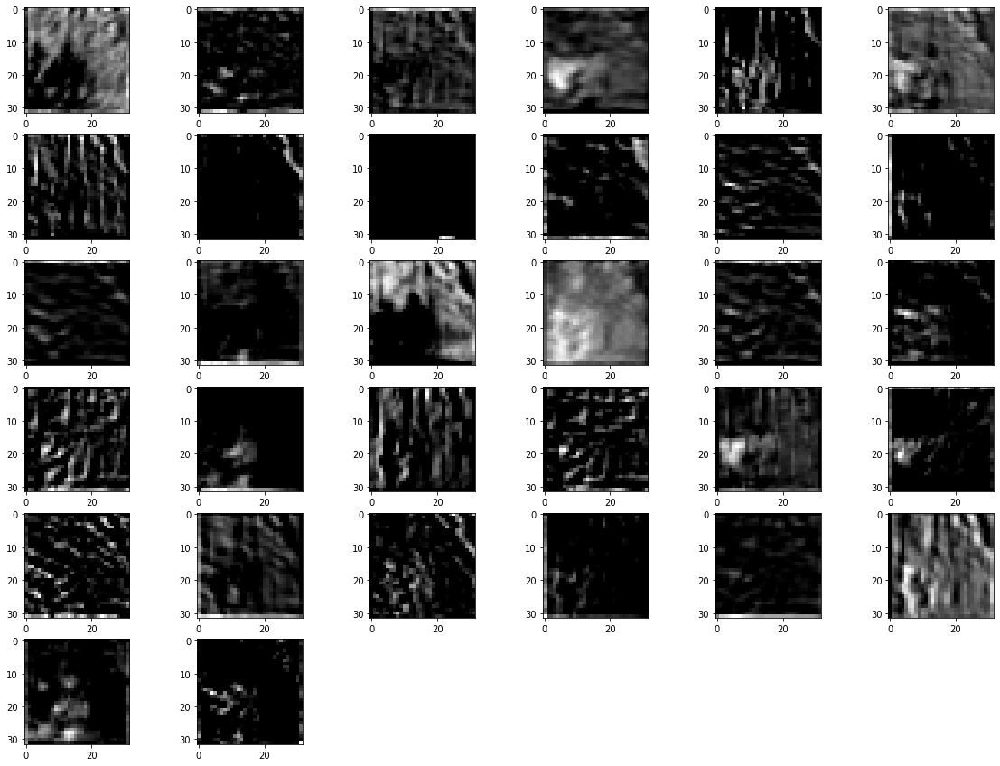

layer::::: 3


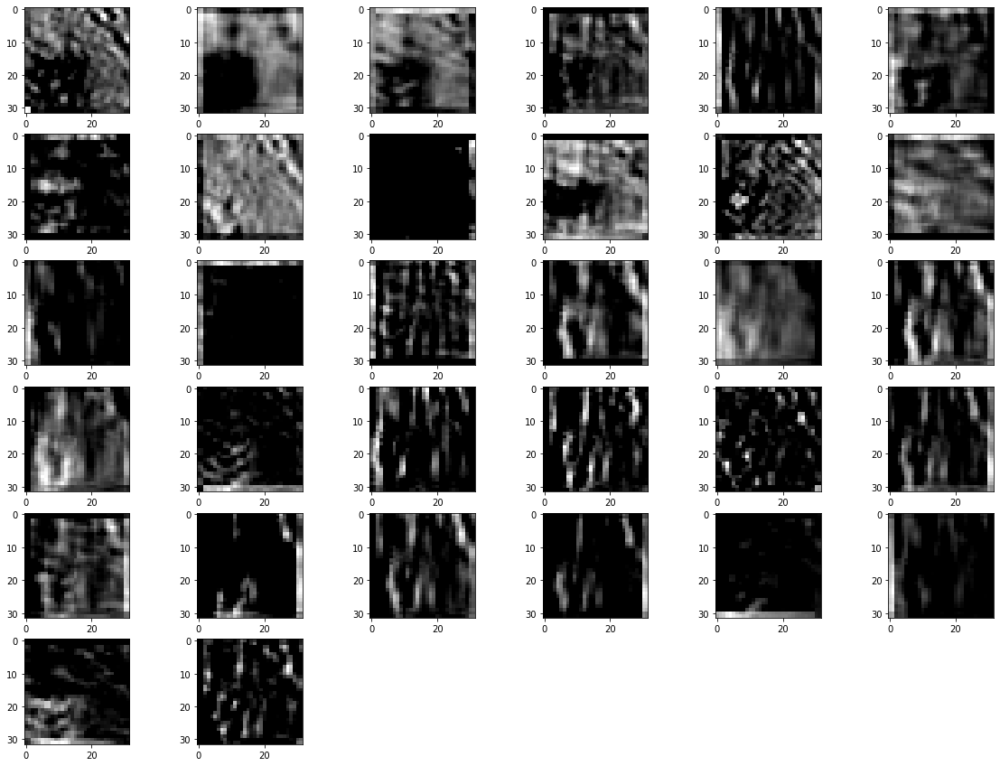

layer::::: 8


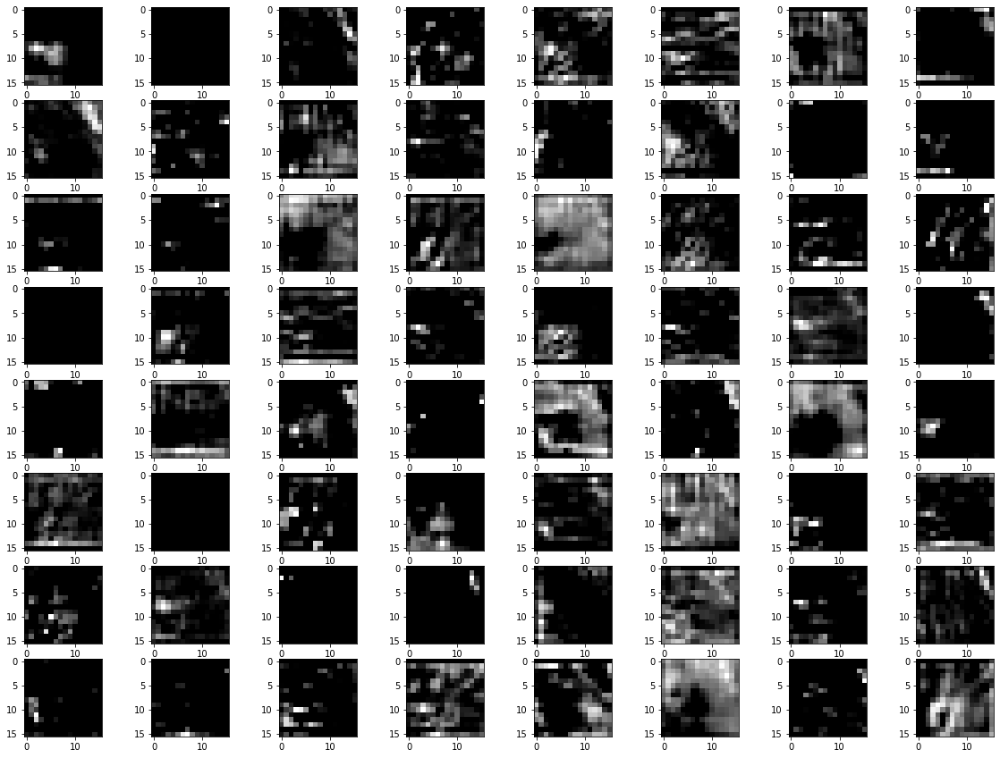

layer::::: 9


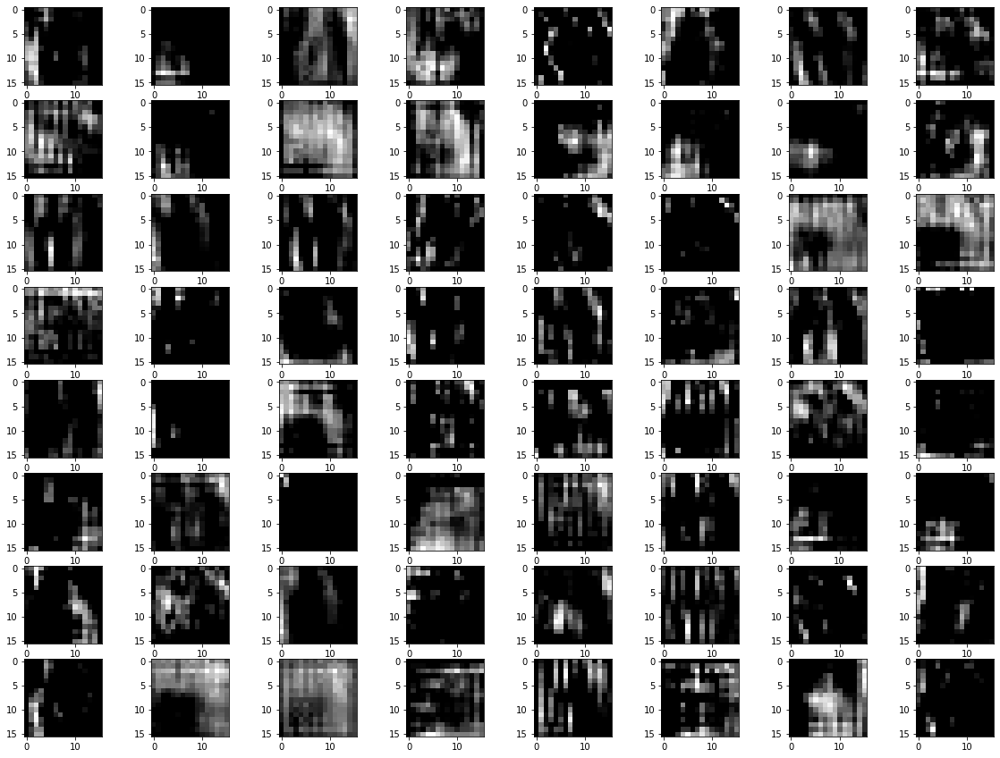

layer::::: 14


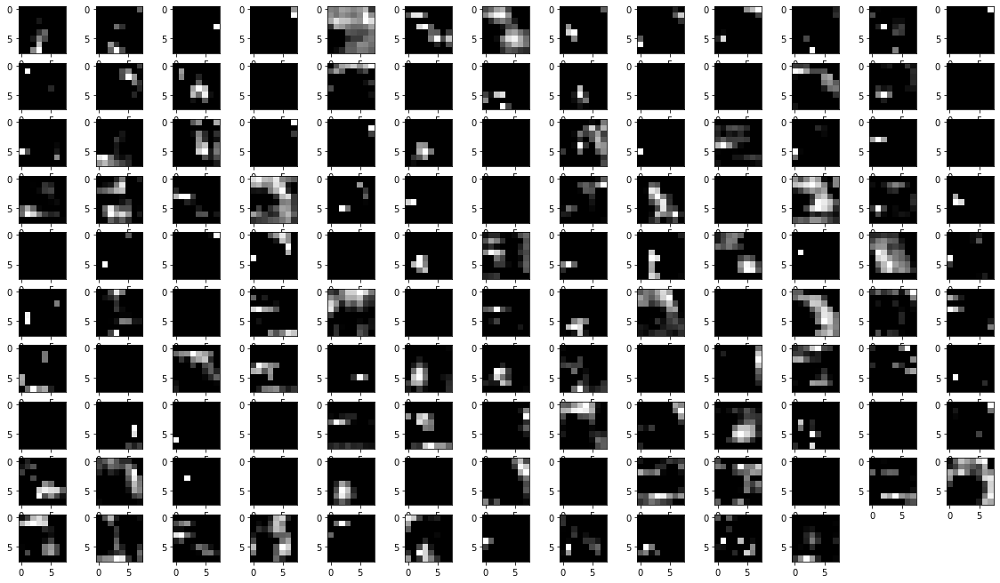

layer::::: 15


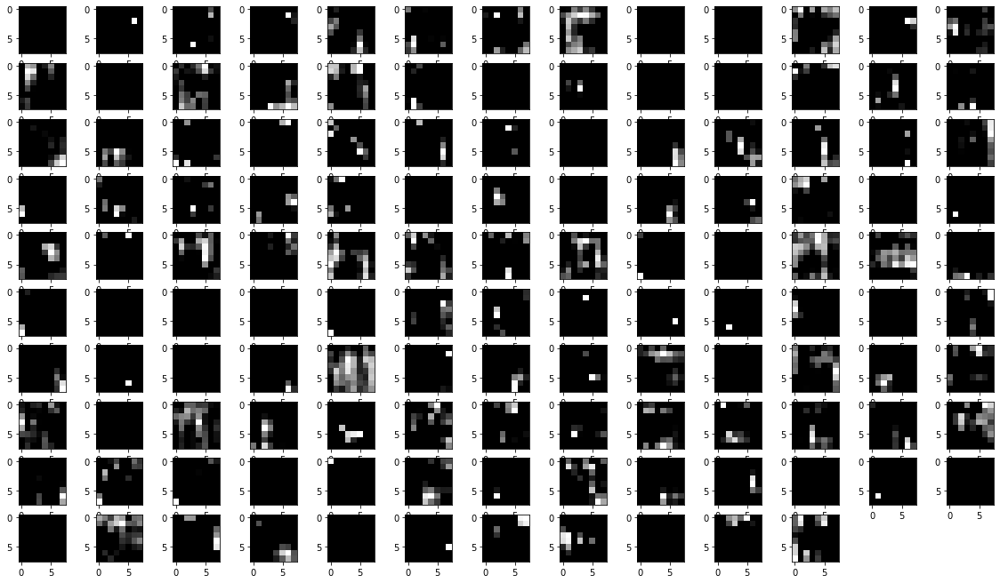

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.1

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.1

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.1
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Optimizer SGD and filter( 32,64,128)

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model_50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_18 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_48 (Conv2D)             (None, 32, 32, 32)   896         ['input_17[0][0]']               
                                                                                                  
 conv2d_51 (Conv2D)             (None, 32, 32, 32)   896         ['input_18[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

170508288/170498071 [==============================] - 6s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 32, 32, 32)   896         ['input_2[0][0]']                
                           

In [ ]:
displaylayer(model)

2 conv2d (None, 32, 32, 32)
3 conv2d_3 (None, 32, 32, 32)
8 conv2d_1 (None, 16, 16, 64)
9 conv2d_4 (None, 16, 16, 64)
14 conv2d_2 (None, 8, 8, 128)
15 conv2d_5 (None, 8, 8, 128)


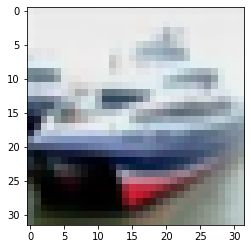

layer::::: 1


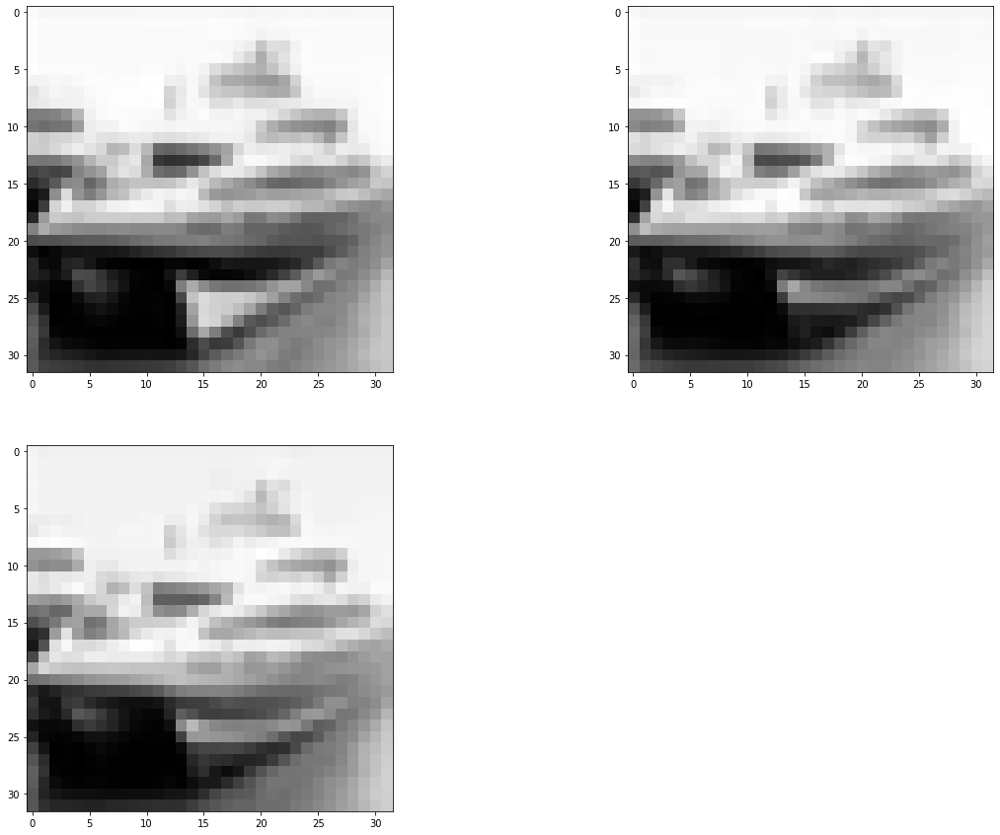

layer::::: 2


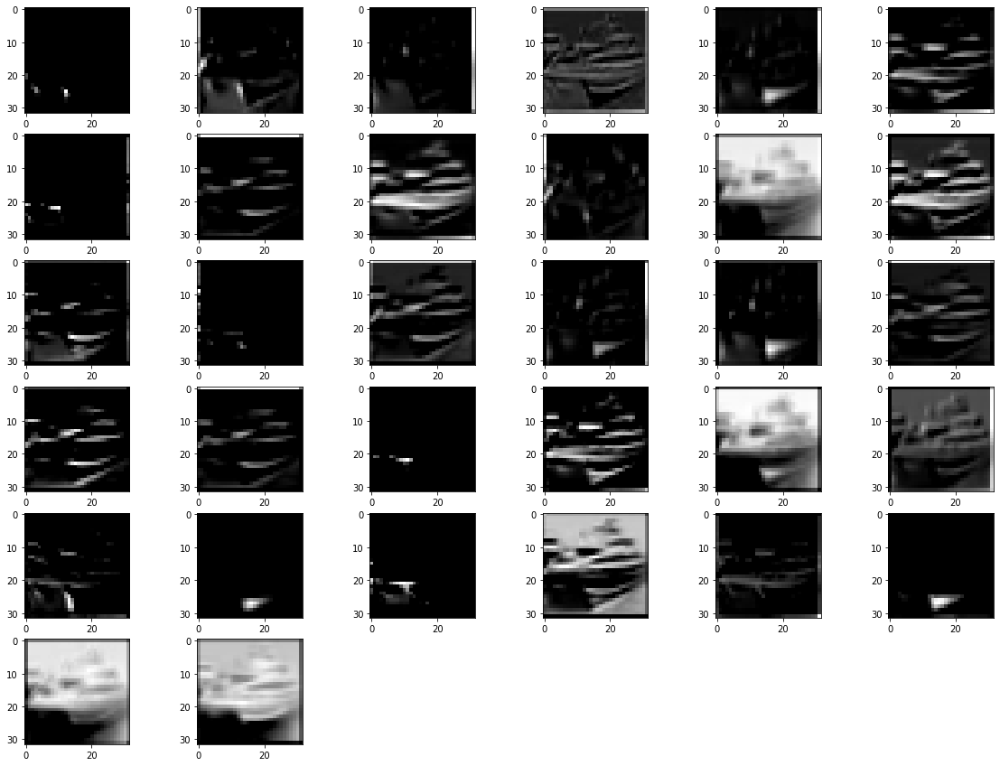

layer::::: 3


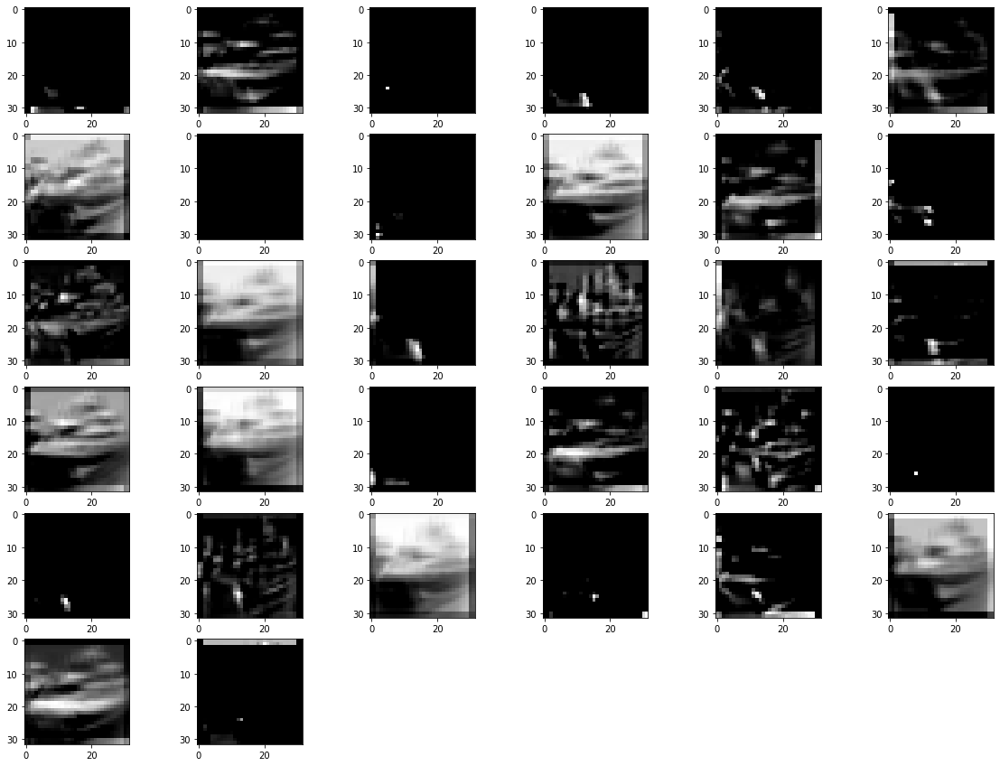

layer::::: 8


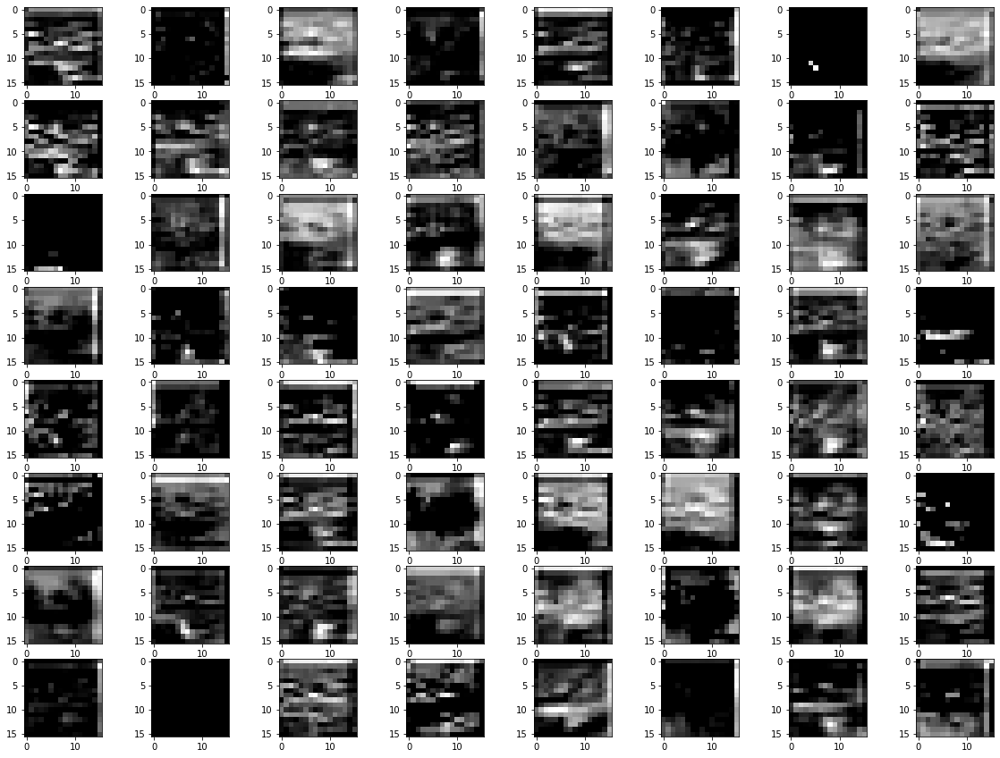

layer::::: 9


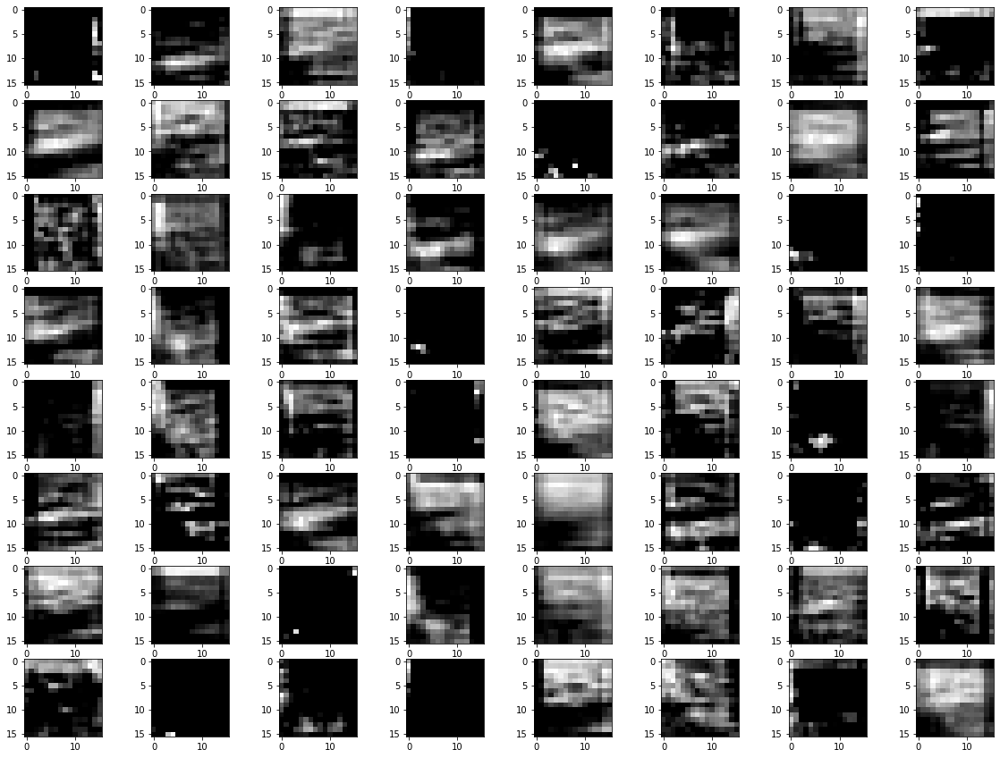

layer::::: 14


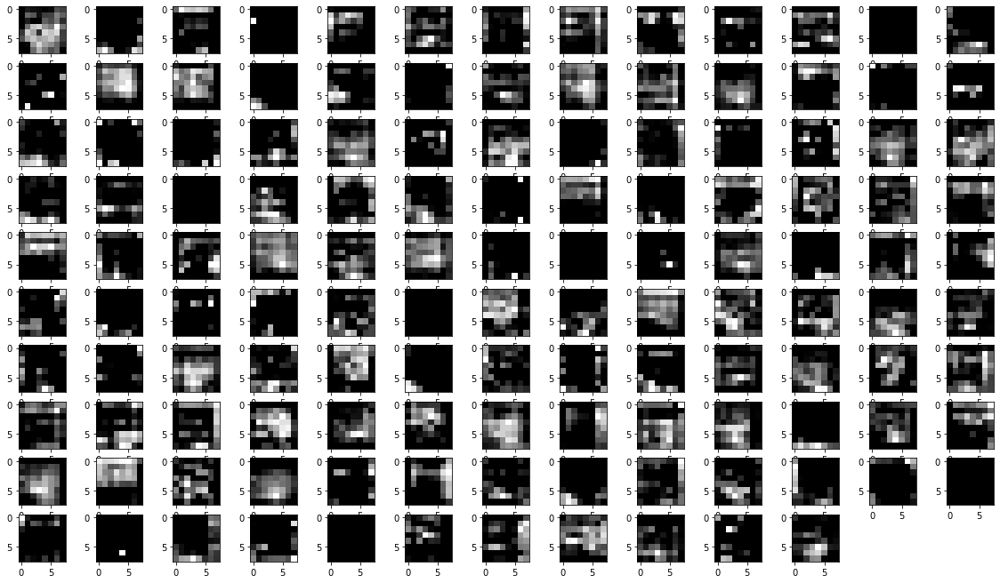

layer::::: 15


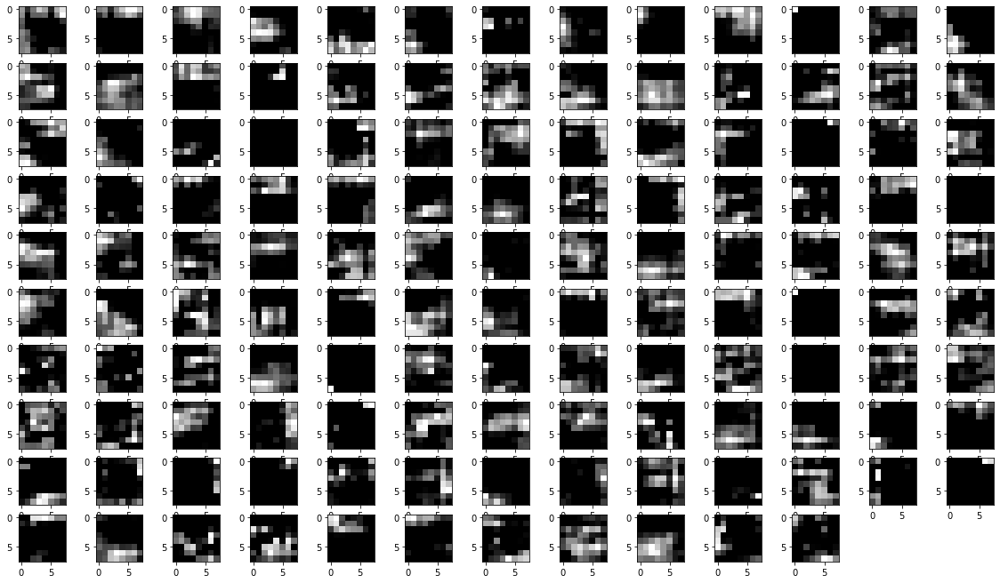

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

169017344/169001437 [==============================] - 6s 0us/step
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 32, 32, 32)   896         ['input_3[0][0]']                
                                                                                                  
 conv2d_9 (Conv2D)              (None, 32, 32, 32)   896         ['input_4[0][0]']                
                         

2 conv2d_6 (None, 32, 32, 32)
3 conv2d_9 (None, 32, 32, 32)
8 conv2d_7 (None, 16, 16, 64)
9 conv2d_10 (None, 16, 16, 64)
14 conv2d_8 (None, 8, 8, 128)
15 conv2d_11 (None, 8, 8, 128)


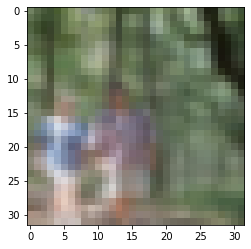

layer::::: 1


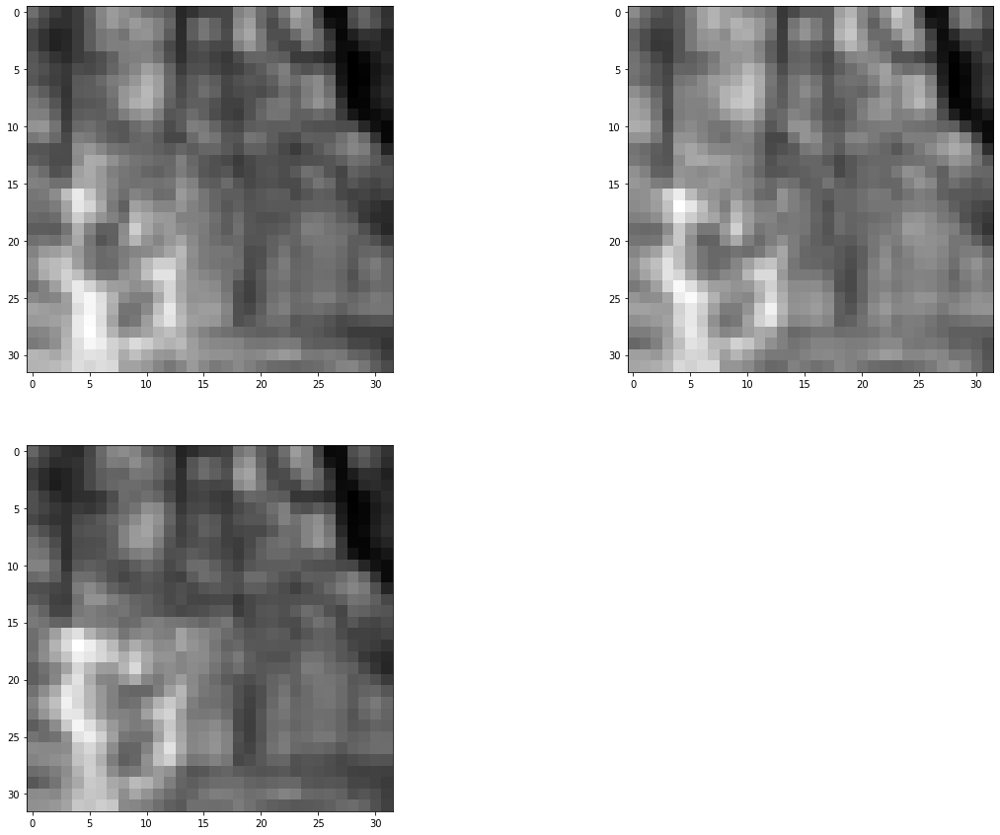

layer::::: 2


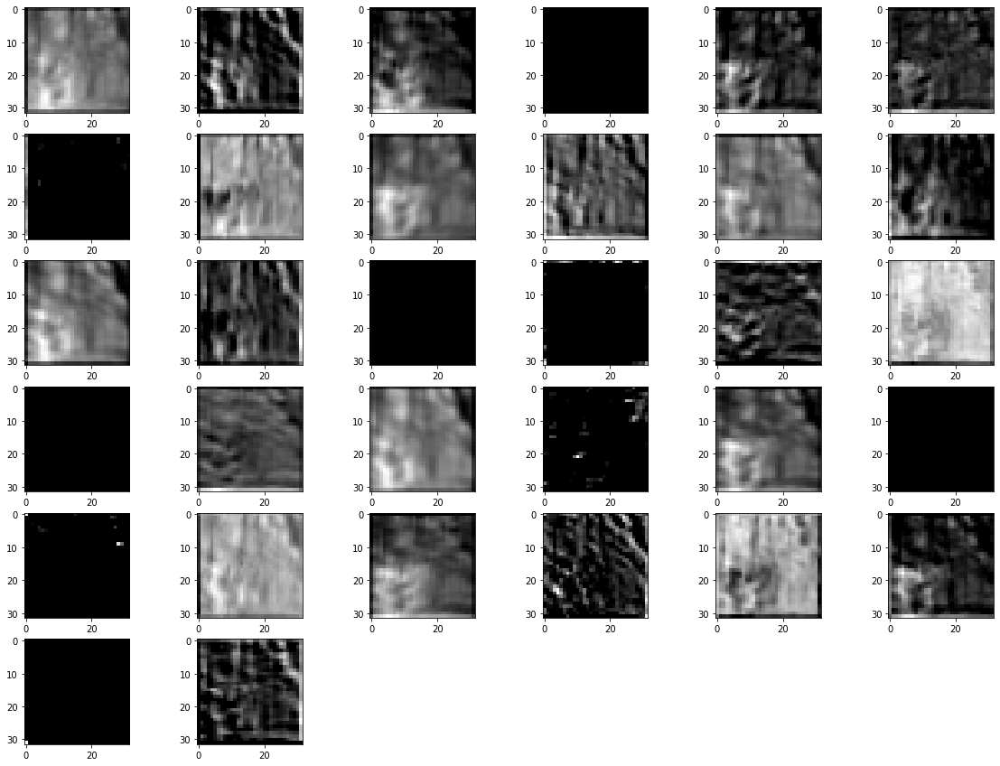

layer::::: 3


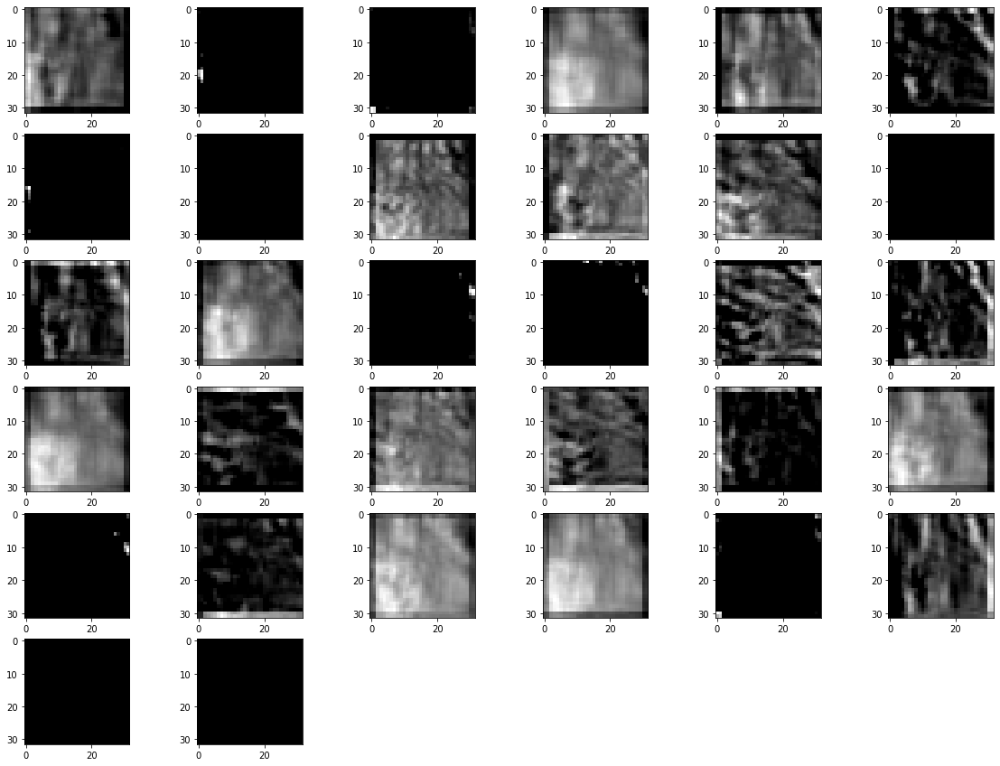

layer::::: 8


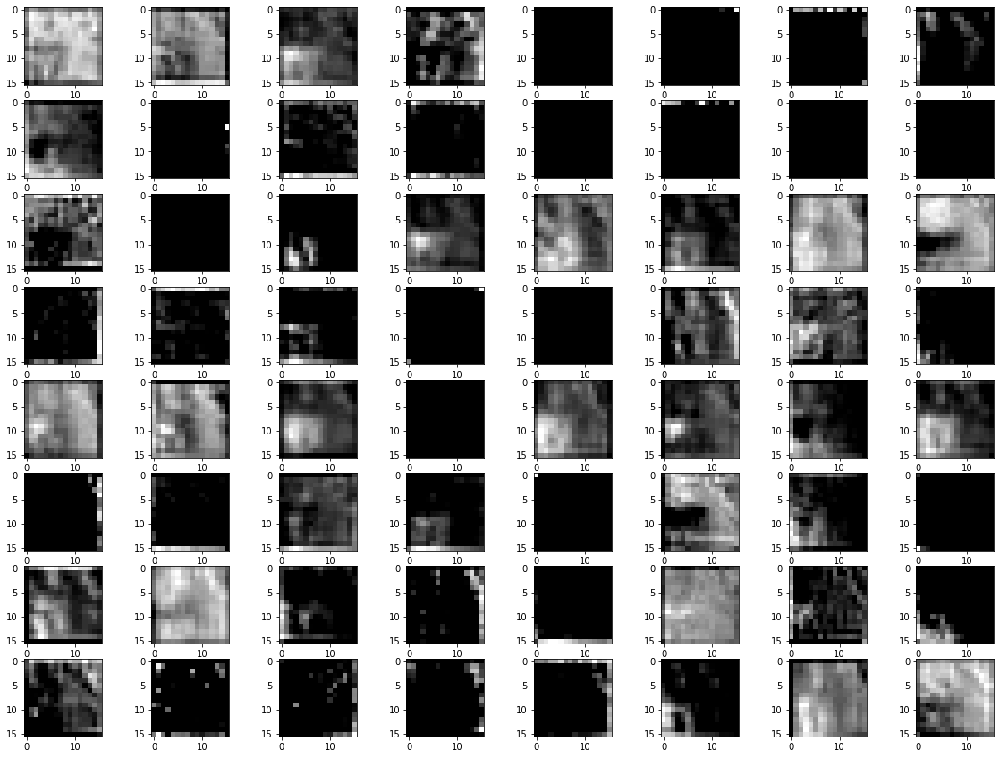

layer::::: 9


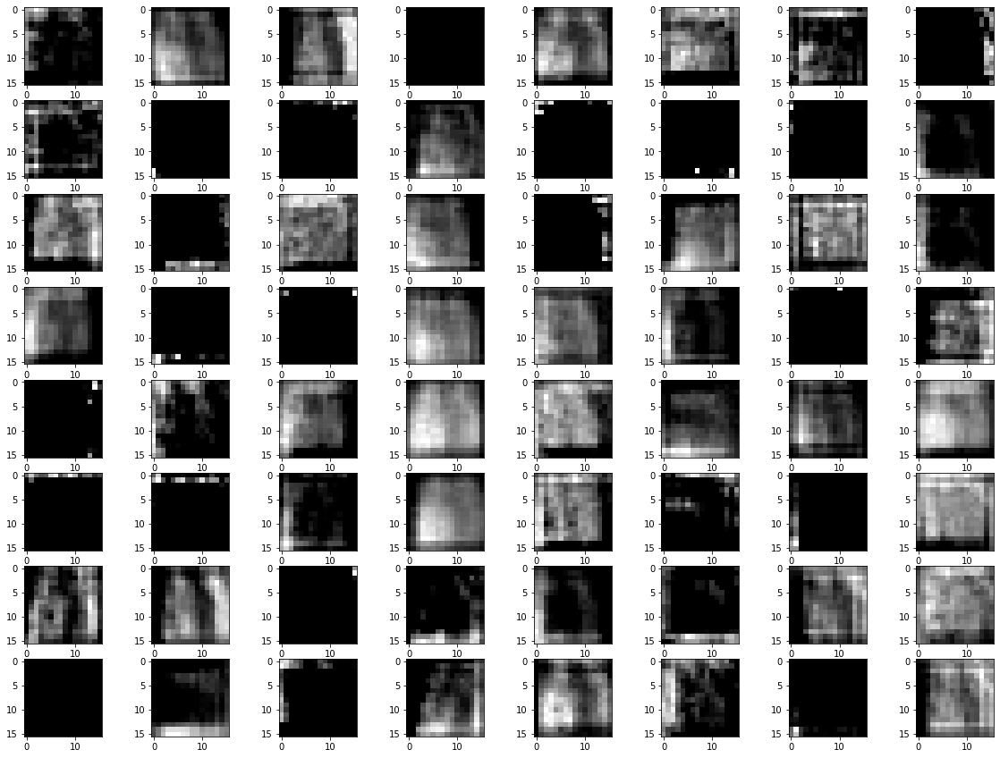

layer::::: 14


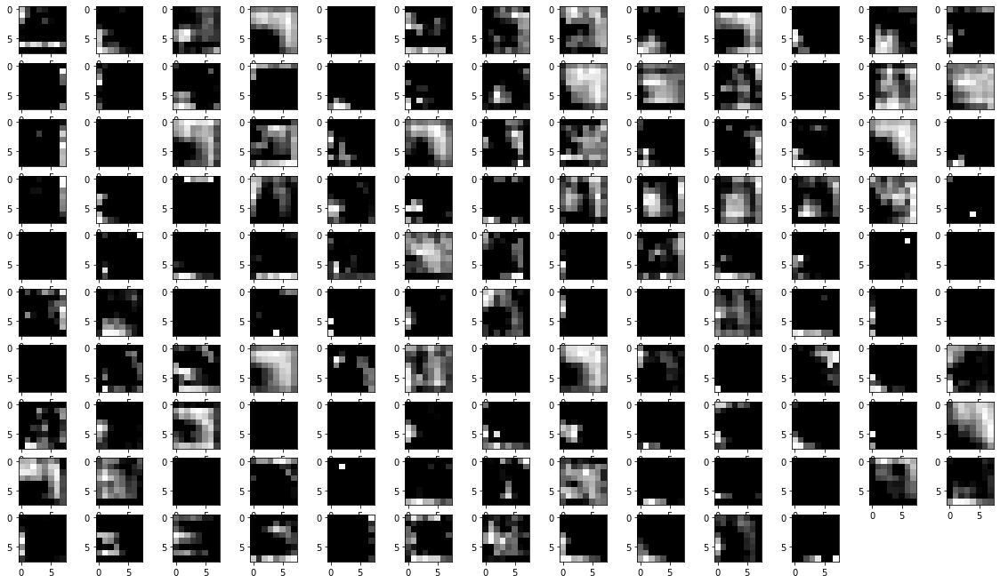

layer::::: 15


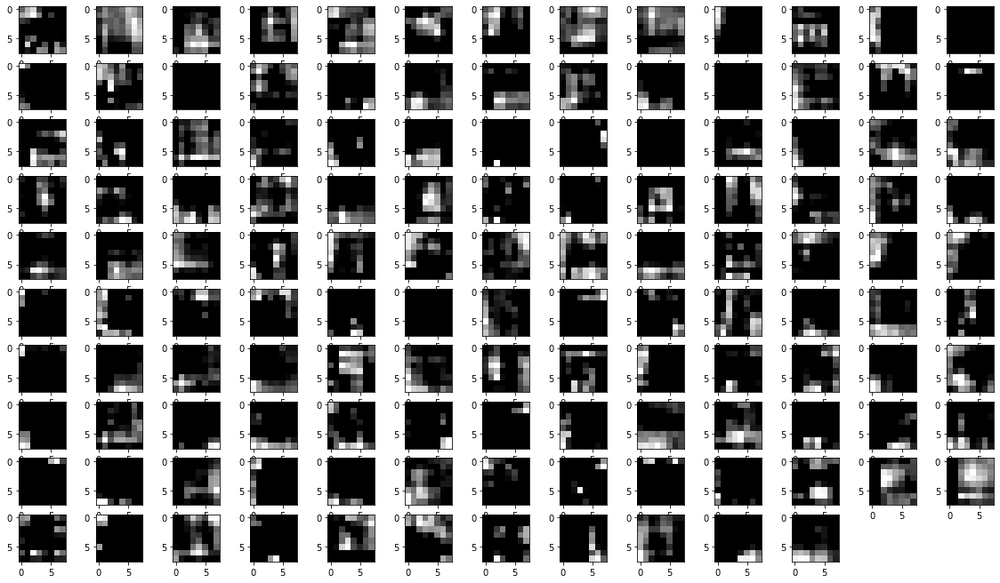

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.2

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.2

model=conc_network(x,y,dropout)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.2
model=conc_network(x,y,dropout)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.1

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.1

model=conc_network(x,y,dropout)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.1
model=conc_network(x,y,dropout)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

# Optimizer Adam filter(64,128,256)


# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 32, 32, 32)   896         ['input_2[0][0]']                
                                                                                              

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# SGG and filter 64,128,256

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 32, 32, 32)   896         ['input_2[0][0]']                
                                                                                              

In [ ]:
displaylayer(model)

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  if i<2:
    featuremap(fig,features,2)
  elif i<4:
    featuremap(fig,features,6)
  elif i<10:
    featuremap(fig,features,8)
  else:
    featuremap(fig,features,13)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# 4 Layers

In [ ]:
import numpy as np
import tensorflow as tf

from tensorflow.keras.layers import Dense, Dropout ,  Flatten,  Conv2D, MaxPooling2D
from tensorflow.keras.layers import Input , concatenate 
from tensorflow.keras.models import Model
from tensorflow.keras.datasets import mnist

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from matplotlib import pyplot
from numpy import expand_dims
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import warnings
warnings.filterwarnings('ignore')

seed=1234
tf.random.set_seed(seed)

In [ ]:
def dataset(data):
  if data==1:
    (x_train, y_train), (x_test, y_test) =tf.keras.datasets.cifar10.load_data() 
    y_train = y_train.flatten()
    y_test = y_test.flatten()
    y_train=tf.one_hot(y_train,10, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    y_test=tf.one_hot(
        y_test,10, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
      
    # normalize image pixel values by dividing 
    # by 255
    gray_scale = 255
    x_train /= gray_scale
    x_test /= gray_scale
  else:
    (x_train, y_train), (x_test, y_test)=tf.keras.datasets.cifar100.load_data(label_mode="fine")
    y_train = y_train.flatten()
    y_test = y_test.flatten()
    y_train=tf.one_hot( y_train,100, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    y_test=tf.one_hot(
        y_test,100, on_value=None, off_value=None, axis=None, dtype=None, name=None)
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
      
    # normalize image pixel values by dividing 
    # by 255
    gray_scale = 255
    x_train /= gray_scale
    x_test /= gray_scale
  return x_train,y_train,x_test, y_test
def right_left_branch(start_filters):
  #parameters
  #input_shape = (image_size, image_size, 1)
  input_shape=(32, 32, 3)
  batch_size = 32
  kernel_size =(3,3)
  dropout = 0.4
  #left branch of Y network
  left_inputs = Input(shape=input_shape )
  x = left_inputs
  filters = start_filters

  """
  Create 4 layers of Conv2D , Dropout,and Maxpooling2D  
  and after every loop double the filters
  """
  for i in range(4):
      x = Conv2D(filters = filters,kernel_size = kernel_size,padding = 'same', activation = 'relu')(x)
      x = Dropout(dropout)(x)
      x = MaxPooling2D()(x)
      filters *= 2
  right_inputs = Input(shape = input_shape)
  y = right_inputs
  filters = start_filters
  """
  Create 3 layers of Conv2D , Dropout,and Maxpooling2D  
  and after every loop double the filters
  """
  for i in range(4):
      y = Conv2D(filters = filters,kernel_size = kernel_size,padding = 'same', 
                activation = 'relu',dilation_rate =2)(y)
      y = Dropout(dropout)(y)
      y = MaxPooling2D()(y)
      filters *= 2
  return x,y,left_inputs,right_inputs
def conc_network(x,y,dropout,size):
  #now lets merge the 2 networsk
  y = concatenate([x,y])

  #now lets start with thr dense layers
  y = Flatten()(y)
  y = Dropout(dropout)(y)
  outputs = Dense(size , activation = 'softmax')(y)


  #now lets build the model
  model = Model(inputs = [left_inputs, right_inputs], outputs = outputs)

  #plot_model(model, to_file='cnn-Y-network.png', show_shapes=True)
  # verify the model using layer text description
  model.summary()
  return model
def train(model,optim,epoch):
  model.compile(loss='categorical_crossentropy',
                optimizer=optim,
                metrics=['accuracy'])


  model.fit([x_train,x_train],
              y_train,
              validation_data=([x_test,x_test], y_test),
              epochs=epoch,
              batch_size=500)

  score = model.evaluate([x_test,x_test],
                            y_test,
                            batch_size=500,
                            verbose=2)

  print("\nTest accuracy: %.1f%%" % (100.0 * score[1]))
  return model


In [ ]:
def displaylayer(model):
  for i in range(len(model.layers)):
      layer = model.layers[i]
      if 'conv' not in layer.name:
          continue    
      print(i , layer.name , layer.output.shape)
def featuremap(fig,features,grid):
  for i in range(1,features.shape[3]+1):
      
      pyplot.subplot(grid,grid,i)
      
      pyplot.imshow(features[0,:,:,i-1] , cmap='gray')
      
  pyplot.show()

# Optimizer Adam & filter 32,64,128, 256


# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

170508288/170498071 [==============================] - 4s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 32, 32, 32)   896         ['input_2[0][0]']                
                           

In [ ]:
displaylayer(model)

2 conv2d (None, 32, 32, 32)
3 conv2d_4 (None, 32, 32, 32)
8 conv2d_1 (None, 16, 16, 64)
9 conv2d_5 (None, 16, 16, 64)
14 conv2d_2 (None, 8, 8, 128)
15 conv2d_6 (None, 8, 8, 128)
20 conv2d_3 (None, 4, 4, 256)
21 conv2d_7 (None, 4, 4, 256)


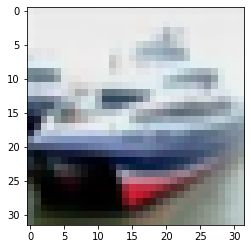

layer::::: 1


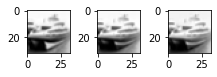

layer::::: 2


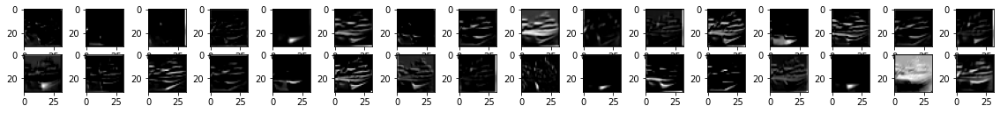

layer::::: 3


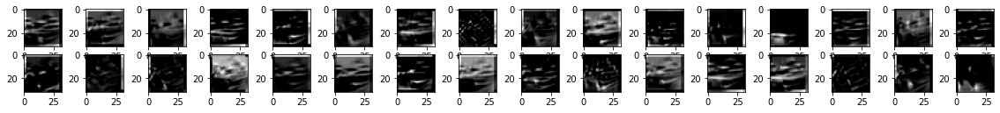

layer::::: 8


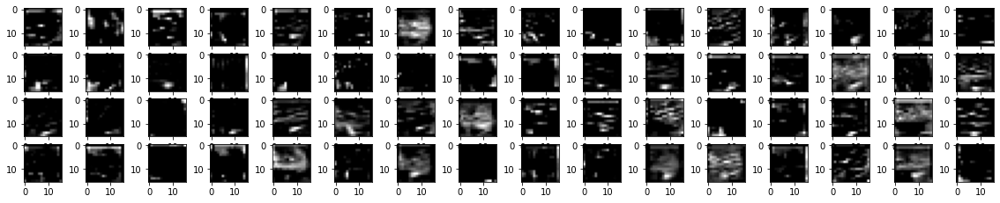

layer::::: 9


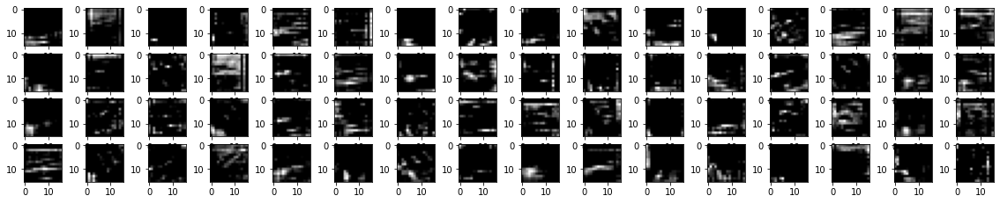

layer::::: 14


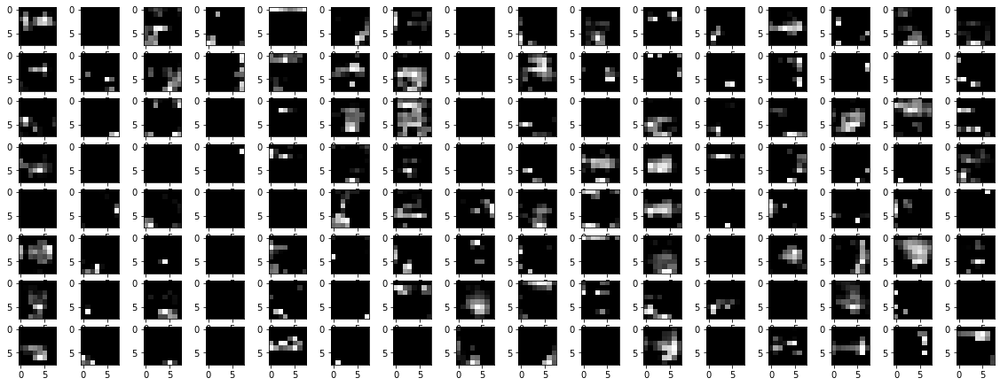

layer::::: 15


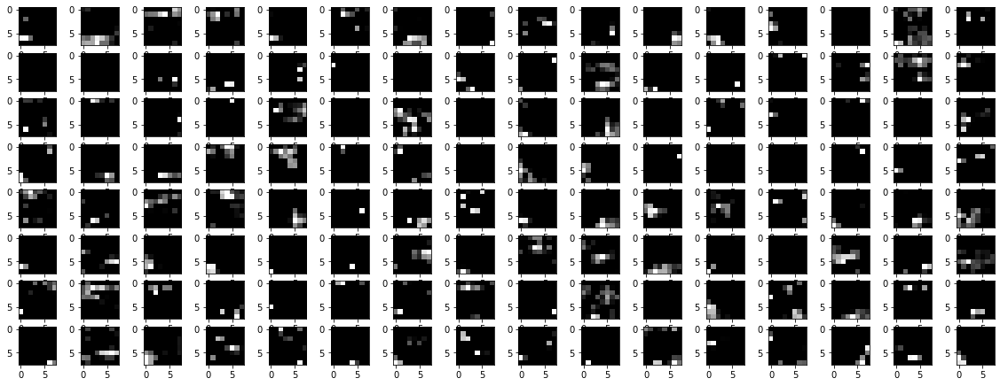

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

169017344/169001437 [==============================] - 4s 0us/step
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_8 (Conv2D)              (None, 32, 32, 32)   896         ['input_3[0][0]']                
                                                                                                  
 conv2d_12 (Conv2D)             (None, 32, 32, 32)   896         ['input_4[0][0]']                
                         

2 conv2d_8 (None, 32, 32, 32)
3 conv2d_12 (None, 32, 32, 32)
8 conv2d_9 (None, 16, 16, 64)
9 conv2d_13 (None, 16, 16, 64)
14 conv2d_10 (None, 8, 8, 128)
15 conv2d_14 (None, 8, 8, 128)
20 conv2d_11 (None, 4, 4, 256)
21 conv2d_15 (None, 4, 4, 256)


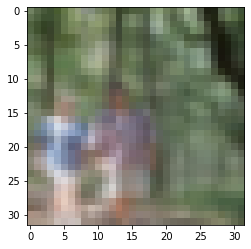

layer::::: 1


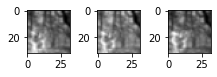

layer::::: 2


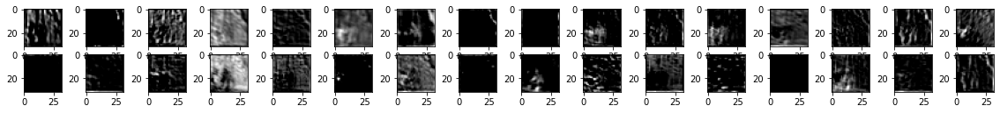

layer::::: 3


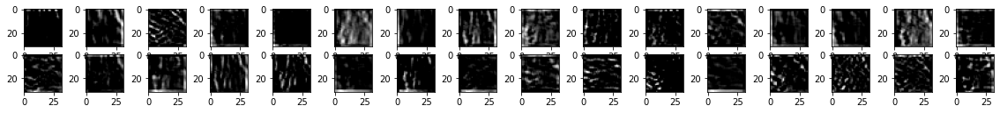

layer::::: 8


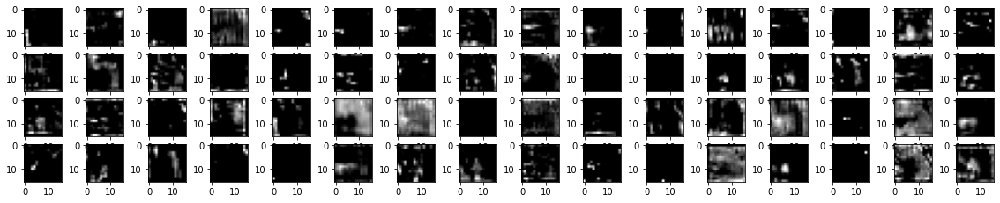

layer::::: 9


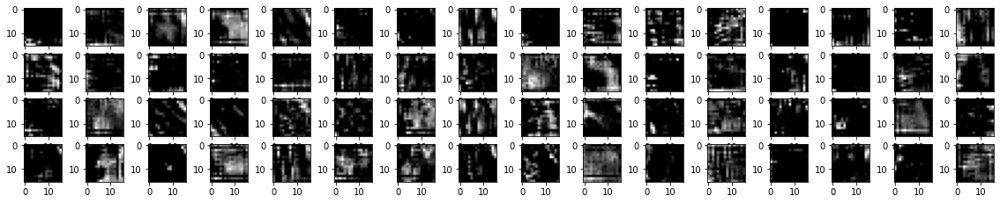

layer::::: 14


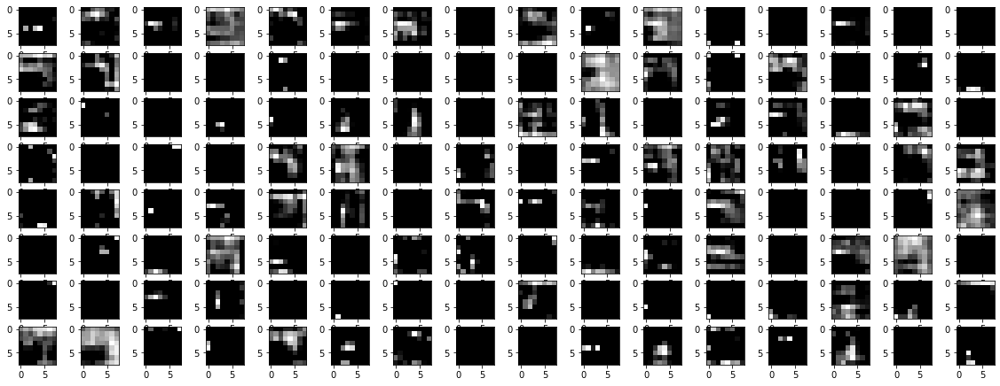

layer::::: 15


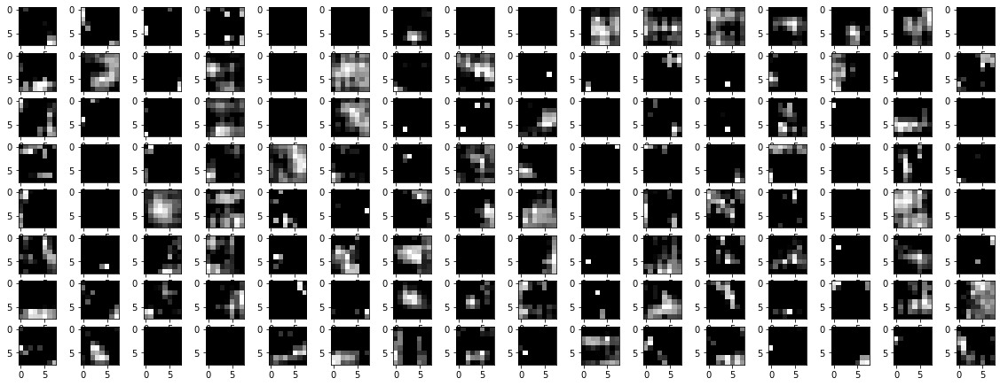

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

170508288/170498071 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 32, 32, 32)   896         ['input_2[0][0]']                
                           

In [ ]:
displaylayer(model)

2 conv2d (None, 32, 32, 32)
3 conv2d_4 (None, 32, 32, 32)
8 conv2d_1 (None, 16, 16, 64)
9 conv2d_5 (None, 16, 16, 64)
14 conv2d_2 (None, 8, 8, 128)
15 conv2d_6 (None, 8, 8, 128)
20 conv2d_3 (None, 4, 4, 256)
21 conv2d_7 (None, 4, 4, 256)


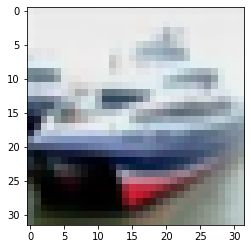

layer::::: 1


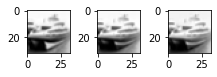

layer::::: 2


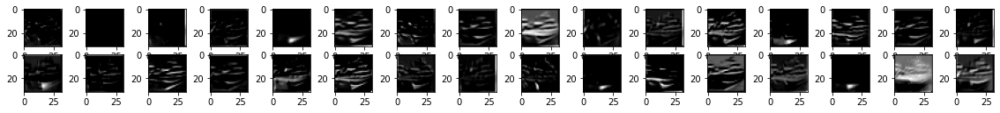

layer::::: 3


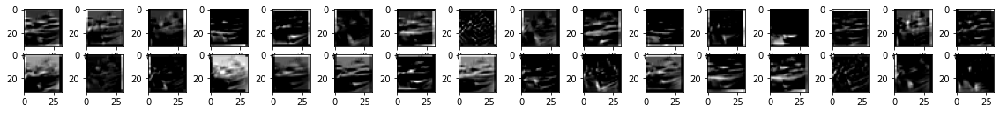

layer::::: 8


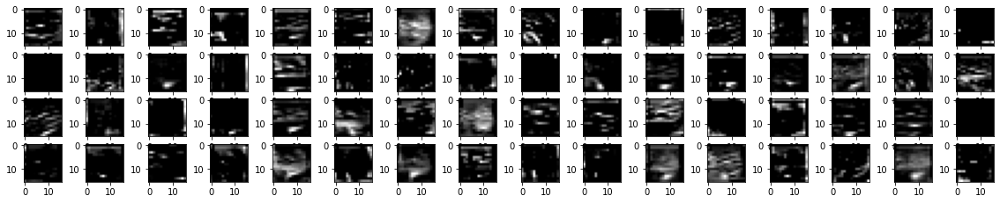

layer::::: 9


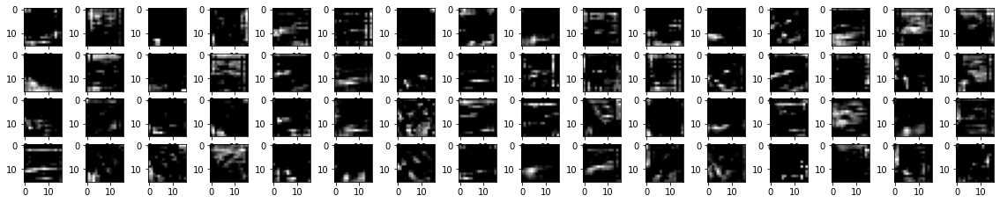

layer::::: 14


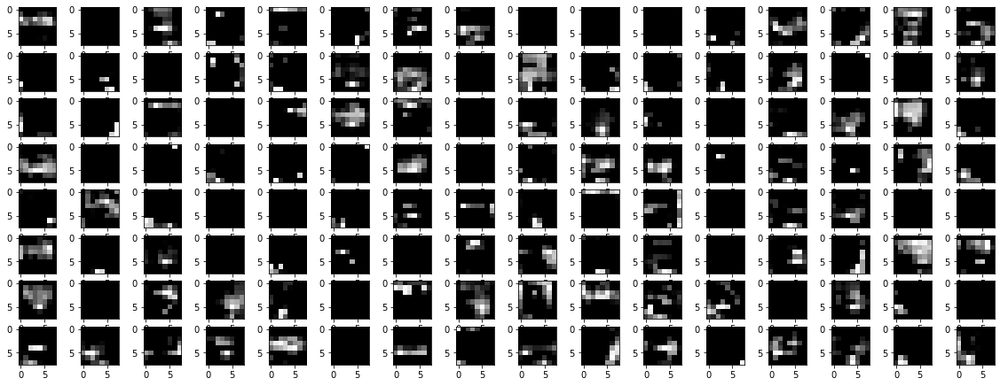

layer::::: 15


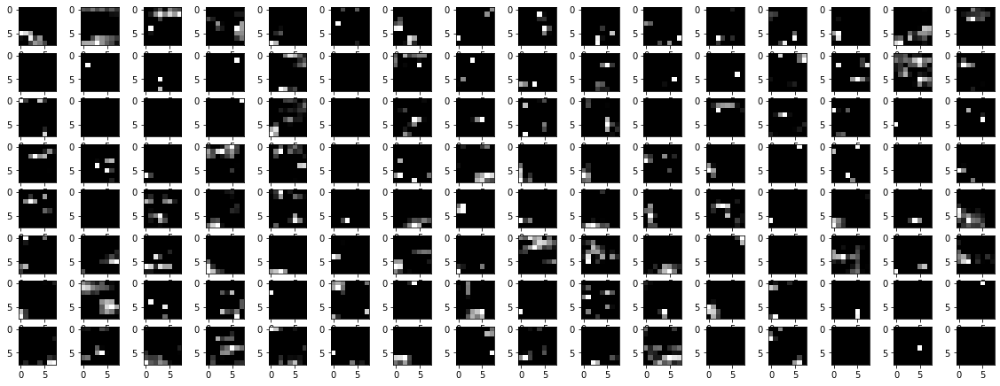

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

169017344/169001437 [==============================] - 3s 0us/step
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_8 (Conv2D)              (None, 32, 32, 32)   896         ['input_3[0][0]']                
                                                                                                  
 conv2d_12 (Conv2D)             (None, 32, 32, 32)   896         ['input_4[0][0]']                
                         

2 conv2d_8 (None, 32, 32, 32)
3 conv2d_12 (None, 32, 32, 32)
8 conv2d_9 (None, 16, 16, 64)
9 conv2d_13 (None, 16, 16, 64)
14 conv2d_10 (None, 8, 8, 128)
15 conv2d_14 (None, 8, 8, 128)
20 conv2d_11 (None, 4, 4, 256)
21 conv2d_15 (None, 4, 4, 256)


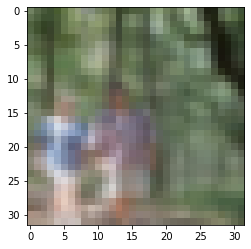

layer::::: 1


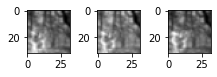

layer::::: 2


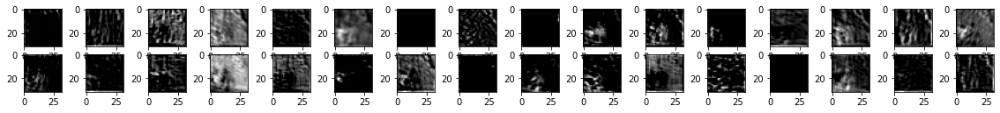

layer::::: 3


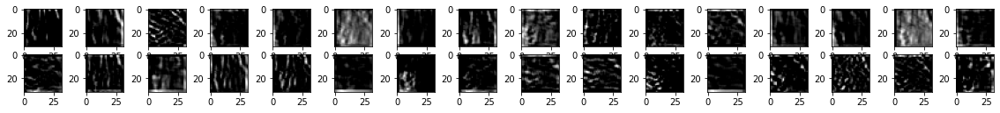

layer::::: 8


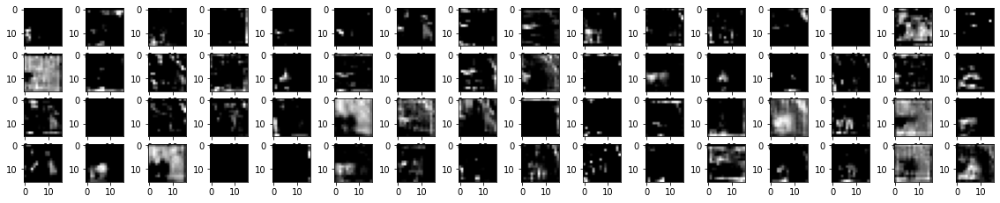

layer::::: 9


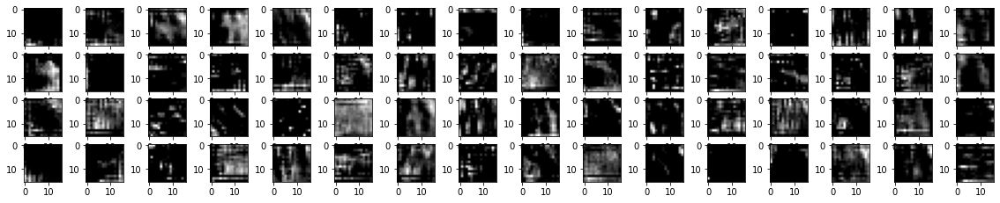

layer::::: 14


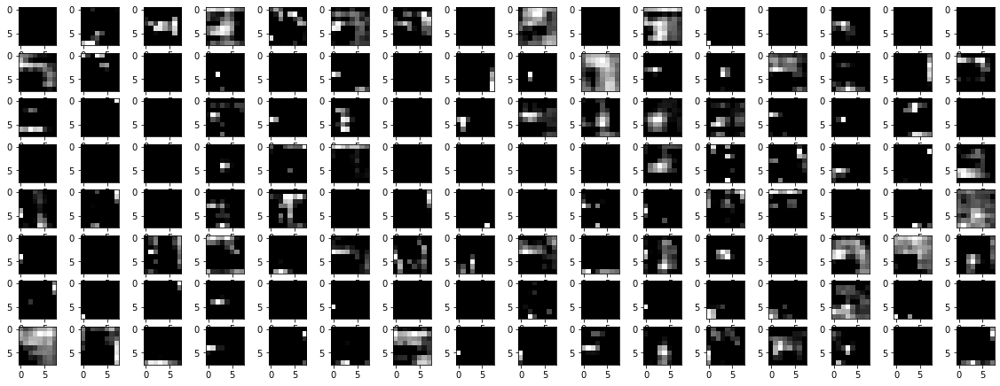

layer::::: 15


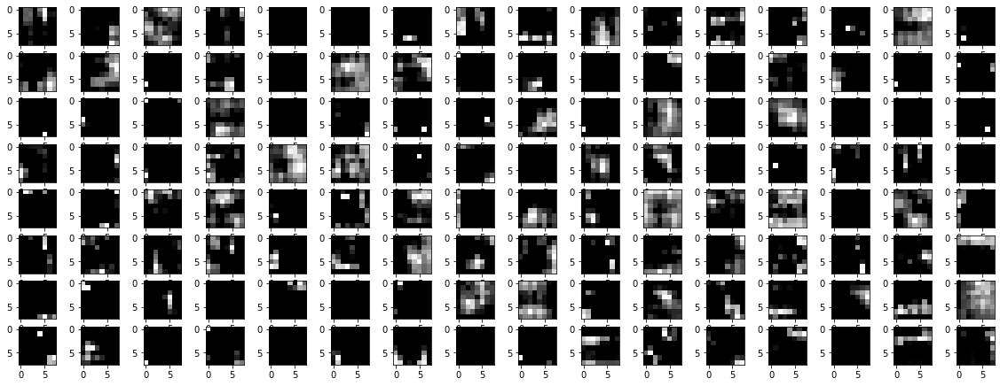

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Optimizer SGD and filter 32,64,128,256

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_6 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_16 (Conv2D)             (None, 32, 32, 32)   896         ['input_5[0][0]']                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 32, 32, 32)   896         ['input_6[0][0]']                
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_16 (None, 32, 32, 32)
3 conv2d_20 (None, 32, 32, 32)
8 conv2d_17 (None, 16, 16, 64)
9 conv2d_21 (None, 16, 16, 64)
14 conv2d_18 (None, 8, 8, 128)
15 conv2d_22 (None, 8, 8, 128)
20 conv2d_19 (None, 4, 4, 256)
21 conv2d_23 (None, 4, 4, 256)


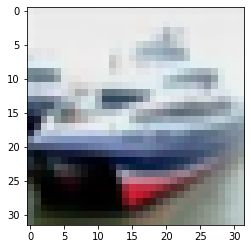

layer::::: 1


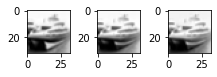

layer::::: 2


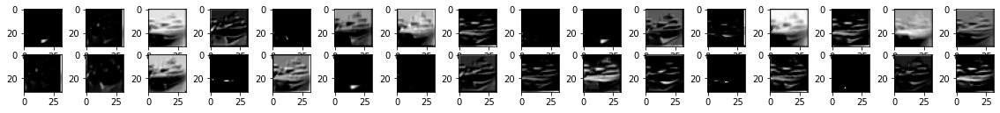

layer::::: 3


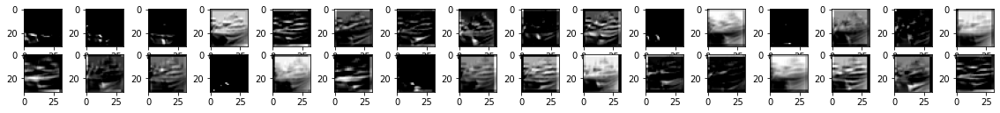

layer::::: 8


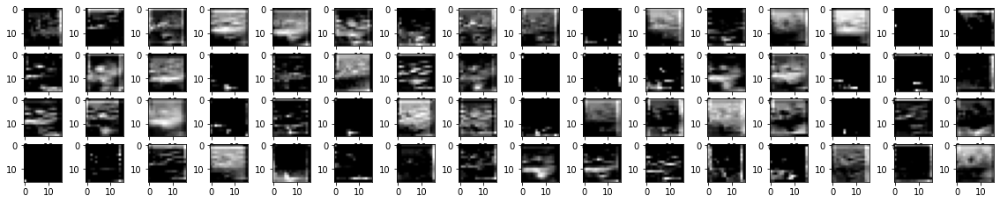

layer::::: 9


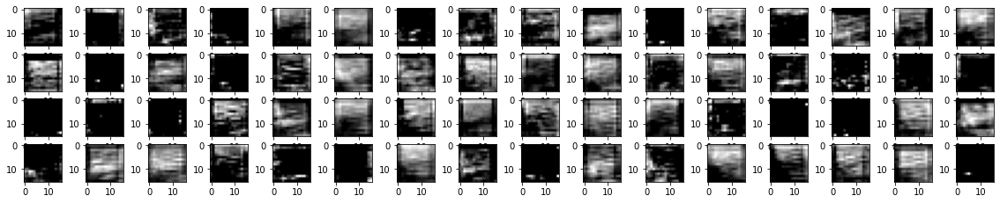

layer::::: 14


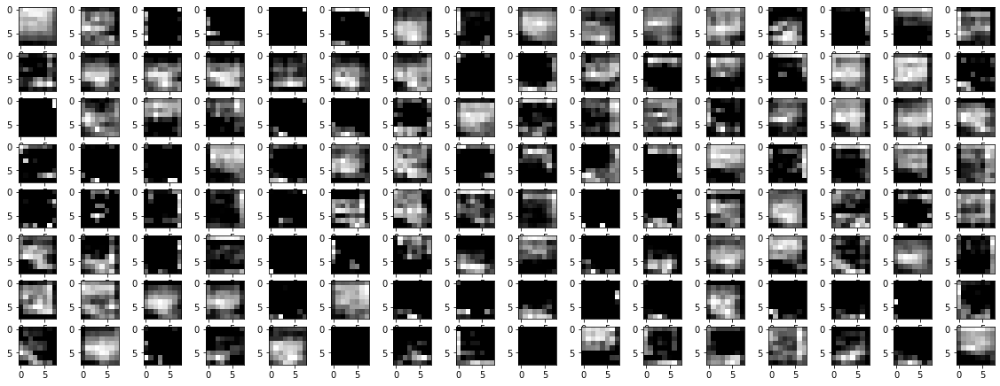

layer::::: 15


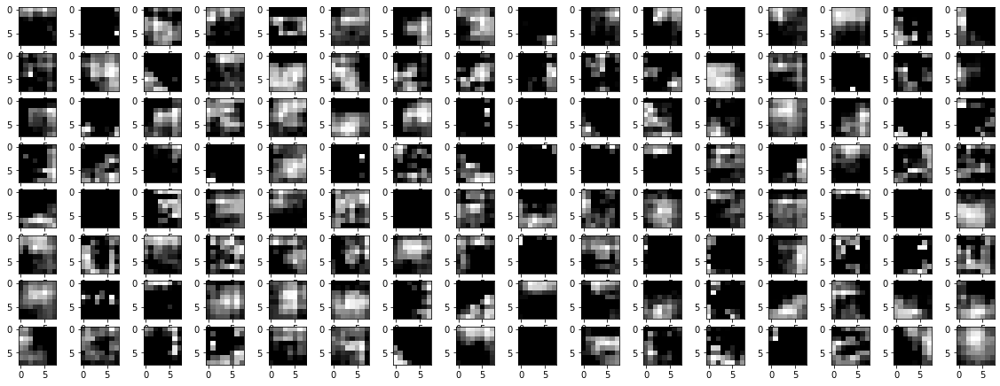

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

Model: "model_24"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_24 (Conv2D)             (None, 32, 32, 32)   896         ['input_7[0][0]']                
                                                                                                  
 conv2d_28 (Conv2D)             (None, 32, 32, 32)   896         ['input_8[0][0]']                
                                                                                           

2 conv2d_24 (None, 32, 32, 32)
3 conv2d_28 (None, 32, 32, 32)
8 conv2d_25 (None, 16, 16, 64)
9 conv2d_29 (None, 16, 16, 64)
14 conv2d_26 (None, 8, 8, 128)
15 conv2d_30 (None, 8, 8, 128)
20 conv2d_27 (None, 4, 4, 256)
21 conv2d_31 (None, 4, 4, 256)


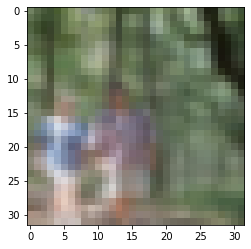

layer::::: 1


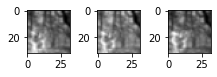

layer::::: 2


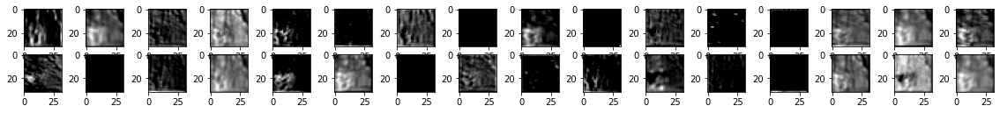

layer::::: 3


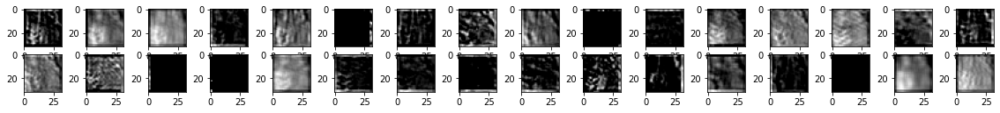

layer::::: 8


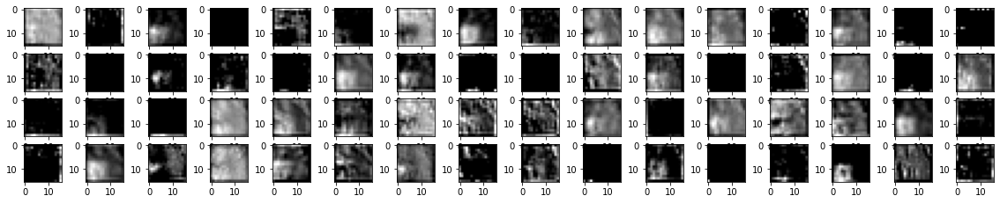

layer::::: 9


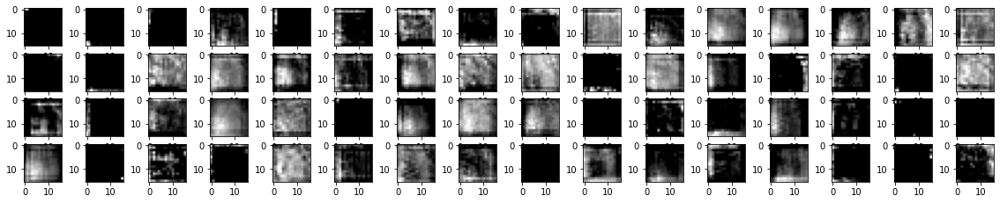

layer::::: 14


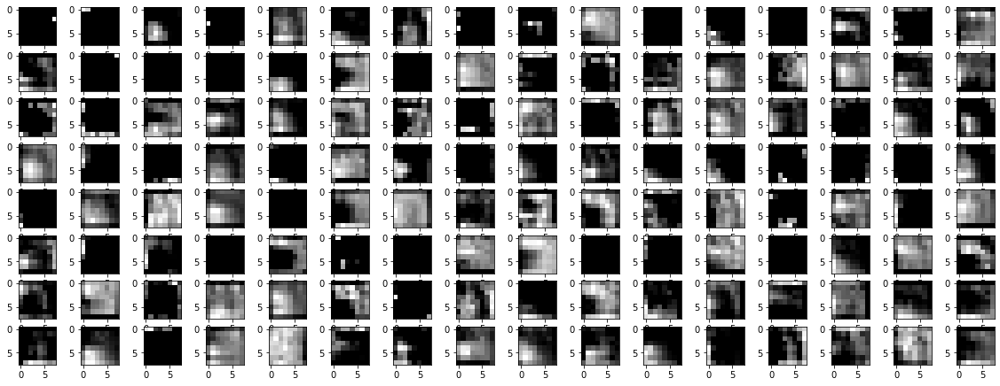

layer::::: 15


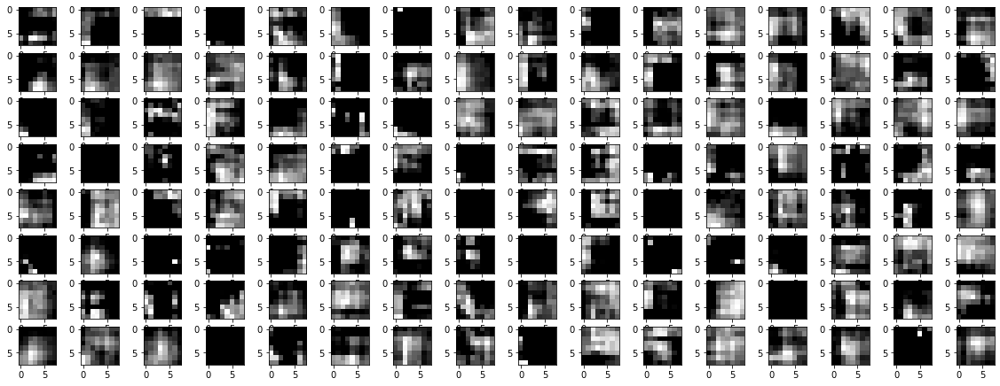

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model_32"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_10 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_32 (Conv2D)             (None, 32, 32, 32)   896         ['input_9[0][0]']                
                                                                                                  
 conv2d_36 (Conv2D)             (None, 32, 32, 32)   896         ['input_10[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_32 (None, 32, 32, 32)
3 conv2d_36 (None, 32, 32, 32)
8 conv2d_33 (None, 16, 16, 64)
9 conv2d_37 (None, 16, 16, 64)
14 conv2d_34 (None, 8, 8, 128)
15 conv2d_38 (None, 8, 8, 128)
20 conv2d_35 (None, 4, 4, 256)
21 conv2d_39 (None, 4, 4, 256)


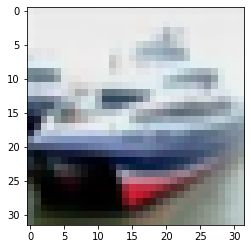

layer::::: 1


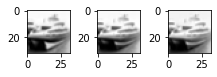

layer::::: 2


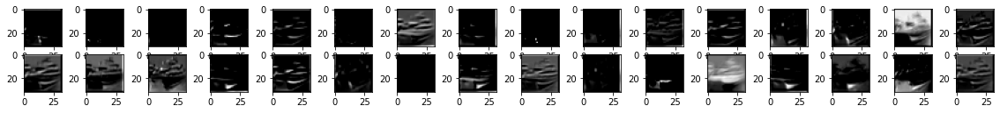

layer::::: 3


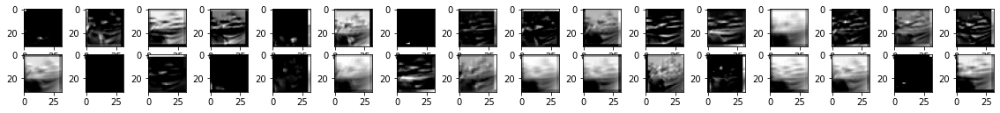

layer::::: 8


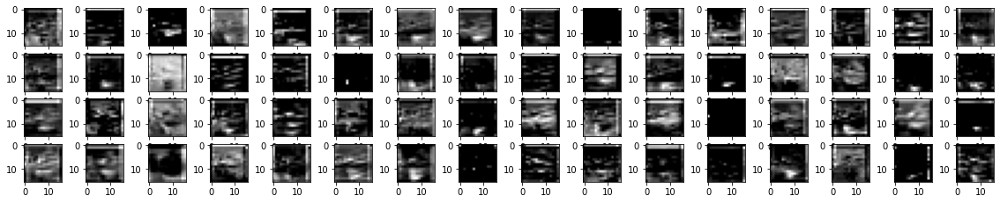

layer::::: 9


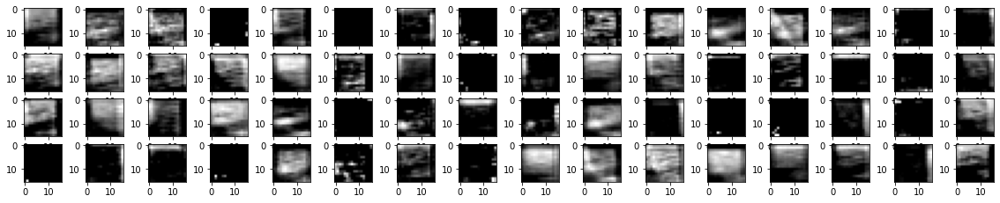

layer::::: 14


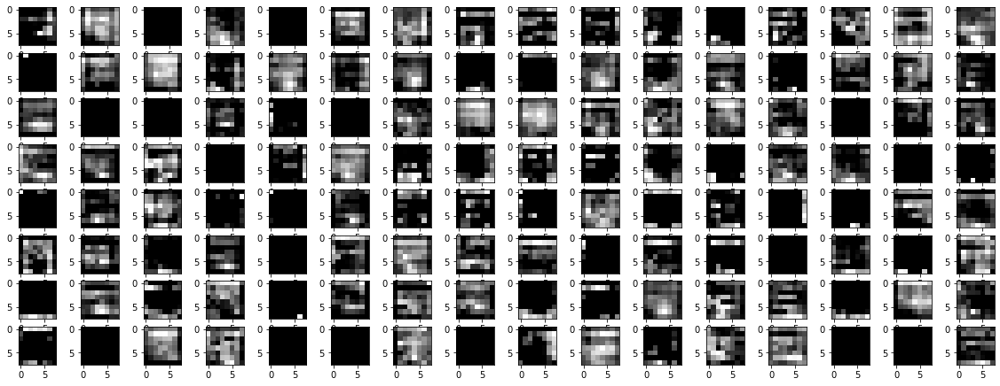

layer::::: 15


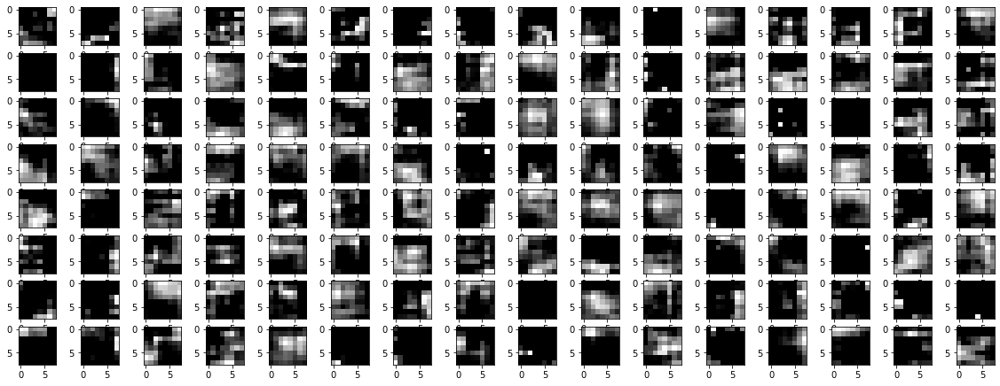

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=32
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

Model: "model_40"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_12 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_40 (Conv2D)             (None, 32, 32, 32)   896         ['input_11[0][0]']               
                                                                                                  
 conv2d_44 (Conv2D)             (None, 32, 32, 32)   896         ['input_12[0][0]']               
                                                                                           

2 conv2d_40 (None, 32, 32, 32)
3 conv2d_44 (None, 32, 32, 32)
8 conv2d_41 (None, 16, 16, 64)
9 conv2d_45 (None, 16, 16, 64)
14 conv2d_42 (None, 8, 8, 128)
15 conv2d_46 (None, 8, 8, 128)
20 conv2d_43 (None, 4, 4, 256)
21 conv2d_47 (None, 4, 4, 256)


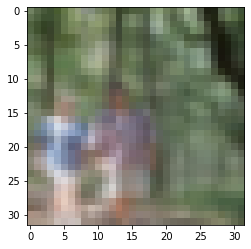

layer::::: 1


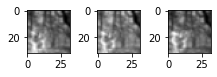

layer::::: 2


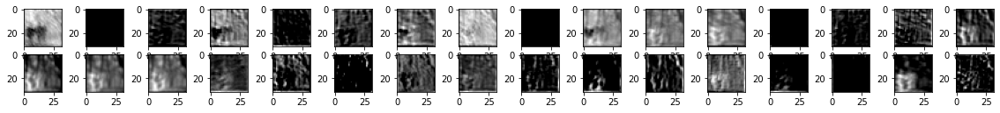

layer::::: 3


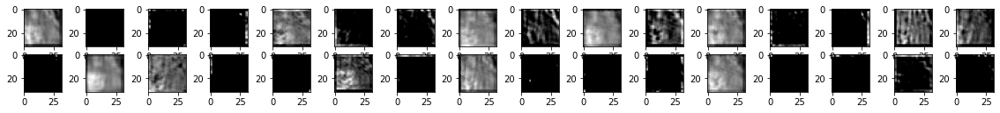

layer::::: 8


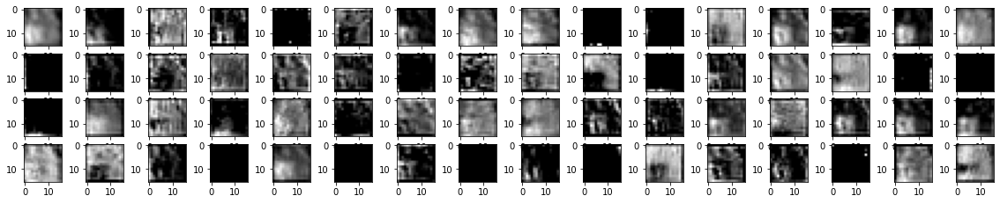

layer::::: 9


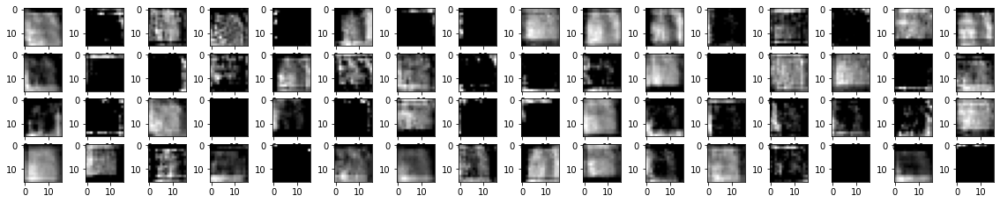

layer::::: 14


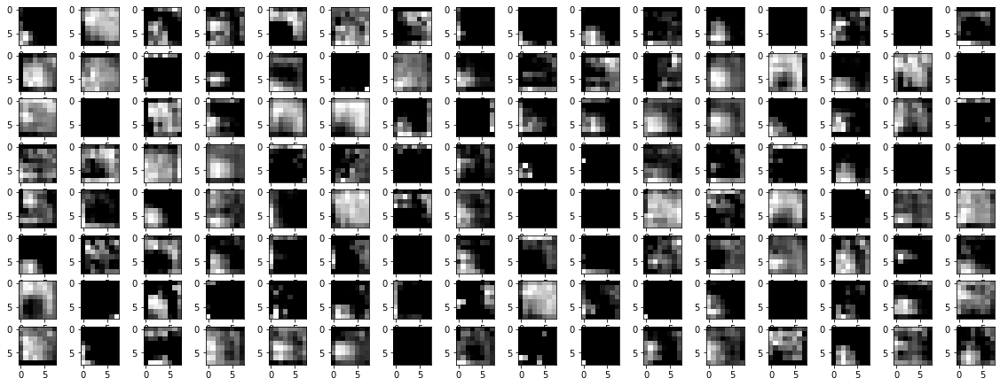

layer::::: 15


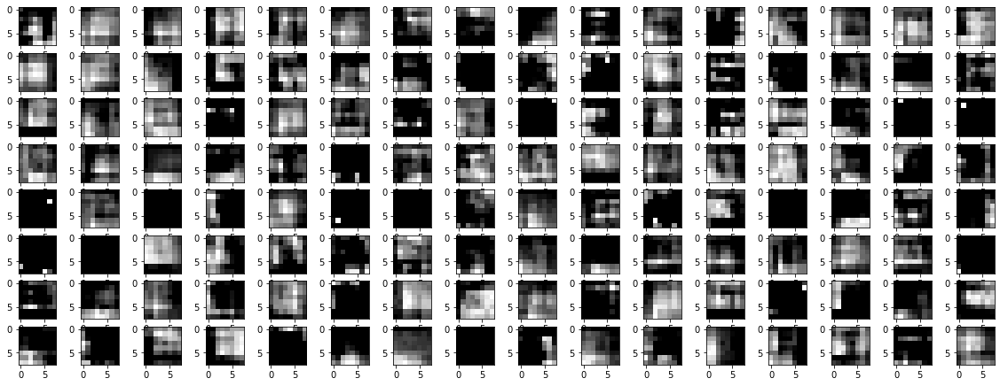

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# optimizer Adam and filter 64,128,256,512

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model_48"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_14 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_48 (Conv2D)             (None, 32, 32, 64)   1792        ['input_13[0][0]']               
                                                                                                  
 conv2d_52 (Conv2D)             (None, 32, 32, 64)   1792        ['input_14[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_48 (None, 32, 32, 64)
3 conv2d_52 (None, 32, 32, 64)
8 conv2d_49 (None, 16, 16, 128)
9 conv2d_53 (None, 16, 16, 128)
14 conv2d_50 (None, 8, 8, 256)
15 conv2d_54 (None, 8, 8, 256)
20 conv2d_51 (None, 4, 4, 512)
21 conv2d_55 (None, 4, 4, 512)


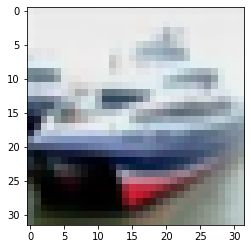

layer::::: 1


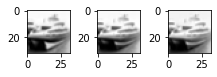

layer::::: 2


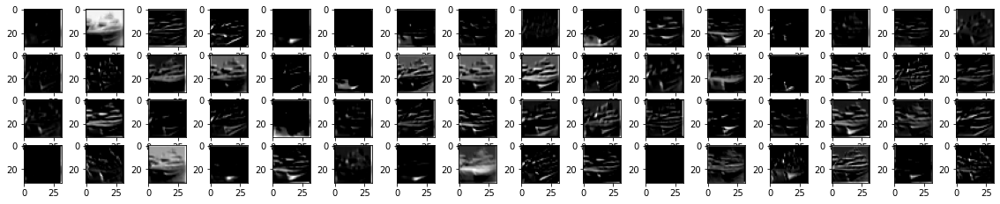

layer::::: 3


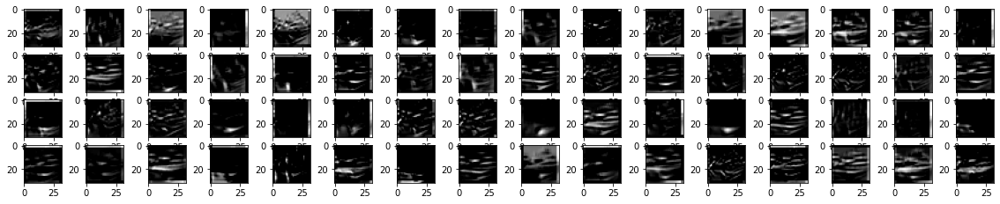

layer::::: 8


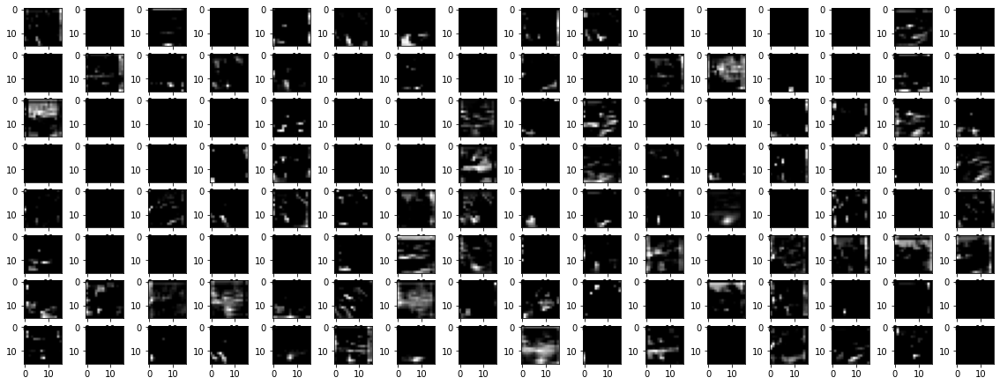

layer::::: 9


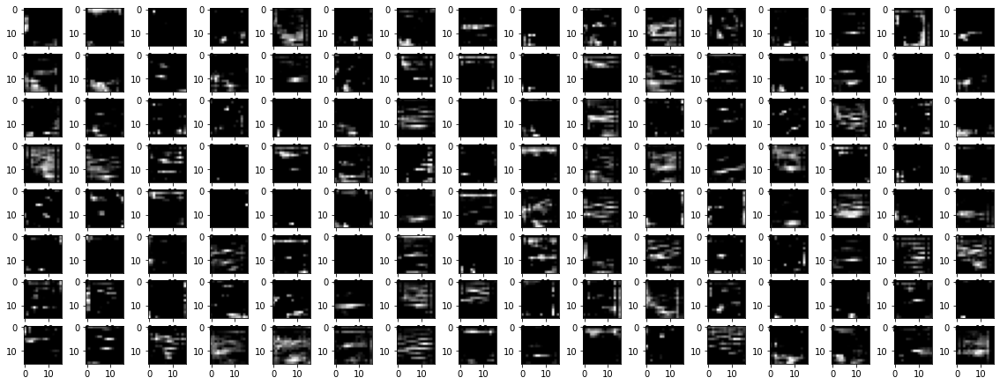

layer::::: 14


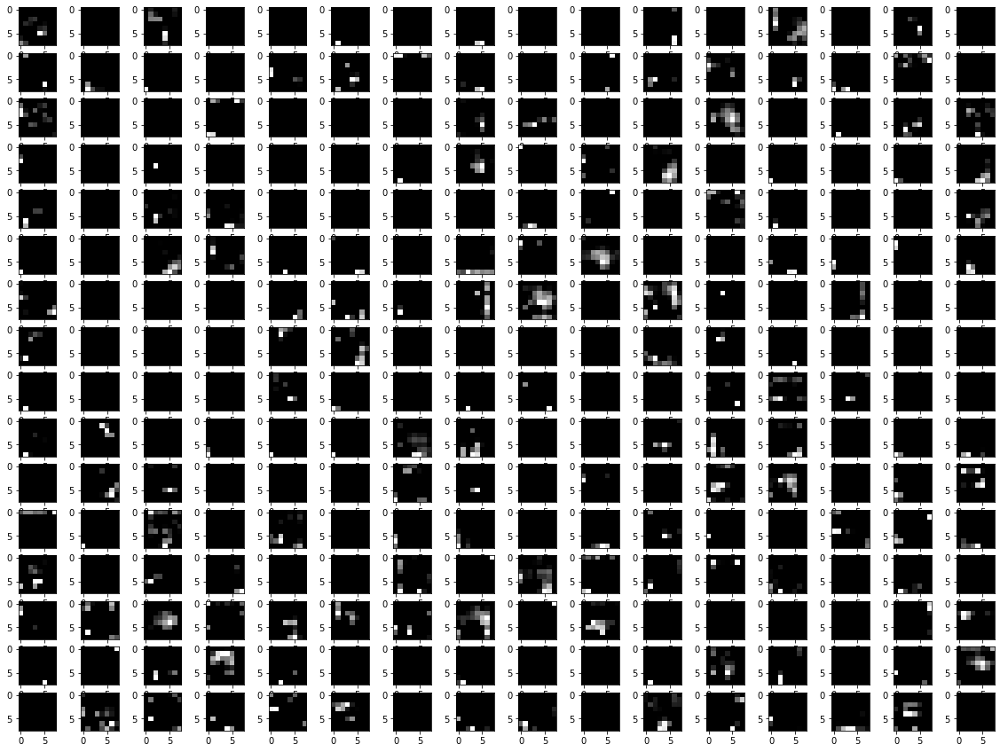

layer::::: 15


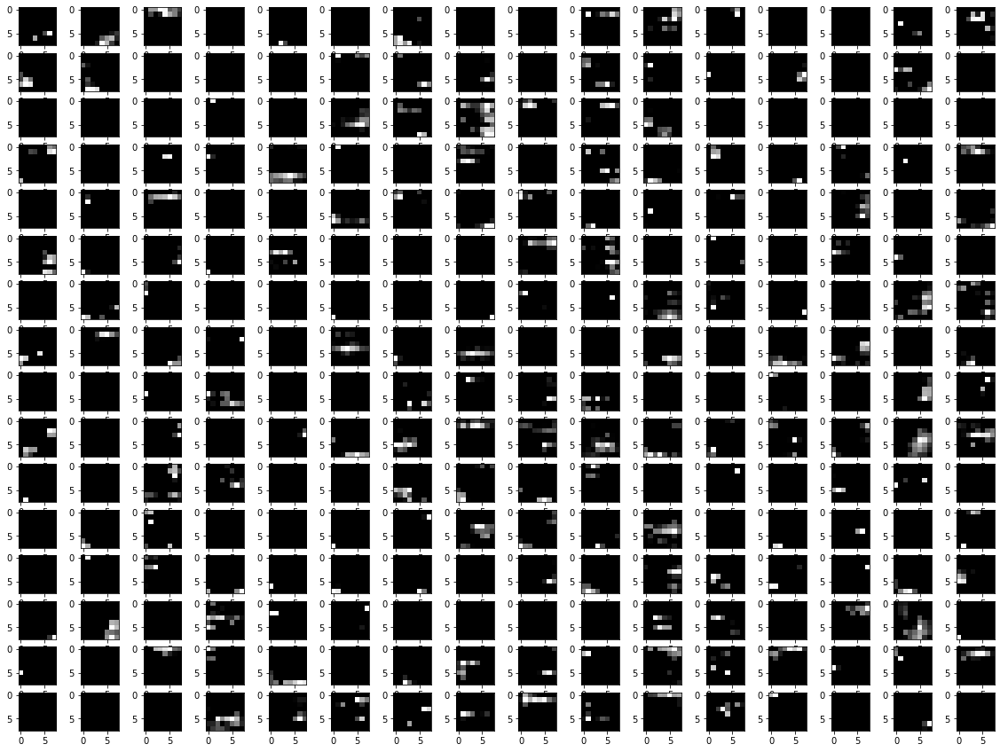

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

Model: "model_56"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_16 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_56 (Conv2D)             (None, 32, 32, 64)   1792        ['input_15[0][0]']               
                                                                                                  
 conv2d_60 (Conv2D)             (None, 32, 32, 64)   1792        ['input_16[0][0]']               
                                                                                           

2 conv2d_56 (None, 32, 32, 64)
3 conv2d_60 (None, 32, 32, 64)
8 conv2d_57 (None, 16, 16, 128)
9 conv2d_61 (None, 16, 16, 128)
14 conv2d_58 (None, 8, 8, 256)
15 conv2d_62 (None, 8, 8, 256)
20 conv2d_59 (None, 4, 4, 512)
21 conv2d_63 (None, 4, 4, 512)


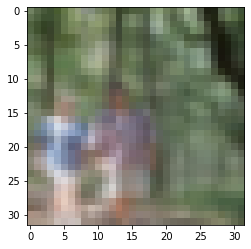

layer::::: 1


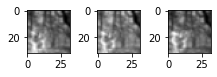

layer::::: 2


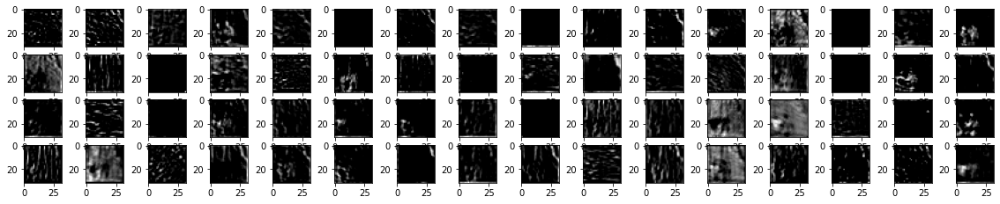

layer::::: 3


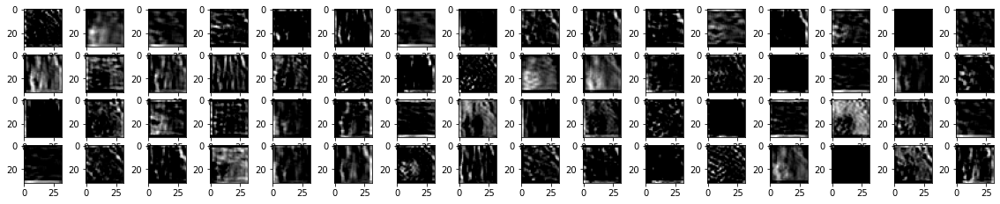

layer::::: 8


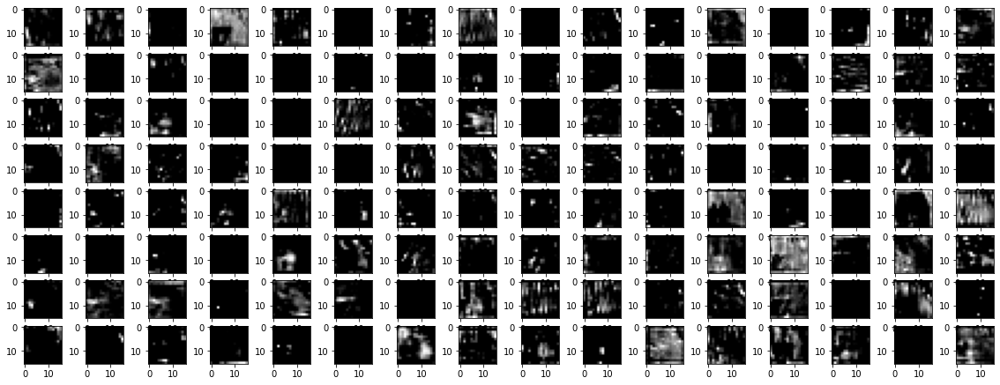

layer::::: 9


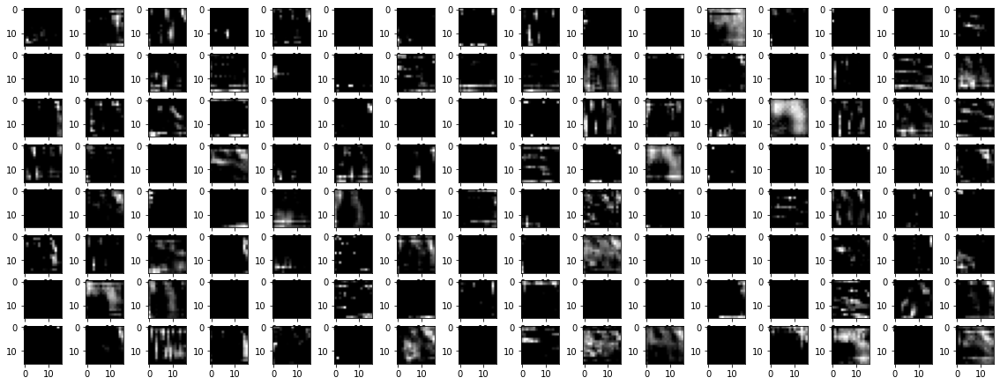

layer::::: 14


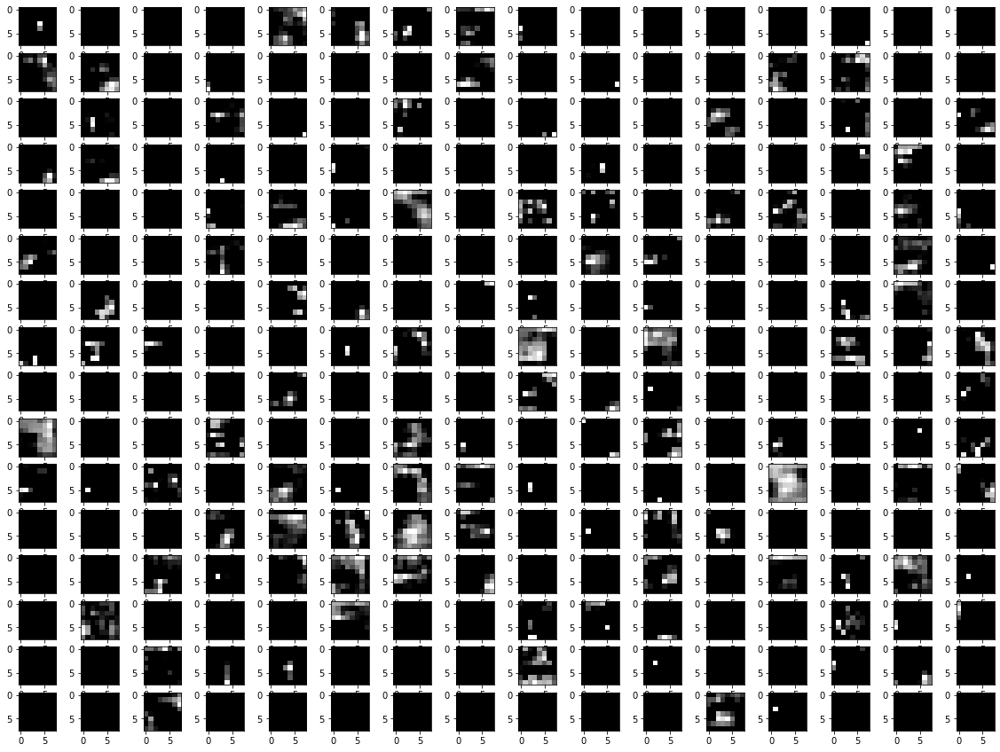

layer::::: 15


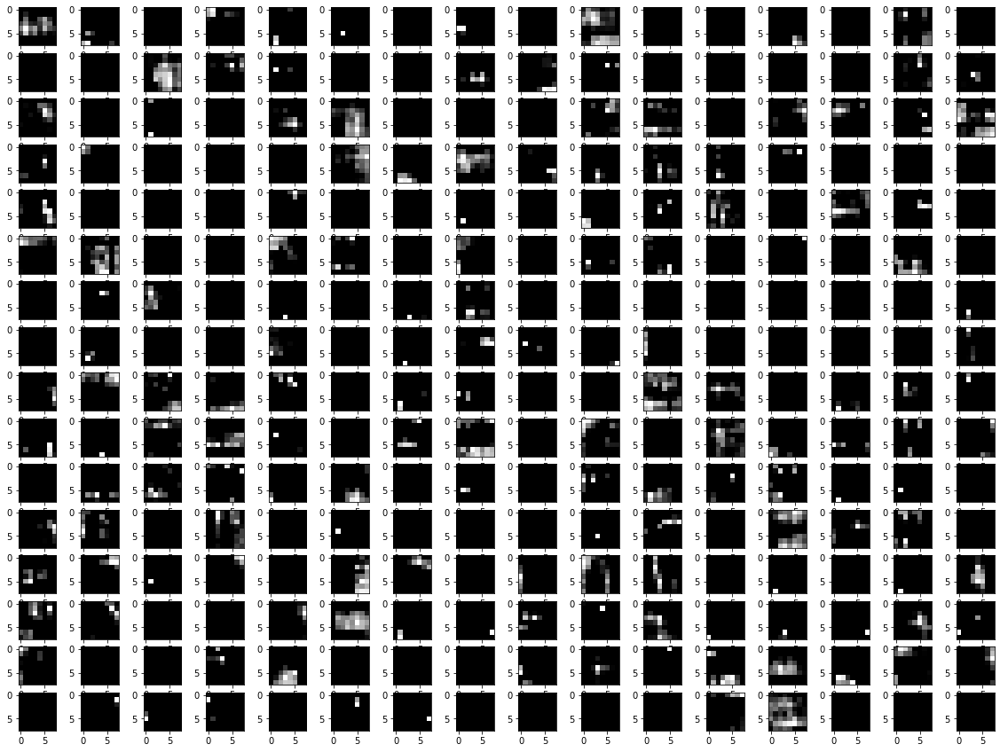

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,10)
model=train(model,'adam',25)

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_18 (Conv2D)             (None, 32, 32, 64)   1792        ['input_7[0][0]']                
                                                                                                  
 conv2d_21 (Conv2D)             (None, 32, 32, 64)   1792        ['input_8[0][0]']                
                                                                                            

In [ ]:
displaylayer(model)

2 conv2d_18 (None, 32, 32, 64)
3 conv2d_21 (None, 32, 32, 64)
8 conv2d_19 (None, 16, 16, 128)
9 conv2d_22 (None, 16, 16, 128)
14 conv2d_20 (None, 8, 8, 256)
15 conv2d_23 (None, 8, 8, 256)


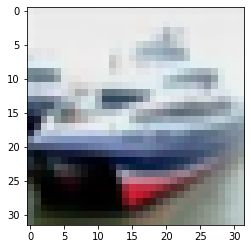

layer::::: 1


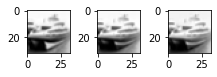

layer::::: 2


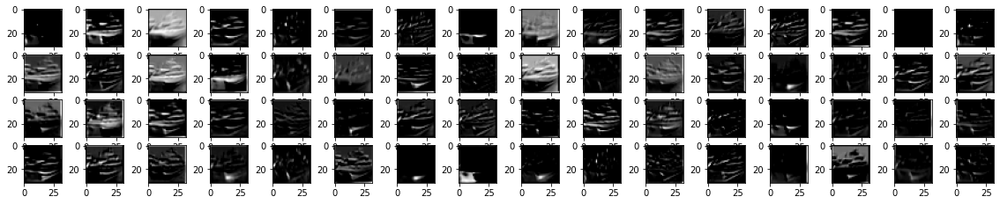

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'adam',25)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   1792        ['input_1[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 32, 32, 64)   1792        ['input_2[0][0]']                
                                                                                              

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Optimizer SGD and filter 64,128,256,512

# Dropout 0.4

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4

model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_6 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_16 (Conv2D)             (None, 32, 32, 64)   1792        ['input_5[0][0]']                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 32, 32, 64)   1792        ['input_6[0][0]']                
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_16 (None, 32, 32, 64)
3 conv2d_20 (None, 32, 32, 64)
8 conv2d_17 (None, 16, 16, 128)
9 conv2d_21 (None, 16, 16, 128)
14 conv2d_18 (None, 8, 8, 256)
15 conv2d_22 (None, 8, 8, 256)
20 conv2d_19 (None, 4, 4, 512)
21 conv2d_23 (None, 4, 4, 512)


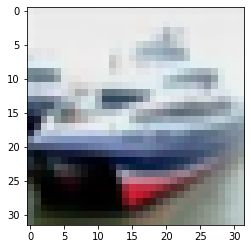

layer::::: 1


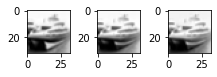

layer::::: 2


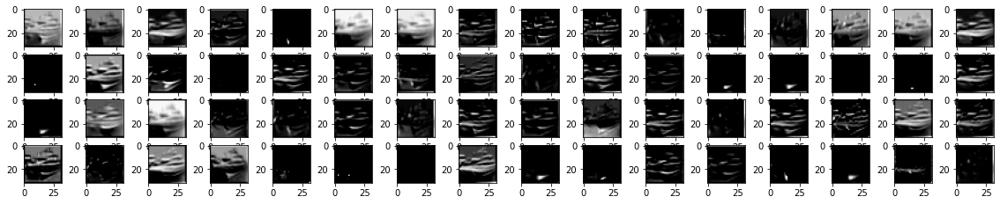

layer::::: 3


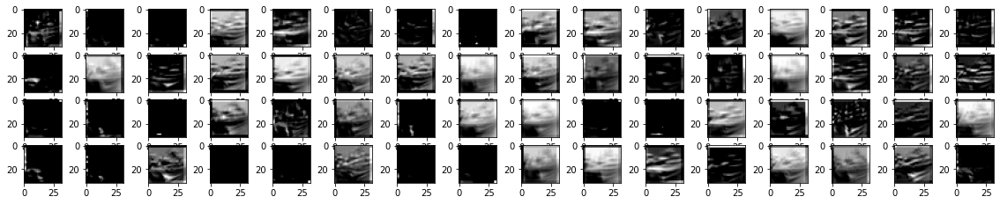

layer::::: 8


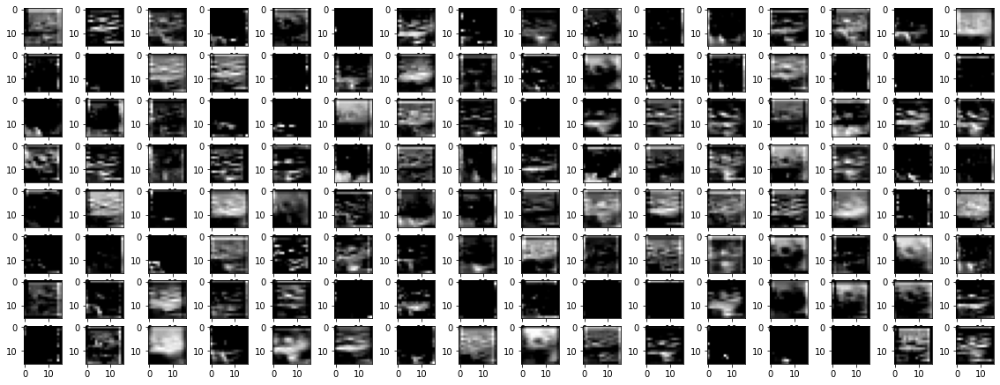

layer::::: 9


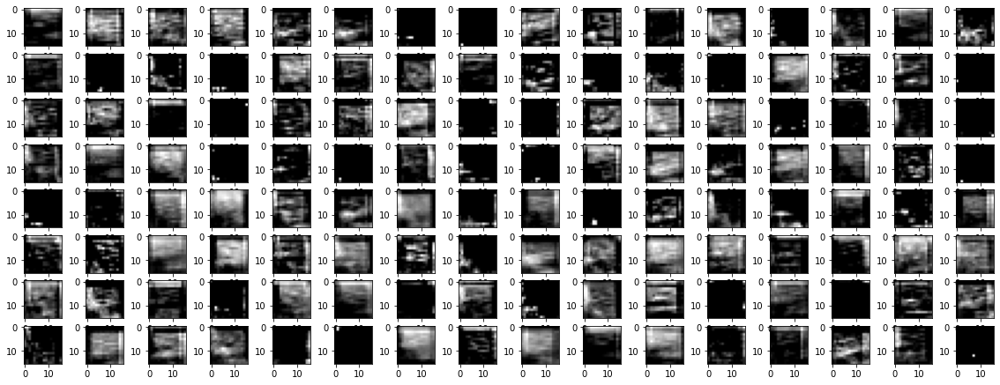

layer::::: 14


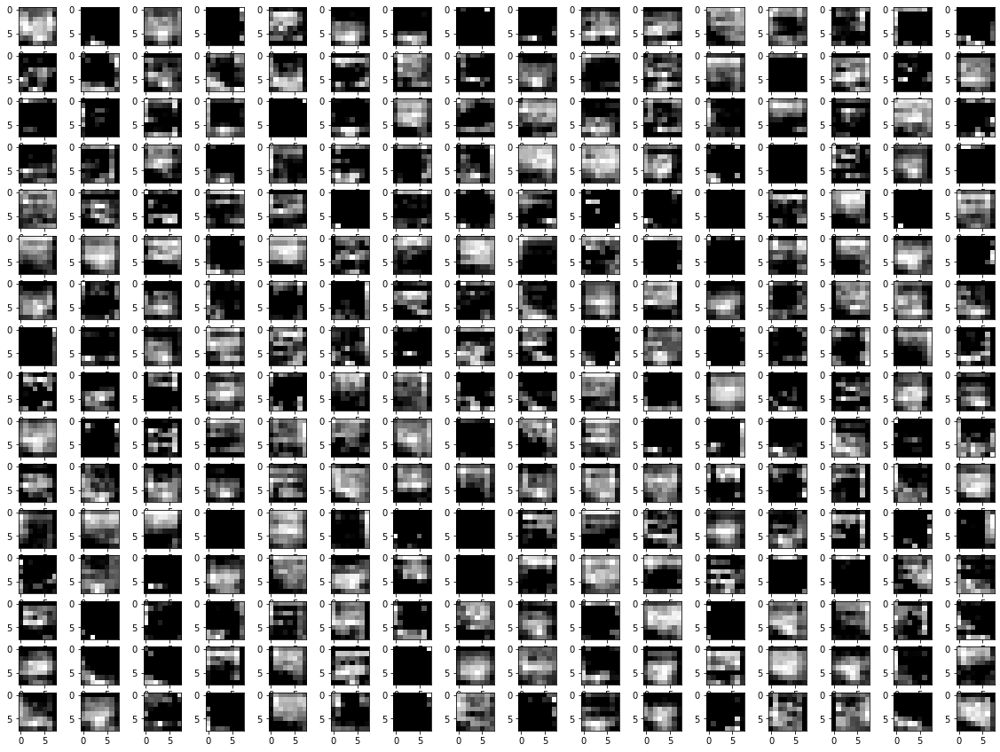

layer::::: 15


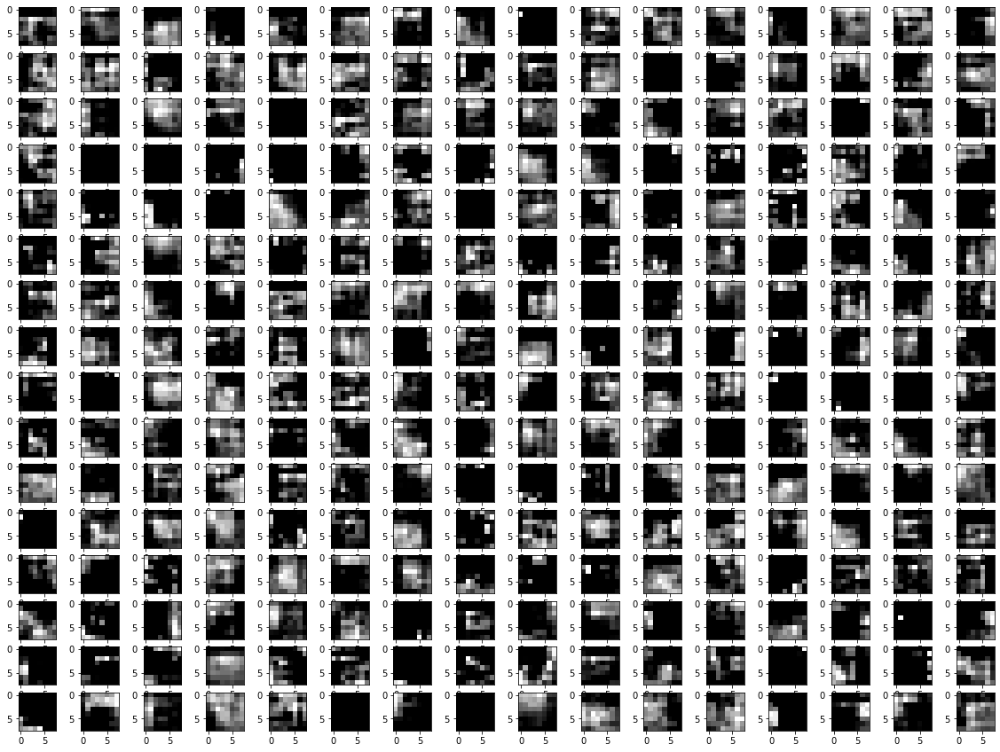

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.4
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

Model: "model_24"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_24 (Conv2D)             (None, 32, 32, 64)   1792        ['input_7[0][0]']                
                                                                                                  
 conv2d_28 (Conv2D)             (None, 32, 32, 64)   1792        ['input_8[0][0]']                
                                                                                           

2 conv2d_24 (None, 32, 32, 64)
3 conv2d_28 (None, 32, 32, 64)
8 conv2d_25 (None, 16, 16, 128)
9 conv2d_29 (None, 16, 16, 128)
14 conv2d_26 (None, 8, 8, 256)
15 conv2d_30 (None, 8, 8, 256)
20 conv2d_27 (None, 4, 4, 512)
21 conv2d_31 (None, 4, 4, 512)


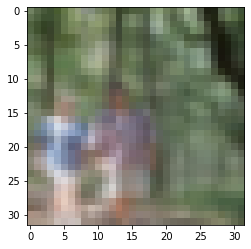

layer::::: 1


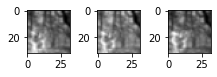

layer::::: 2


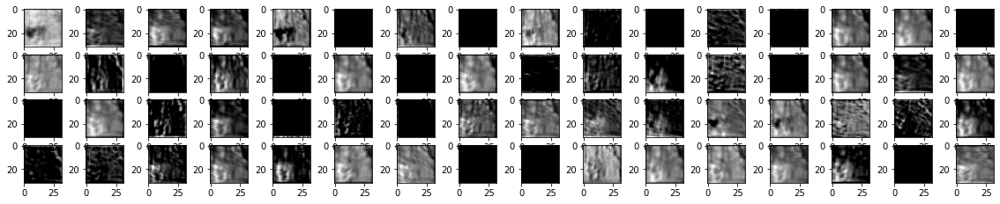

layer::::: 3


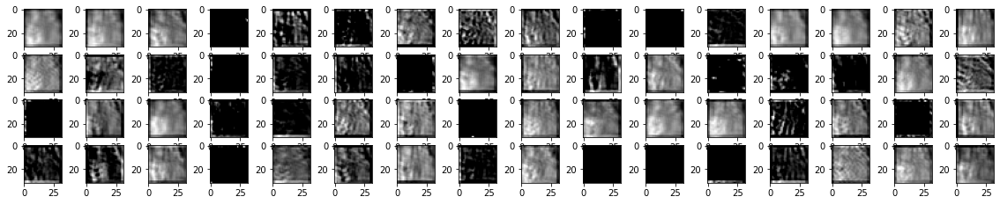

layer::::: 8


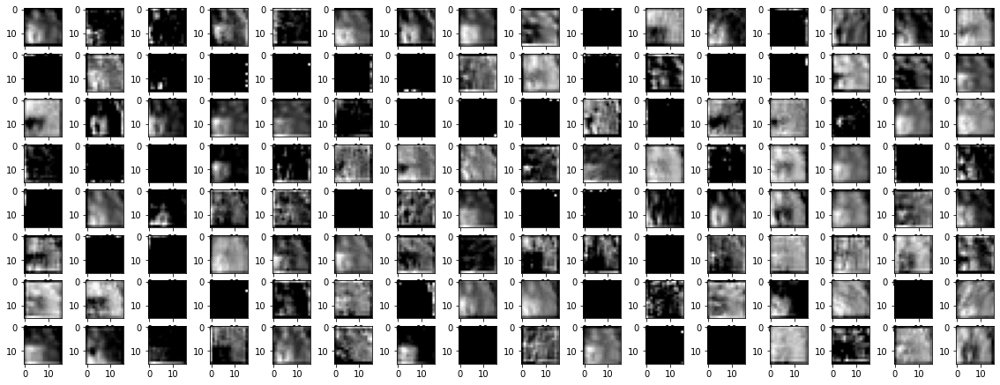

layer::::: 9


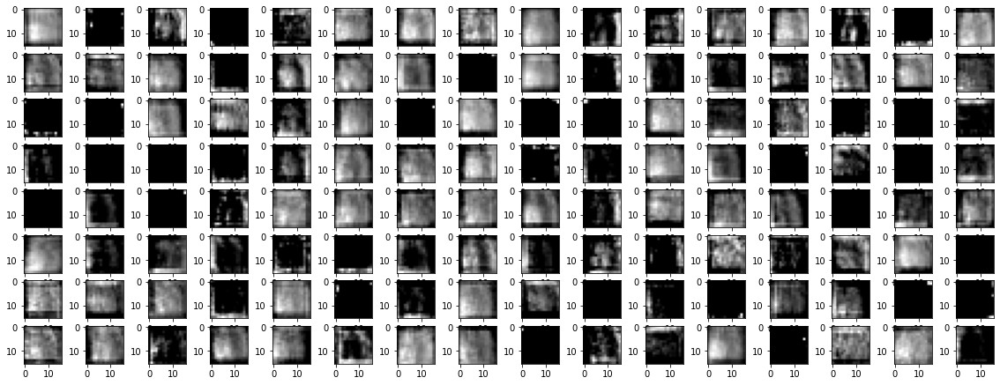

layer::::: 14


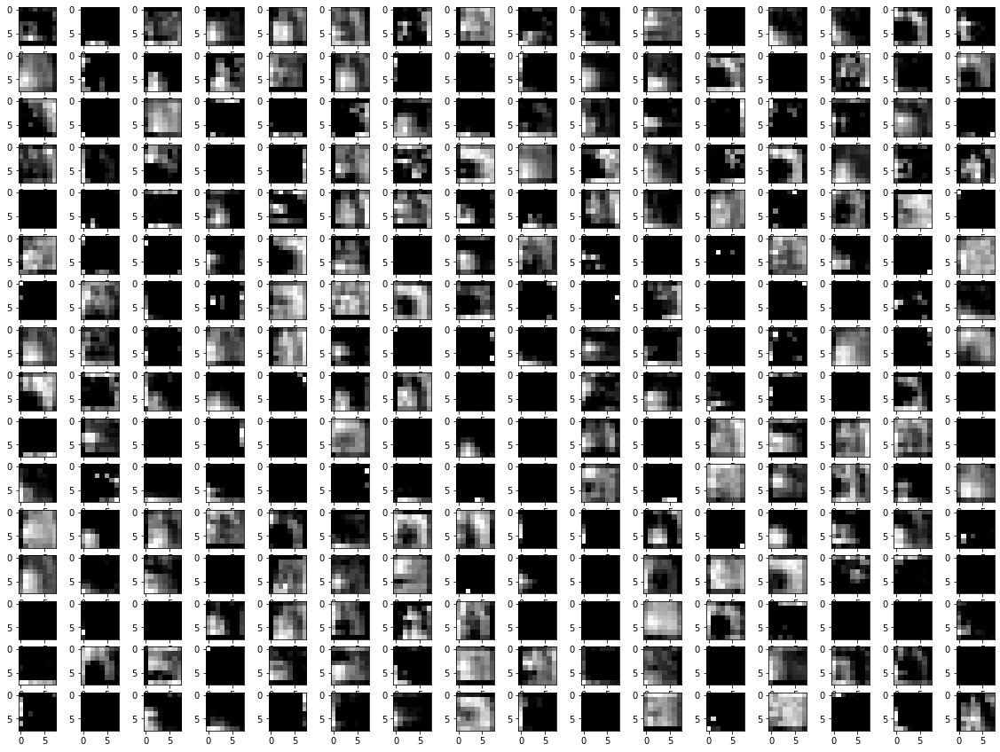

layer::::: 15


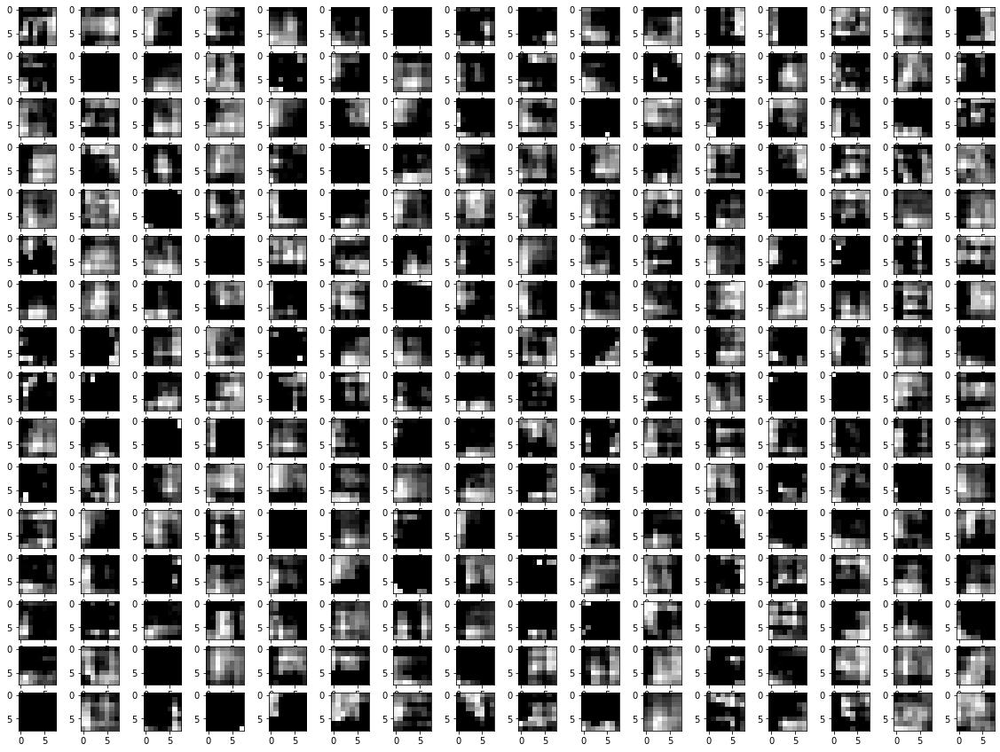

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1

# Dropout 0.3

** CIFAR 10**

In [ ]:
x_train,y_train,x_test, y_test=dataset(1)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,10)
model=train(model,'SGD',25)

Model: "model_32"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_10 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_32 (Conv2D)             (None, 32, 32, 64)   1792        ['input_9[0][0]']                
                                                                                                  
 conv2d_36 (Conv2D)             (None, 32, 32, 64)   1792        ['input_10[0][0]']               
                                                                                           

In [ ]:
displaylayer(model)

2 conv2d_32 (None, 32, 32, 64)
3 conv2d_36 (None, 32, 32, 64)
8 conv2d_33 (None, 16, 16, 128)
9 conv2d_37 (None, 16, 16, 128)
14 conv2d_34 (None, 8, 8, 256)
15 conv2d_38 (None, 8, 8, 256)
20 conv2d_35 (None, 4, 4, 512)
21 conv2d_39 (None, 4, 4, 512)


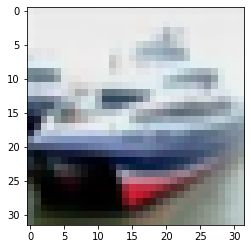

layer::::: 1


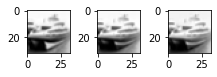

layer::::: 2


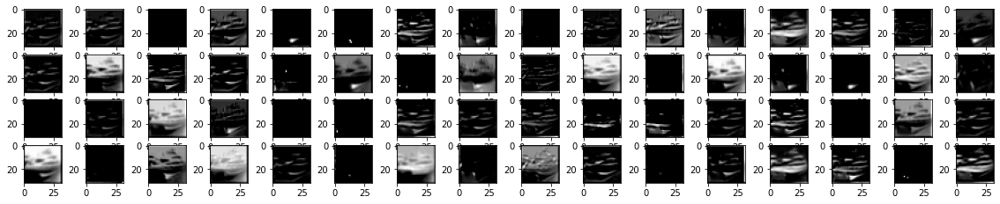

layer::::: 3


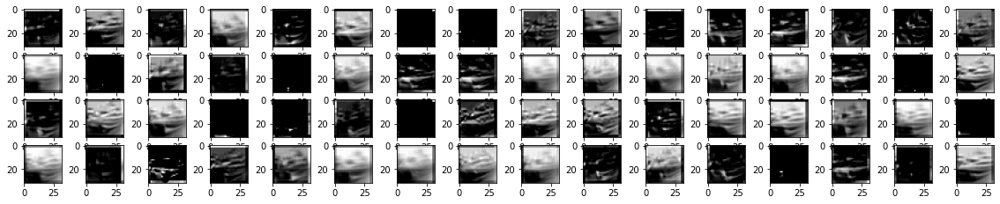

layer::::: 8


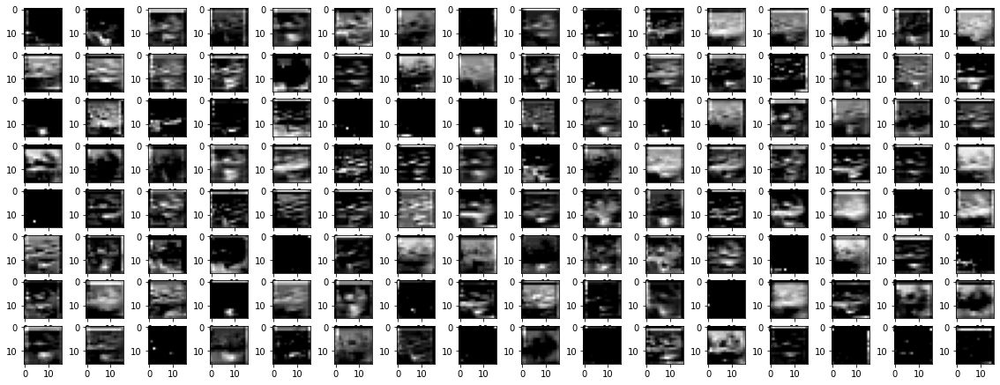

layer::::: 9


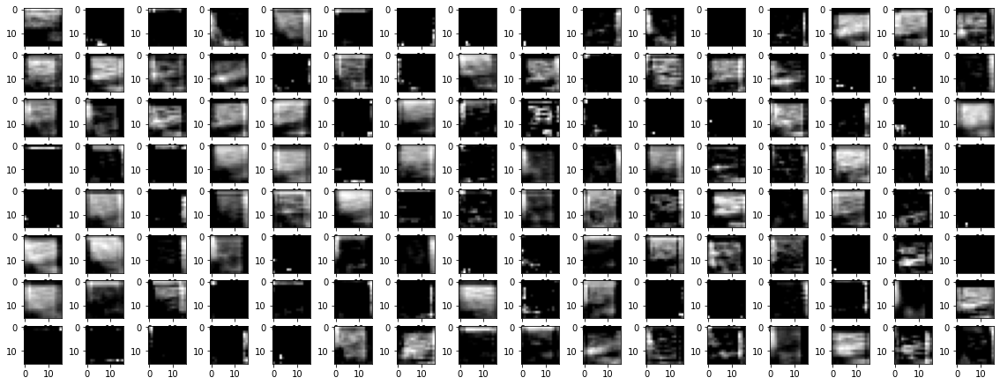

layer::::: 14


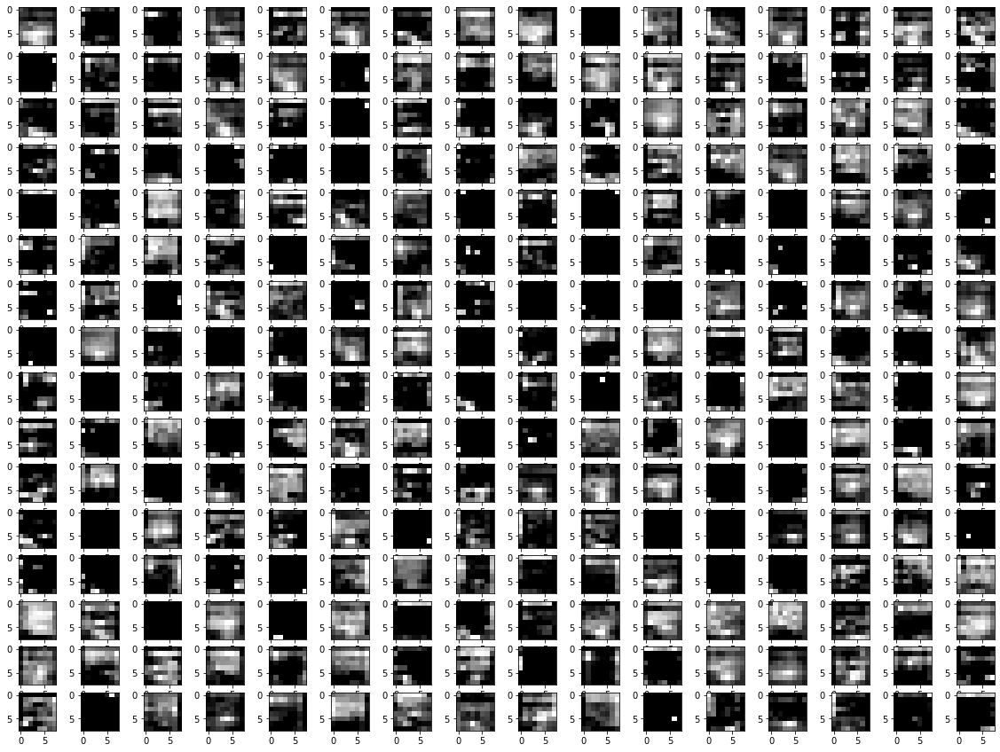

layer::::: 15


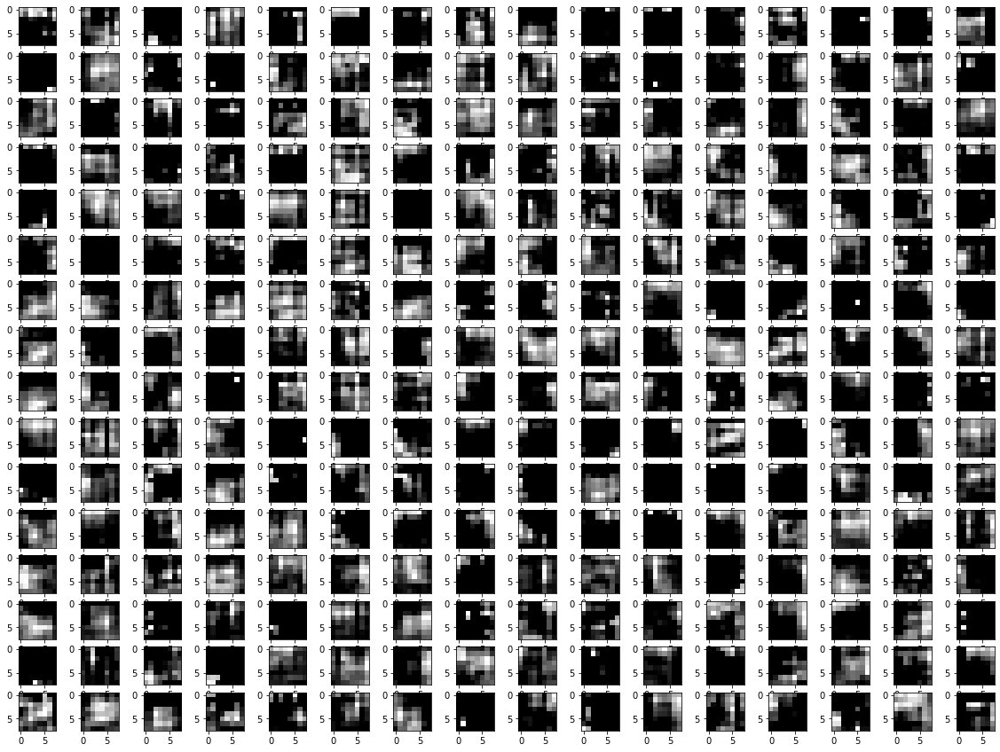

In [ ]:
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  
  featuremap(fig,features,16)

In [ ]:
count=1

path="model"+str(count)+".h5"
model.save(path)
count+=1

**CIFAR 100**

In [ ]:
x_train,y_train,x_test, y_test=dataset(2)
start_filter=64
x,y,left_inputs,right_inputs=right_left_branch(start_filter)
dropout=0.3
model=conc_network(x,y,dropout,100)
model=train(model,'SGD',25)

Model: "model_40"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 input_12 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_40 (Conv2D)             (None, 32, 32, 64)   1792        ['input_11[0][0]']               
                                                                                                  
 conv2d_44 (Conv2D)             (None, 32, 32, 64)   1792        ['input_12[0][0]']               
                                                                                           

2 conv2d_40 (None, 32, 32, 64)
3 conv2d_44 (None, 32, 32, 64)
8 conv2d_41 (None, 16, 16, 128)
9 conv2d_45 (None, 16, 16, 128)
14 conv2d_42 (None, 8, 8, 256)
15 conv2d_46 (None, 8, 8, 256)
20 conv2d_43 (None, 4, 4, 512)
21 conv2d_47 (None, 4, 4, 512)


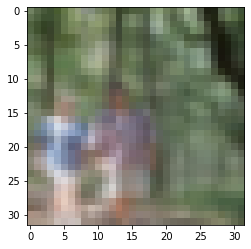

layer::::: 1


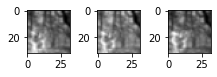

layer::::: 2


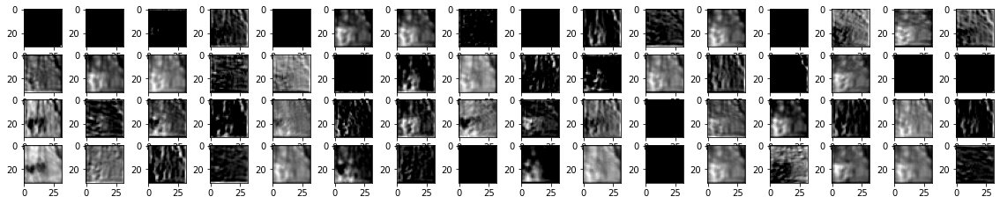

In [ ]:
displaylayer(model)
imgplot = plt.imshow(x_test[1])
plt.show()
for i in [1,2,3,8,9,14,15]:
  m = Model(inputs=model.inputs , outputs=model.layers[i].output)
  features = m.predict([x_test[1:],x_test[1:]])

  fig = pyplot.figure(figsize=(20,15))
  print("layer:::::",i)
  featuremap(fig,features,16)

In [ ]:
path="model"+str(count)+".h5"
model.save(path)
count+=1